In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
plt.rcParams['figure.dpi'] = 200

In [ ]:
pip install geopandas libpysal esda tobler cenpy==1.0.0post2 h3 watermark scikit-gstat splot

     |████████████████████████████████| 1.0 MB 5.0 MB/s 
     |████████████████████████████████| 2.4 MB 54.5 MB/s 
     |████████████████████████████████| 95 kB 2.6 MB/s 
     |████████████████████████████████| 1.1 MB 44.0 MB/s 
     |████████████████████████████████| 2.1 MB 41.6 MB/s 
     |████████████████████████████████| 1.0 MB 48.8 MB/s 
     |████████████████████████████████| 6.3 MB 32.4 MB/s 
     |████████████████████████████████| 16.7 MB 347 kB/s 
     |████████████████████████████████| 2.1 MB 40.7 MB/s 
     |████████████████████████████████| 19.3 MB 383 kB/s 
     |████████████████████████████████| 209 kB 59.7 MB/s 
     |████████████████████████████████| 60 kB 6.1 MB/s 
     |████████████████████████████████| 179 kB 23.7 MB/s 
     |████████████████████████████████| 130 kB 43.0 MB/s 
  Created wheel for cenpy: filename=cenpy-1.0.0.post2-py3-none-any.whl size=29000 sha256=83f11fdaef140b33a353d7440f80ad7b22acb423be9e935124585f87542668bd
  Stored in directory: /root/.cache/pip

In [ ]:
import geopandas as gpd
import esda
import libpysal
from cenpy import products
from tobler.util import h3fy
from tobler.area_weighted import area_join
import skgstat as skg
from libpysal import weights
from splot.esda import moran_scatterplot 

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string
/usr/local/lib/python3.7/dist-packages/fuzzywuzzy/fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')
/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
pip install geoplot

     |████████████████████████████████| 10.8 MB 7.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 35.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 10.8 MB 37.8 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... error
     |████████████████████████████████| 12.1 MB 45.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 46 kB 3.0 MB/s 
  Created wheel for cartopy: filename=Cartopy-0.19.0.post1-cp37-cp37m-linux_x86_64.whl size=12516283 sha256=1b499b03b0ac36a3e7a3a0b676bf2bac78d3a134c1e0b70ce7aef84d7236d551
  Stored in directory: /root/.cache/pip/wheels/98/01/f7/bd10aeb96fe4b518cde5f7c4f5e12c7202f85b7353a5017847
Successfully built cartopy


In [ ]:
import geoplot

In [ ]:
%load_ext watermark
%watermark -d -u -p libpysal,esda,tobler,h3,cenpy,skgstat,splot

Last updated: 2022-05-09

libpysal: 4.6.2
esda    : 2.4.1
tobler  : 0.9.0
h3      : 3.7.4
cenpy   : 1.0.0.post2
skgstat : 1.0.1
splot   : 1.1.5.post1



In [ ]:
sns.set_theme(style="white")

## read in warrants and Census data

In [ ]:
path = '/content/drive/MyDrive/DDMPE - Group Project/'

In [ ]:
warrants = gpd.read_file(f'{path}processed data/ids_with_tracts.geojson')

In [ ]:
warrants = warrants.rename(columns={'Status_y':'Status'})

In [ ]:
warrants = warrants[['ID','Name','GEOID','Citation','Balance Due','Type','Status','geometry']]

In [ ]:
warrants['Status'].value_counts()

WARRANT                                39073
TERMINATED                             10640
COMMITMENT                              6067
Terminated Admin                        2617
JUDGE TO SIGN                           1280
EXTENSION                               1040
Ineligible for Capias                    434
Set on Docket                            157
TBS - CMAD                                78
TBS - Environmental Docket                60
TBS - Traffic Appearance Docket           49
DEFERRED DISPOSITION                      42
TRANSFERRED OUT                           42
Document Sent to Judge for Approval       41
TBS - JTRI                                29
TBS - ATAD                                18
TBS - Revocation Hearing                  10
Ineligible for Capias Pro Fine             9
JAIL                                       8
ARRESTED                                   2
TBS - BTRI                                 2
Name: Status, dtype: int64

In [ ]:
warrants.shape

(62382, 8)

In [ ]:
warrants['ID'].nunique()

20621

In [ ]:
warrants = warrants[warrants['Status'].isin(['WARRANT', 'COMMITMENT'])]

In [ ]:
warrants.shape

(45140, 8)

In [ ]:
warrants['ID'].nunique()

19207

In [ ]:
acs_vars = {'B01003_001E':'total population',
 'B25070_010E': 'total: paying >50 percent of income on rent',
 'B25070_001E':'[denominator: total population for income on rent]',
 'B06011_001E':'median income'
}

In [ ]:
acs = products.ACS(2019)
travis_tracts, travis  = acs.from_county('Travis County, TX',
                                         variables = list(acs_vars.keys()), 
                                         return_bounds=True,
                                         return_geometry=True)

/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.7/dist-packages/cenpy/products.py:628: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  return self._from_name(county

In [ ]:
travis_tracts = travis_tracts.rename(columns=acs_vars)

## crs

In [ ]:
warrants.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
travis.crs

<Projected CRS: EPSG:32040>
Name: NAD27 / Texas South Central
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - Texas - counties of Aransas; Atascosa; Austin; Bandera; Bee; Bexar; Brazoria; Brewster; Caldwell; Calhoun; Chambers; Colorado; Comal; De Witt; Dimmit; Edwards; Fayette; Fort Bend; Frio; Galveston; Goliad; Gonzales; Guadalupe; Harris; Hays; Jackson; Jefferson; Karnes; Kendall; Kerr; Kinney; La Salle; Lavaca; Live Oak; Matagorda; Maverick; McMullen; Medina; Presidio; Real; Refugio; Terrell; Uvalde; Val Verde; Victoria; Waller; Wharton; Wilson; Zavala. Gulf of Mexico outer continental shelf (GoM OCS) protraction areas: Matagorda Island; Brazos; Galveston; High Island, Sabine Pass (TX).
- bounds: (-105.0, 27.78, -93.41, 30.67)
Coordinate Operation:
- name: Texas CS27 South Central zone
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1927
- Ellipsoid: Clarke 1866
- Prime M

In [ ]:
# change to local projected coordinate reference

warrants.to_crs('EPSG:32040', inplace=True)
travis.to_crs('EPSG:32040', inplace=True)
travis_tracts.to_crs('EPSG:32040', inplace=True)


(2248313.4207823486, 2526710.207530217, 787935.4107495325, 1028619.216593113)

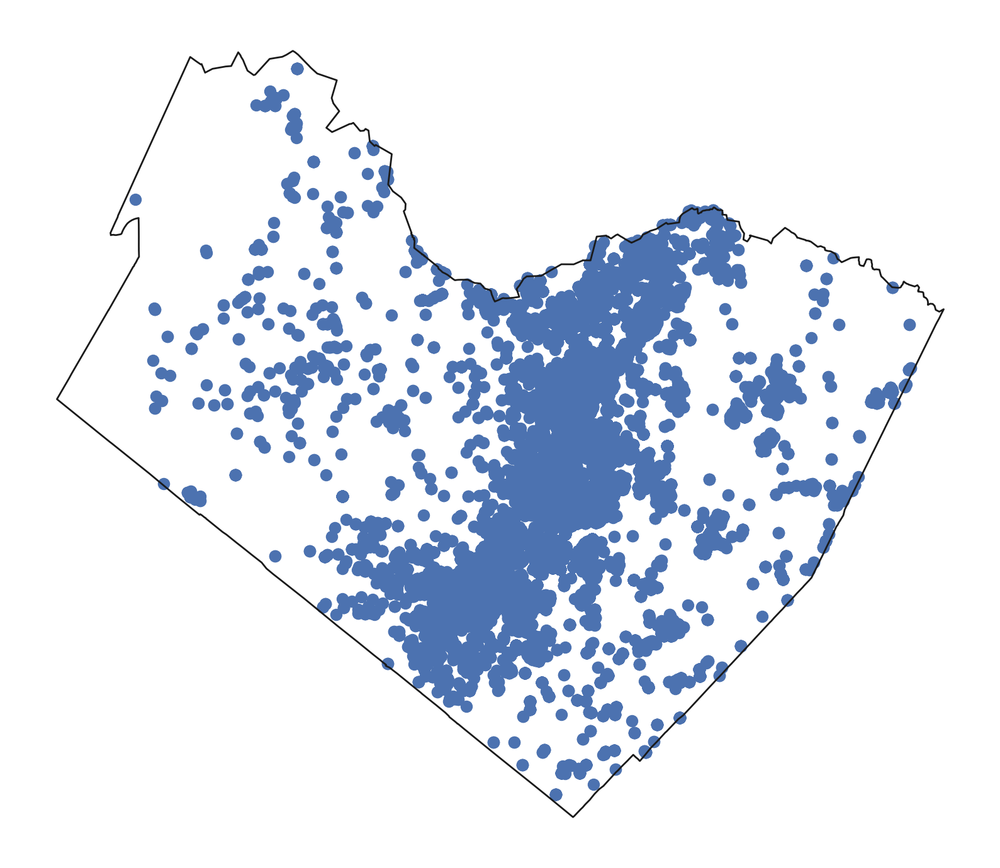

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))

warrants.plot(ax=ax)
travis.plot(ax=ax, facecolor='none', edgecolor='k')

plt.axis('off')

In [ ]:
warrants['ID'].nunique()

19207

## make hex bins, join data to hex bins

In [ ]:
travis_hex = h3fy(travis, resolution=8)

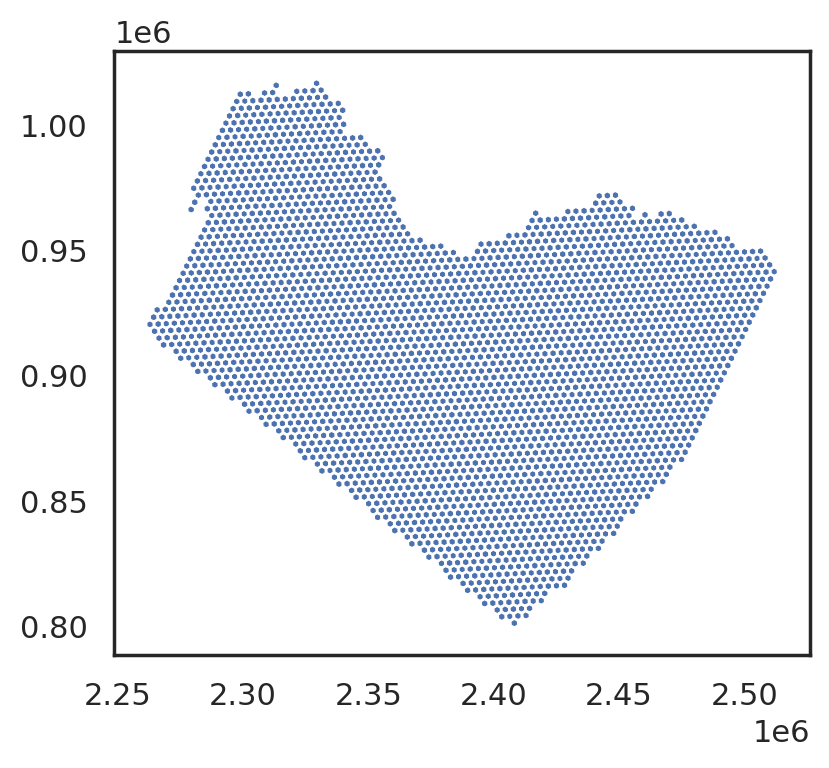

In [ ]:
travis_hex.plot()

In [ ]:
travis_hex.shape

(3159, 1)

In [ ]:
travis_hex = h3fy(travis, resolution=7, clip=True)

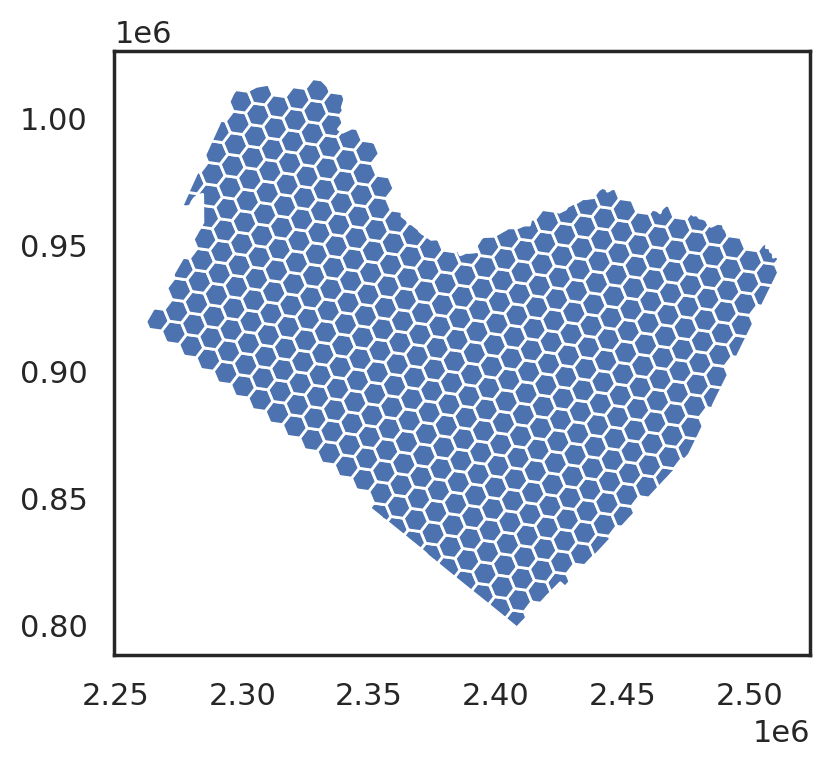

In [ ]:
travis_hex.plot()

In [ ]:
travis_hex.shape

(449, 1)

In [ ]:
travis_hex_with_income = area_join(
    source_df=travis_tracts, 
    target_df=travis_hex, 
    variables=['median income'])

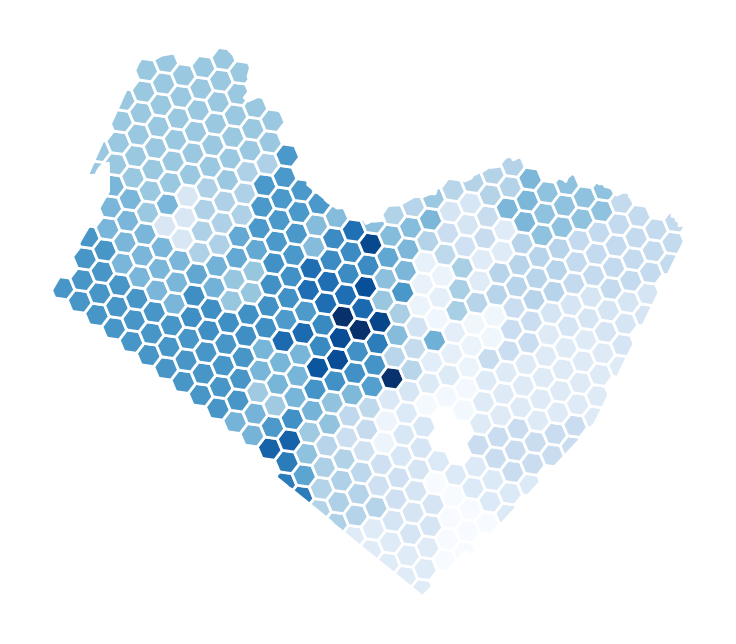

In [ ]:
travis_hex_with_income.plot(column='median income', cmap='Blues')
plt.axis('off');

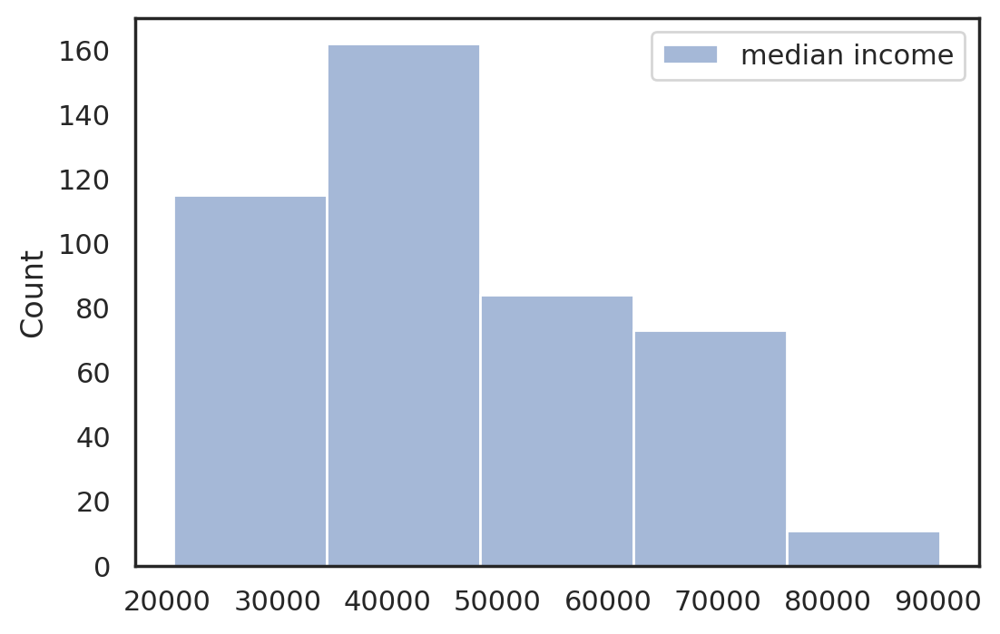

In [ ]:
sns.histplot(data=travis_hex_with_income, bins=5)

In [ ]:
warrants_hexbin = gpd.sjoin(warrants, travis_hex).rename(columns={'index_right':'hex_id'})

In [ ]:
warrants_by_hexbin = warrants_hexbin.groupby('hex_id').agg({'ID':'count','GEOID':'min'}).rename(columns={'ID':'count'})

In [ ]:
warrants_by_hexbin = travis_hex.join(warrants_by_hexbin)

(2266796.9598637135, 2523218.190973088, 791913.07215935, 1026262.0186638985)

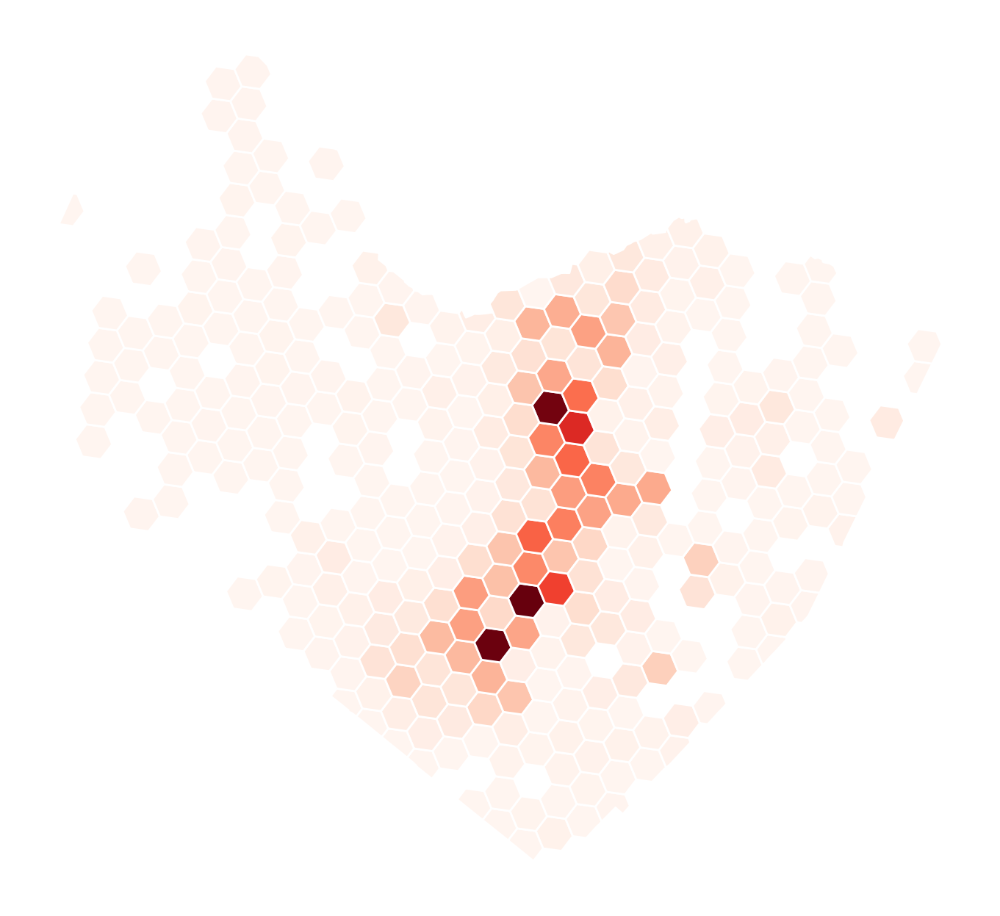

In [ ]:
fig, ax = plt.subplots(figsize=(10,8), dpi=200)

warrants_by_hexbin.plot(
    column='count', 
    cmap='Reds',
    ax=ax)
plt.axis('off')


In [ ]:
warrants_by_hex_centroid = gpd.GeoDataFrame(data=warrants_by_hexbin['count'],
                                            geometry=warrants_by_hexbin.centroid)

In [ ]:
warrants_by_hex_centroid

,count,geometry
hex_id,,
87489eaabffffff,NaN,POINT (2408083.779 802827.426)
87489ea8dffffff,47.0,POINT (2409260.629 809798.529)
87489ea88ffffff,7.0,POINT (2416896.415 813232.487)
87489ea8affffff,10.0,POINT (2424473.665 817502.416)
87489ea89ffffff,3.0,POINT (2410312.598 818292.581)
...,...,...
87489850dffffff,11.0,POINT (2328637.419 1002537.049)
874898570ffffff,NaN,POINT (2313953.674 1004611.689)
874898508ffffff,NaN,POINT (2336217.874 1005790.360)


In [ ]:
warrants_by_hex_centroid

,count,geometry
hex_id,,
87489eaabffffff,NaN,POINT (2408083.779 802827.426)
87489ea8dffffff,47.0,POINT (2409260.629 809798.529)
87489ea88ffffff,7.0,POINT (2416896.415 813232.487)
87489ea8affffff,10.0,POINT (2424473.665 817502.416)
87489ea89ffffff,3.0,POINT (2410312.598 818292.581)
...,...,...
87489850dffffff,11.0,POINT (2328637.419 1002537.049)
874898570ffffff,NaN,POINT (2313953.674 1004611.689)
874898508ffffff,NaN,POINT (2336217.874 1005790.360)


In [ ]:
warrants_by_hex_centroid_nonan = warrants_by_hex_centroid.dropna()

In [ ]:
hex_coords = np.stack(warrants_by_hex_centroid_nonan['geometry'].apply(lambda p: np.asarray(p)).values)

/usr/local/lib/python3.7/dist-packages/pandas/core/apply.py:1101: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  convert=self.convert_dtype,


## semivariogram

In [ ]:
semivariogram = skg.Variogram(hex_coords, warrants_by_hex_centroid_nonan['count'].values)

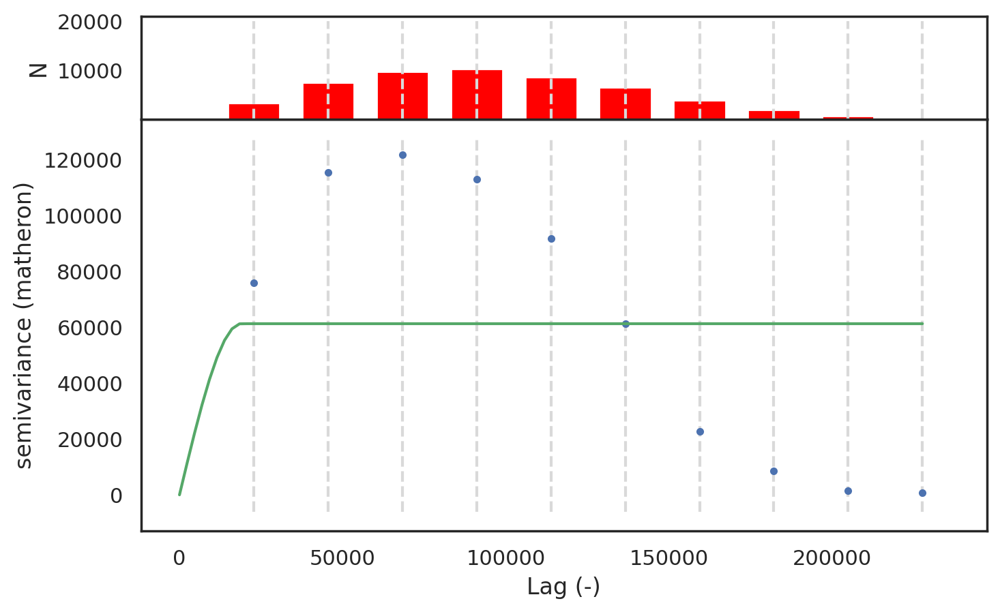

In [ ]:
fig = semivariogram.plot()


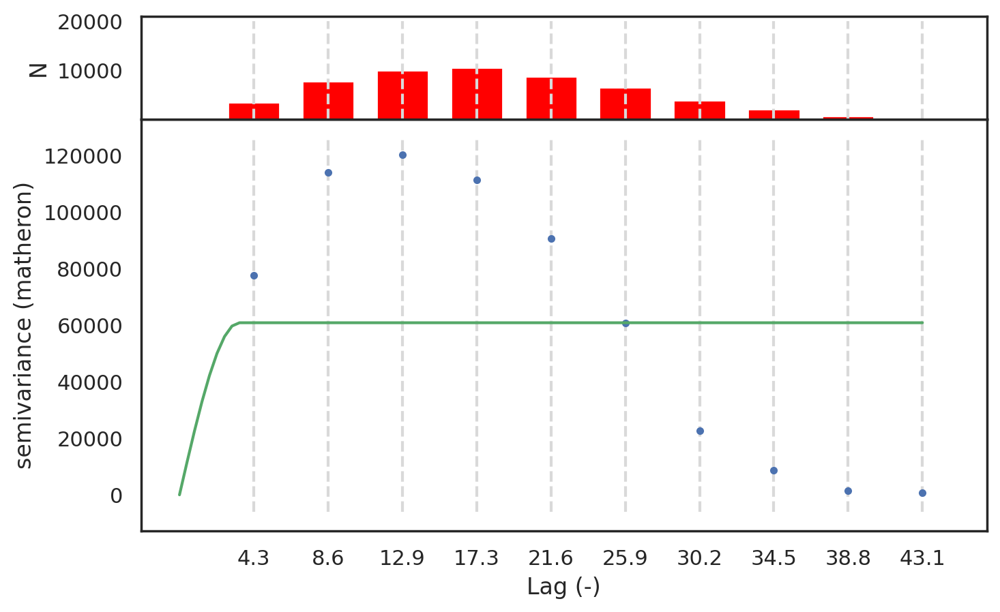

In [ ]:
fig = semivariogram.plot()

plt.xticks(
    semivariogram.bins, 
    (semivariogram.bins / 5280).round(1));


Text(0.5, 0, 'separating distance (miles)')

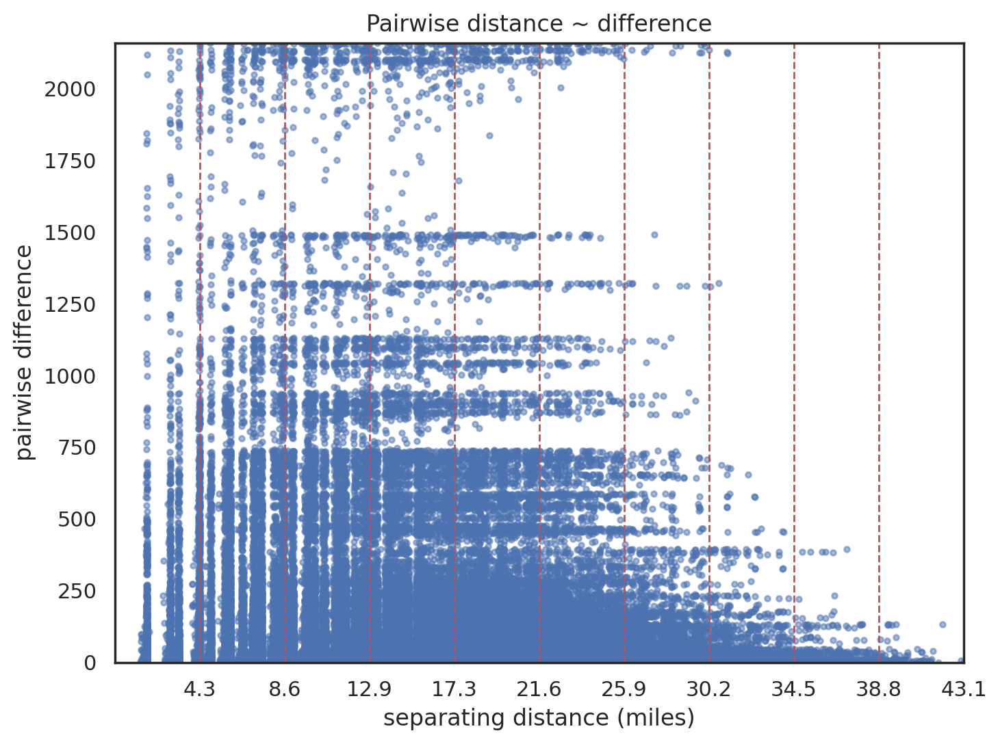

In [ ]:
semivariogram.distance_difference_plot();

plt.xticks(
    semivariogram.bins, 
    (semivariogram.bins / 5280).round(1));
plt.xlabel('separating distance (miles)')


In [ ]:
semivariogram.bins / 5280

array([ 4.31274243,  8.62548485, 12.93822728, 17.25096971, 21.56371213,
       25.87645456, 30.18919698, 34.50193941, 38.81468184, 43.12742426])

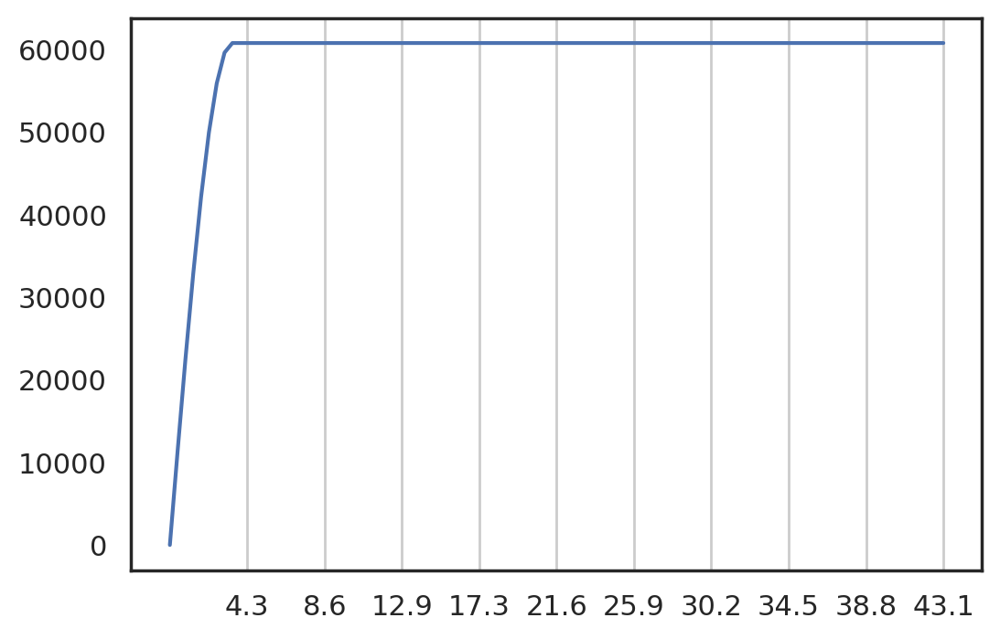

In [ ]:
theoretic_variogram = semivariogram.data()

plt.plot(theoretic_variogram[0],
         theoretic_variogram[1])

plt.xticks(
    semivariogram.bins, 
    (semivariogram.bins / 5280).round(1));
plt.grid(True,axis='x')



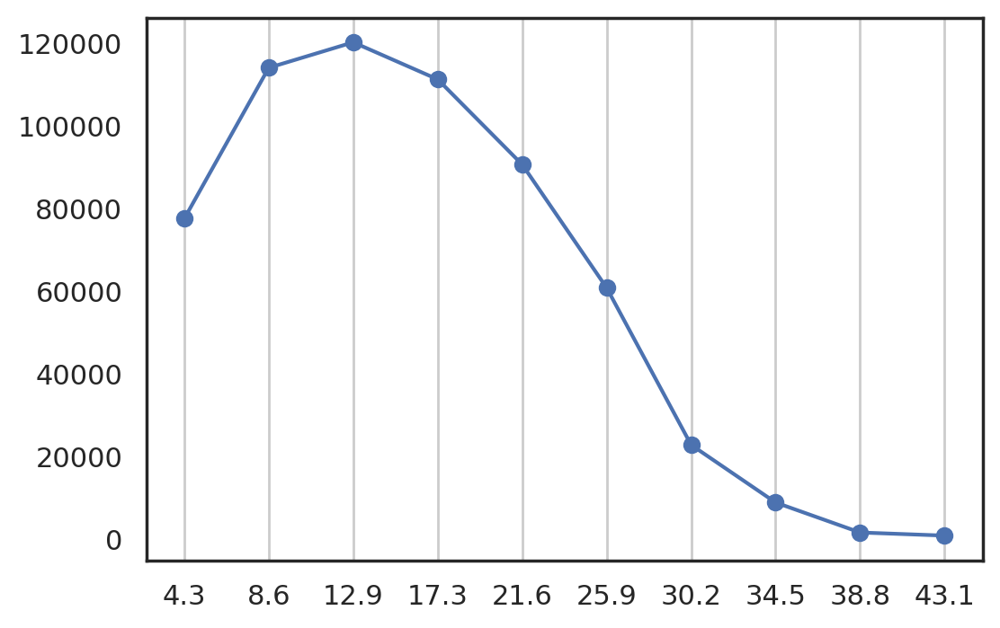

In [ ]:
plt.plot(semivariogram.bins,
         semivariogram.experimental,
         marker='o')

plt.xticks(
    semivariogram.bins, 
    (semivariogram.bins / 5280).round(1));
plt.grid(True,axis='x')

In [ ]:
semivariogram.get_empirical()

(array([ 22771.28001108,  45542.56002217,  68313.84003325,  91085.12004434,
        113856.40005542, 136627.68006651, 159398.96007759, 182170.24008868,
        204941.52009976, 227712.80011085]),
 array([ 77446.85134731, 113952.6906587 , 120123.65847629, 111153.33141652,
         90546.41536232,  60706.41468499,  22705.50259538,   8764.15769231,
          1514.79579832,    760.78723404]))

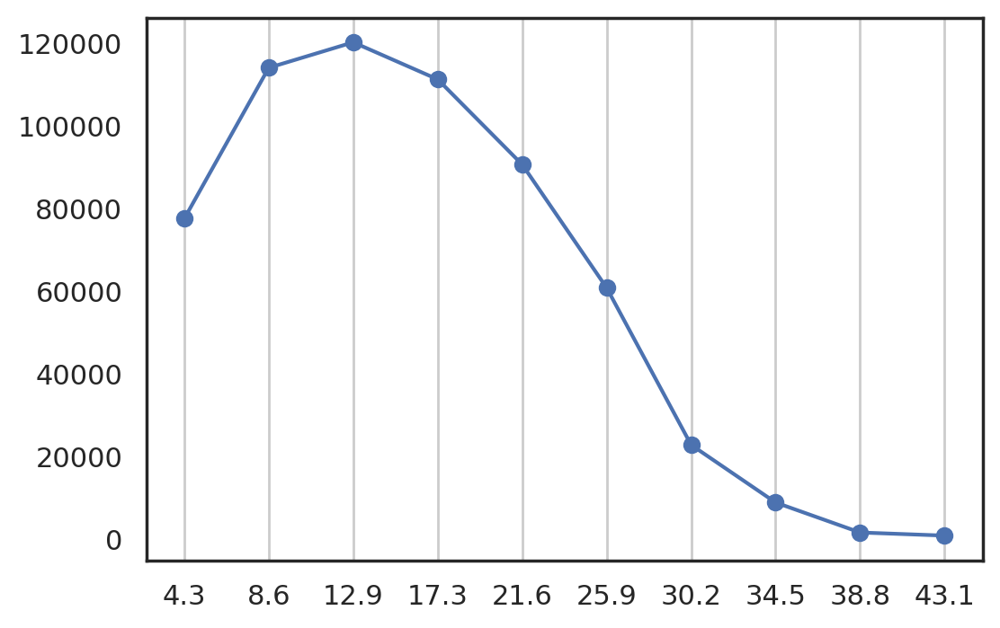

In [ ]:
emperical_variogram = semivariogram.get_empirical()

plt.plot(emperical_variogram[0],
         emperical_variogram[1],
         marker='o')

plt.xticks(
    semivariogram.bins, 
    (semivariogram.bins / 5280).round(1));
plt.grid(True,axis='x')

In [ ]:
semivariogram.describe(short=True)

{'dist_func': 'euclidean',
 'effective_range': 18190.13543404059,
 'estimator': 'matheron',
 'model': 'spherical',
 'normalized_effective_range': 4142126674.0809402,
 'normalized_nugget': 0,
 'normalized_sill': 7299609641.925657,
 'nugget': 0,
 'sill': 60767.46025319119}

In [ ]:
range, sill, nugget = semivariogram.parameters

print(f'Range: {range:.2f} ft = {range / 5280:.1f} miles')

Range: 18190.14 ft = 3.4 miles


In [ ]:
range_all_bins = semivariogram.parameters[0]

In [ ]:
semivariogram.r

-2.9939683573702744e-16

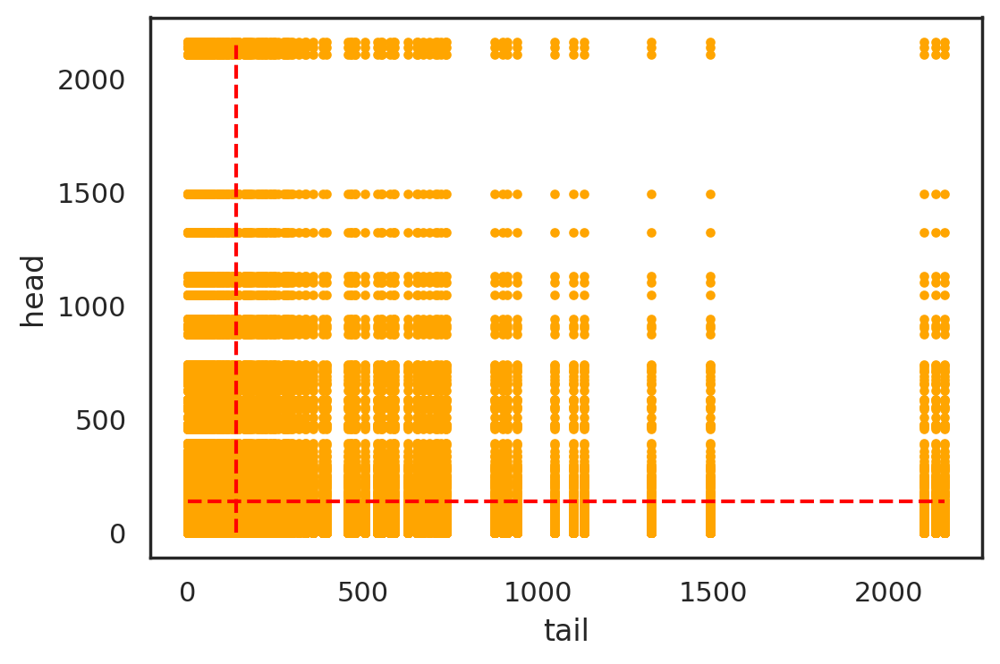

In [ ]:
fig=semivariogram.scattergram()

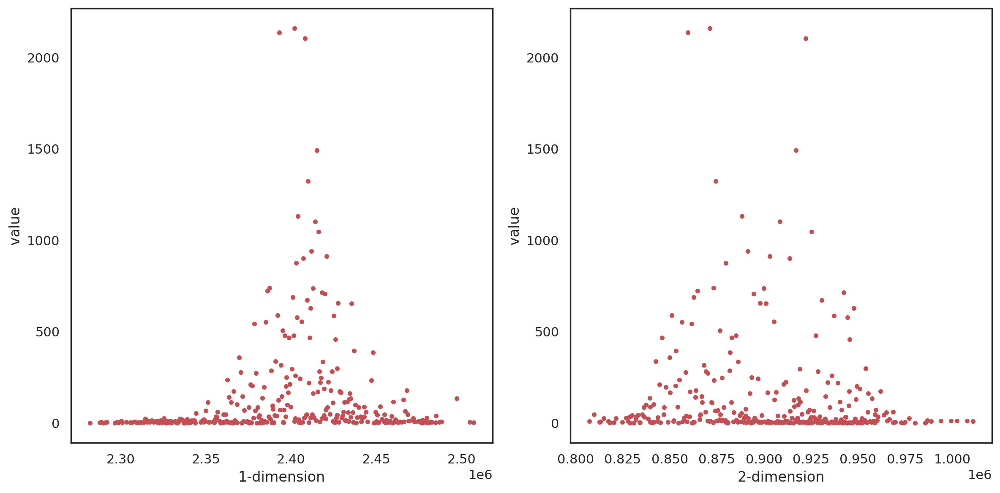

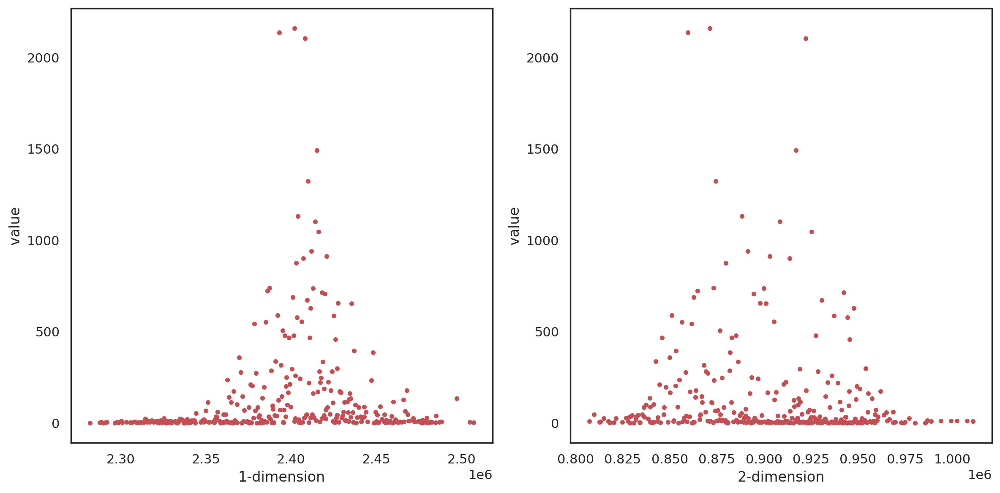

In [ ]:
semivariogram.location_trend()

In [ ]:
semivariogram.mae

41877.12892560913

In [ ]:
semivariogram.model_deviations()

(array([ 77446.85134731, 113952.6906587 , 120123.65847629, 111153.33141652,
         90546.41536232,  60706.41468499,  22705.50259538,   8764.15769231,
          1514.79579832,    760.78723404]),
 array([60767.46025319, 60767.46025319, 60767.46025319, 60767.46025319,
        60767.46025319, 60767.46025319, 60767.46025319, 60767.46025319,
        60767.46025319, 60767.46025319]))

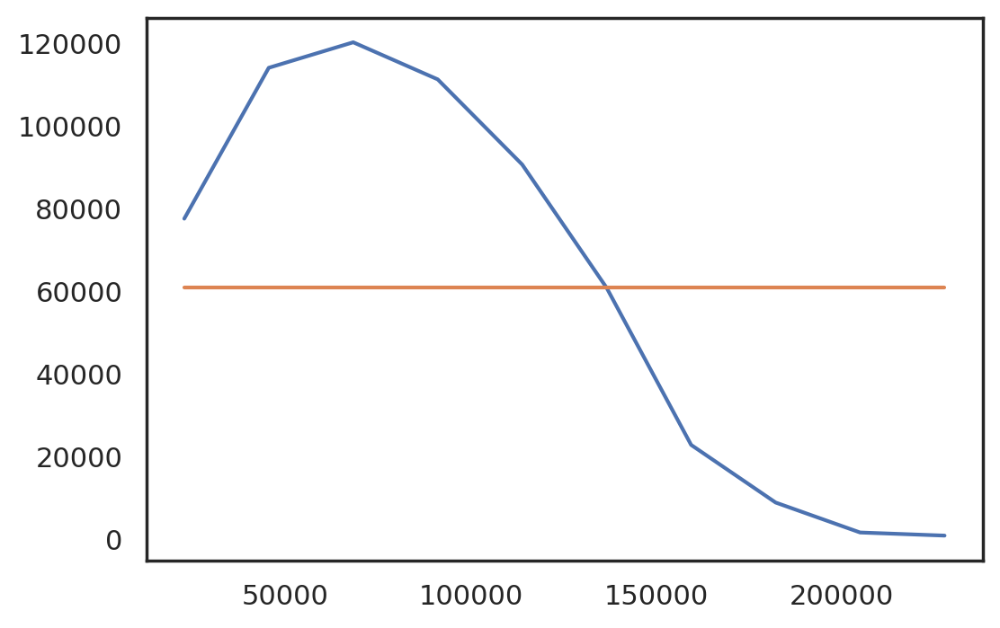

In [ ]:
fig,ax = plt.subplots()

ax.plot(semivariogram.bins,
         semivariogram.model_deviations()[0])

ax.plot(semivariogram.bins,
         semivariogram.model_deviations()[1])

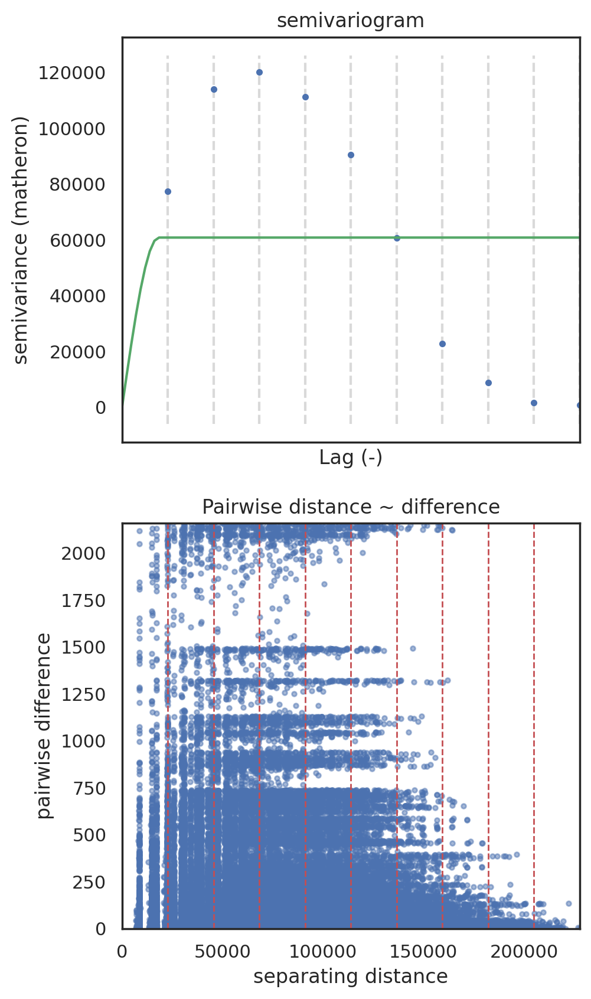

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(5,10), sharex=True)

semivariogram.plot(axes=ax[0])
ax[0].set_title('semivariogram')

semivariogram.distance_difference_plot(ax=ax[1]);

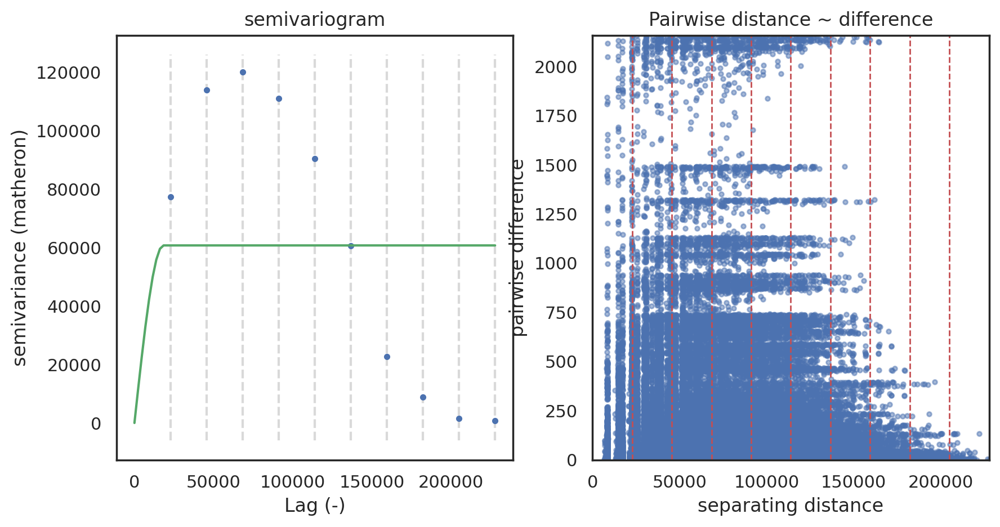

In [ ]:
fig, ax = plt.subplots(1,2, figsize=(10,5))
semivariogram.plot(
    axes=ax[0],
    hist=True)

ax[0].set_title('semivariogram')

semivariogram.distance_difference_plot(ax=ax[1]);

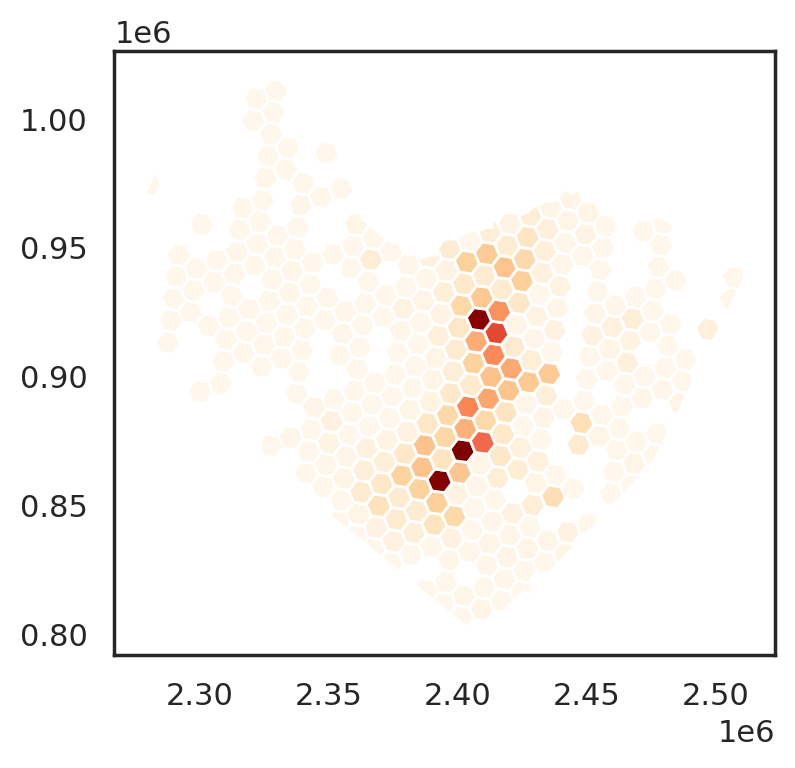

In [ ]:
warrants_by_hexbin.plot(column='count', cmap='OrRd')

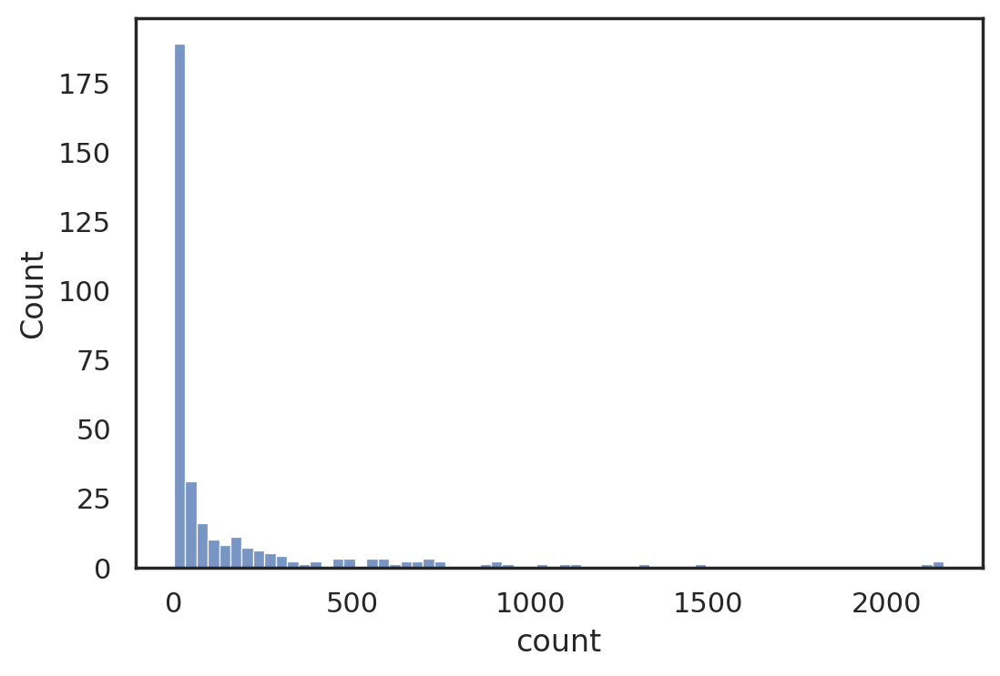

In [ ]:
sns.histplot(data=warrants_by_hexbin['count'])

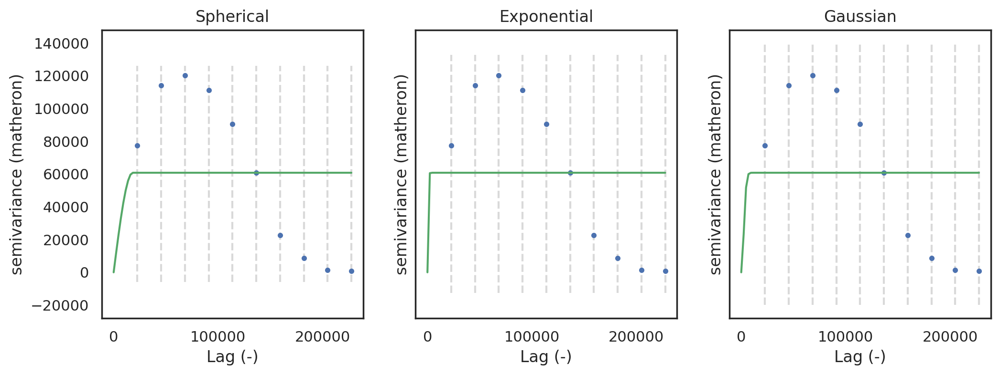

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)

axes[0].set_title('Spherical')
axes[1].set_title('Exponential')
axes[2].set_title('Gaussian')

semivariogram.fit_method = 'trf'
semivariogram.plot(axes=axes[0], hist=False)

semivariogram.model = 'exponential'
semivariogram.plot(axes=axes[1], hist=False)

semivariogram.model = 'gaussian'
semivariogram.plot(axes=axes[2], hist=False);

In [ ]:
semivariogram.fit_method = 'trf'

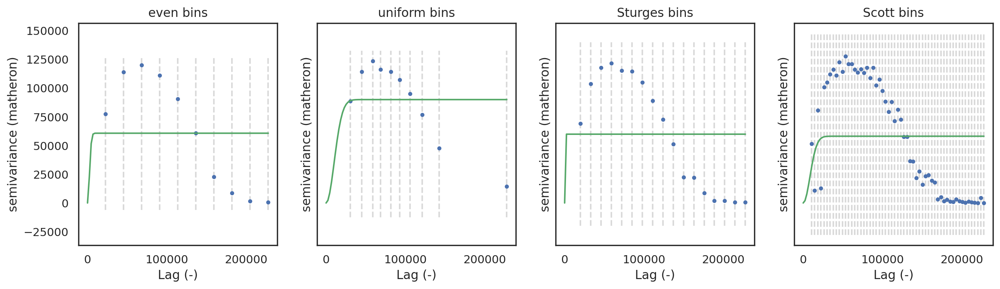

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(16, 4), sharey=True, sharex=True)

axes[0].set_title('even bins')
axes[1].set_title('uniform bins')
axes[2].set_title('Sturges bins')
axes[3].set_title('Scott bins')

semivariogram.bin_func = 'even'
semivariogram.plot(axes=axes[0], hist=False)

semivariogram.bin_func = 'uniform'
semivariogram.plot(axes=axes[1], hist=False)

semivariogram.bin_func = 'sturges'
semivariogram.plot(axes=axes[2], hist=False)

semivariogram.bin_func = 'scott'
semivariogram.plot(axes=axes[3], hist=False);

## join income to counts, compare and analyze

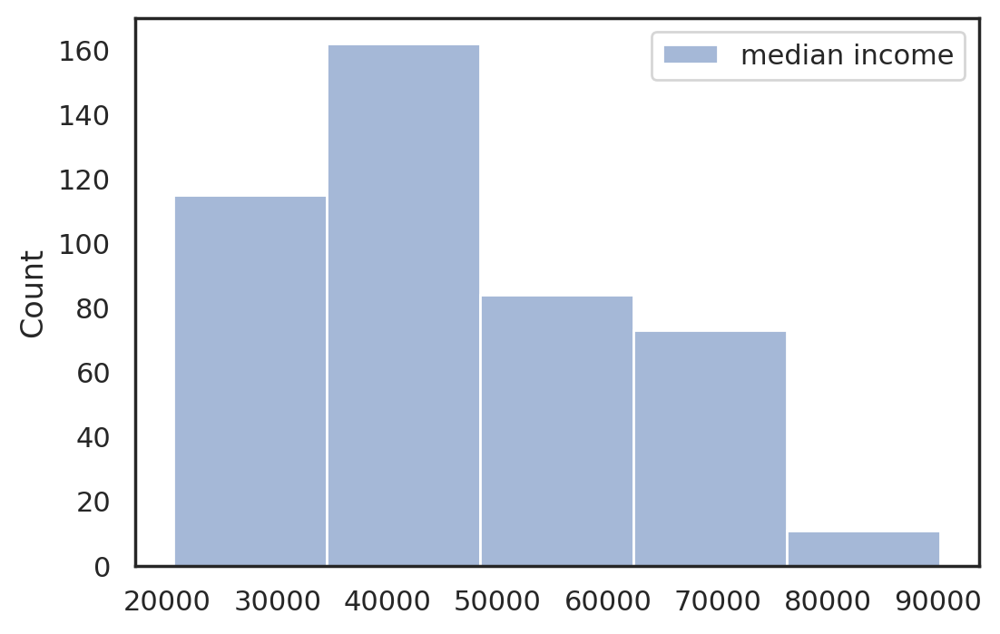

In [ ]:
sns.histplot(data=travis_hex_with_income, bins=5)

In [ ]:
warrants_hexbin_income = gpd.sjoin(warrants, travis_hex_with_income).rename(columns={'index_right':'hex_id'})

In [ ]:
warrants_by_hexbin_income = warrants_hexbin_income.groupby('hex_id').agg({'ID':'count', 'median income':'min'}).rename(columns={'ID':'count'})

In [ ]:
sns.relplot(data=warrants_by_hexbin_income,
            x='median income',
            y='count');

In [ ]:
warrants_by_hexbin_income = travis_hex.join(warrants_by_hexbin_income)

(2266796.9598637135, 2523218.190973088, 791913.07215935, 1026262.0186638985)

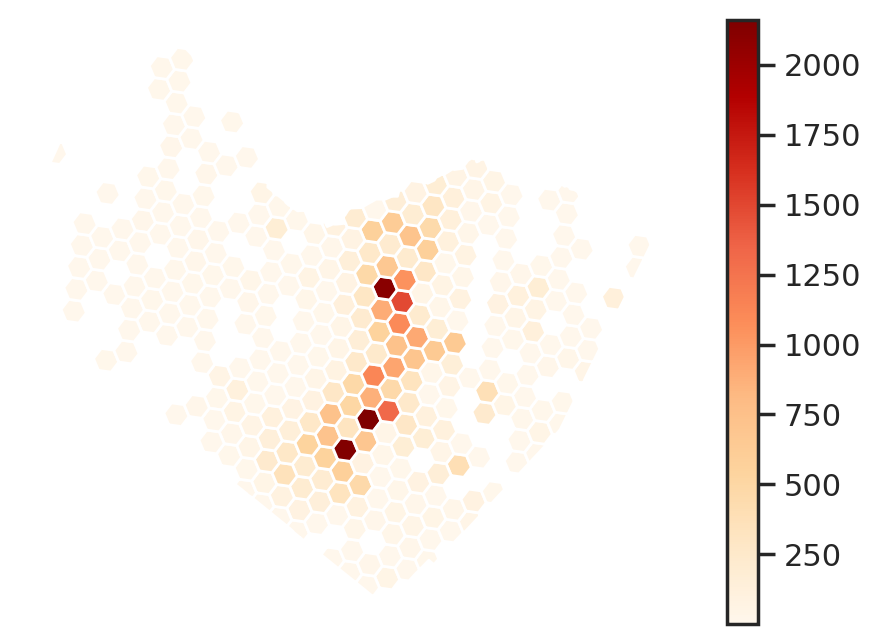

In [ ]:
warrants_by_hexbin_income.plot(
    column='count', 
    cmap='OrRd',
    legend=True)
plt.axis('off')


(2266796.9598637135, 2523218.190973088, 791913.07215935, 1026262.0186638985)

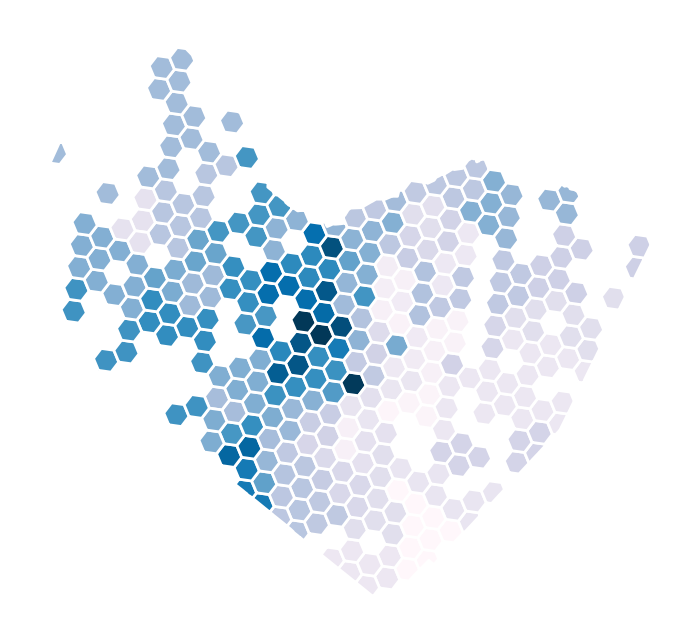

In [ ]:
warrants_by_hexbin_income.plot(column='median income', cmap='PuBu')
plt.axis('off')

In [ ]:
warrants_by_hex_centroid = gpd.GeoDataFrame(data=warrants_by_hexbin_income[['count','median income']],
                                            geometry=warrants_by_hexbin_income.centroid)

In [ ]:
warrants_by_hex_centroid_nonan = warrants_by_hex_centroid.dropna()

In [ ]:
hex_coords = np.stack(warrants_by_hex_centroid_nonan['geometry'].apply(lambda p: np.asarray(p)).values)

/usr/local/lib/python3.7/dist-packages/pandas/core/apply.py:1101: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  convert=self.convert_dtype,


In [ ]:
warrants_by_hex_centroid_nonan = warrants_by_hex_centroid_nonan.reset_index().join(pd.DataFrame(hex_coords, columns=['x','y']))

In [ ]:
income_quantiles = warrants_by_hex_centroid_nonan['median income'].quantile([.33,.67]).to_list()

In [ ]:
income_quantiles

[35371.3, 50483.68000000001]

In [ ]:
bottom_third = warrants_by_hex_centroid_nonan[warrants_by_hex_centroid_nonan['median income'] < income_quantiles[0]]

In [ ]:
middle_third = warrants_by_hex_centroid_nonan[
                               (warrants_by_hex_centroid_nonan['median income'] >= income_quantiles[0])&
                               (warrants_by_hex_centroid_nonan['median income'] < income_quantiles[1])
                               ]

In [ ]:
top_third = warrants_by_hex_centroid_nonan[warrants_by_hex_centroid_nonan['median income'] >= income_quantiles[1]]

In [ ]:
bottom_svg = skg.Variogram(bottom_third[['x','y']].values, bottom_third['count'].values)
middle_svg = skg.Variogram(middle_third[['x','y']].values, middle_third['count'].values)
top_svg = skg.Variogram(top_third[['x','y']].values, top_third['count'].values)

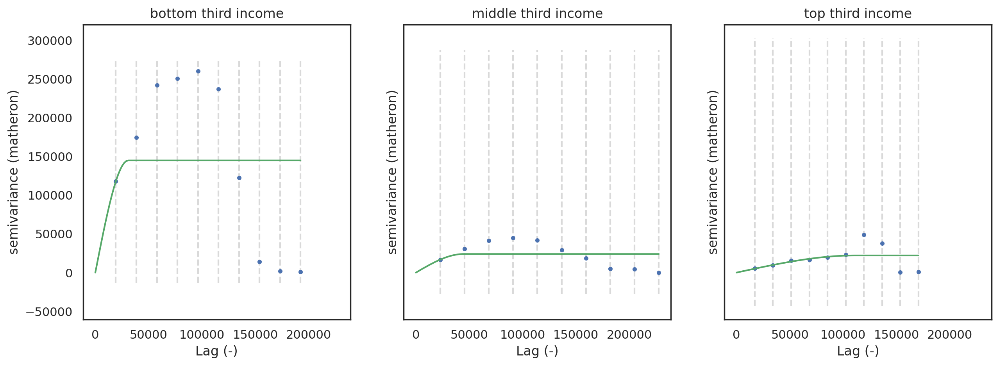

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharex=True, sharey=True)

bottom_svg.plot(axes=ax[0])
middle_svg.plot(axes=ax[1])
top_svg.plot(axes=ax[2])

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income');

In [ ]:
bottom_range_bin = bottom_svg.parameters[0]
middle_range_bin = middle_svg.parameters[0]
top_range_bin = top_svg.parameters[0]

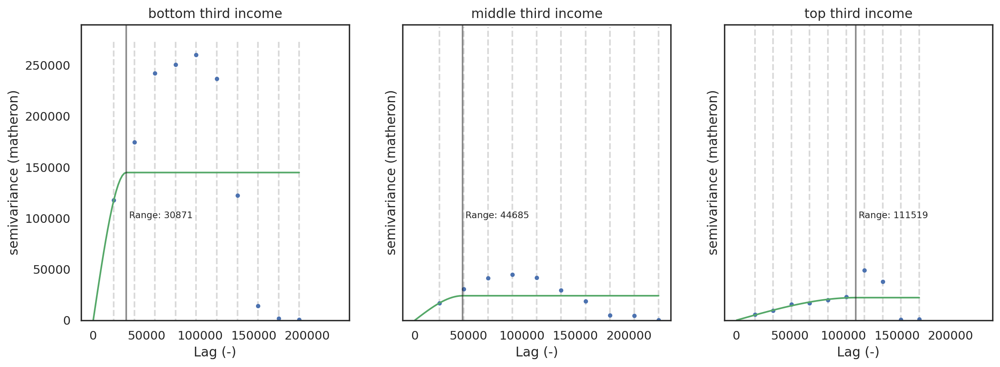

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharex=True, sharey=True)

bottom_svg.plot(axes=ax[0])
middle_svg.plot(axes=ax[1])
top_svg.plot(axes=ax[2])

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income')

ax[0].annotate(f' Range: {bottom_range_bin:.0f}', (bottom_range_bin,100000), size='x-small')
ax[1].annotate(f' Range: {middle_range_bin:.0f}', (middle_range_bin,100000), size='x-small')
ax[2].annotate(f' Range: {top_range_bin:.0f}', (top_range_bin,100000), size='x-small')

ax[0].axvline(bottom_range_bin, c='k',alpha=0.5)
ax[1].axvline(middle_range_bin, c='k',alpha=0.5)
ax[2].axvline(top_range_bin, c='k',alpha=0.5)

ax[0].set_ylim(0,290000);

In [ ]:
ranges = []
sills = []
nuggets = []

for quantile_svg in [bottom_svg, middle_svg, top_svg]:
  range, sill, nugget = quantile_svg.parameters

  ranges.append(range)
  sills.append(sill)
  nuggets.append(nugget)


print(ranges)
print(sills)
print(nugget)


[30870.817149573613, 44685.39269153223, 111519.43878232899]
[144810.04892576826, 23986.80109010749, 22128.716389279325]
0


In [ ]:
svg_stats = pd.DataFrame(data={'range':ranges, 'sill':sills}, index=['bottom', 'middle', 'top'])

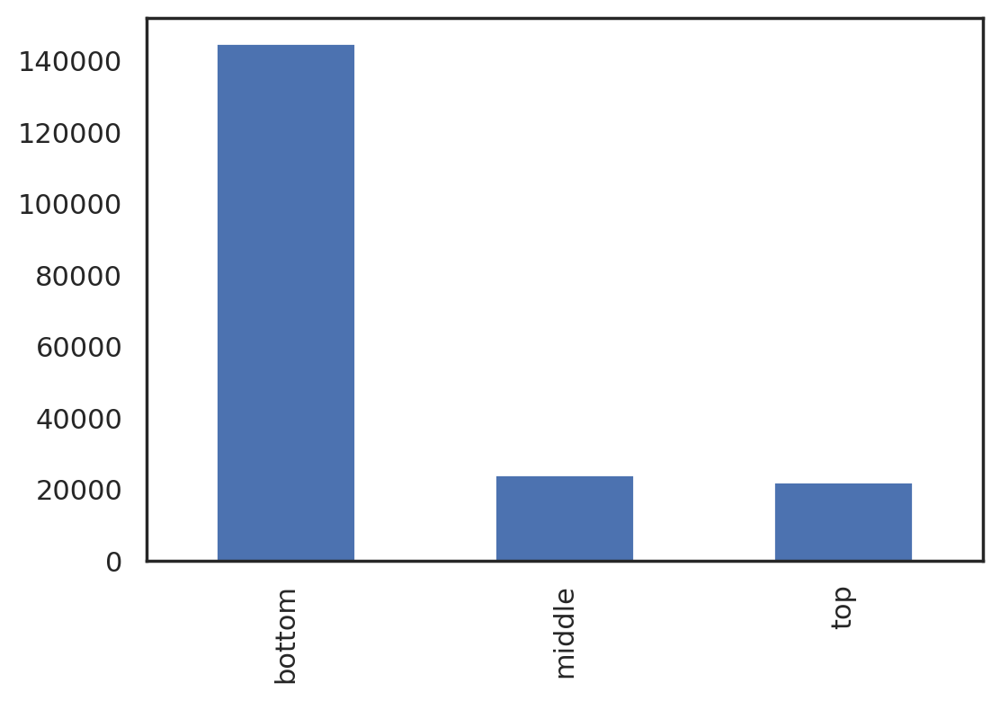

In [ ]:
svg_stats['sill'].plot.bar()

Text(0.5, 0, 'range')

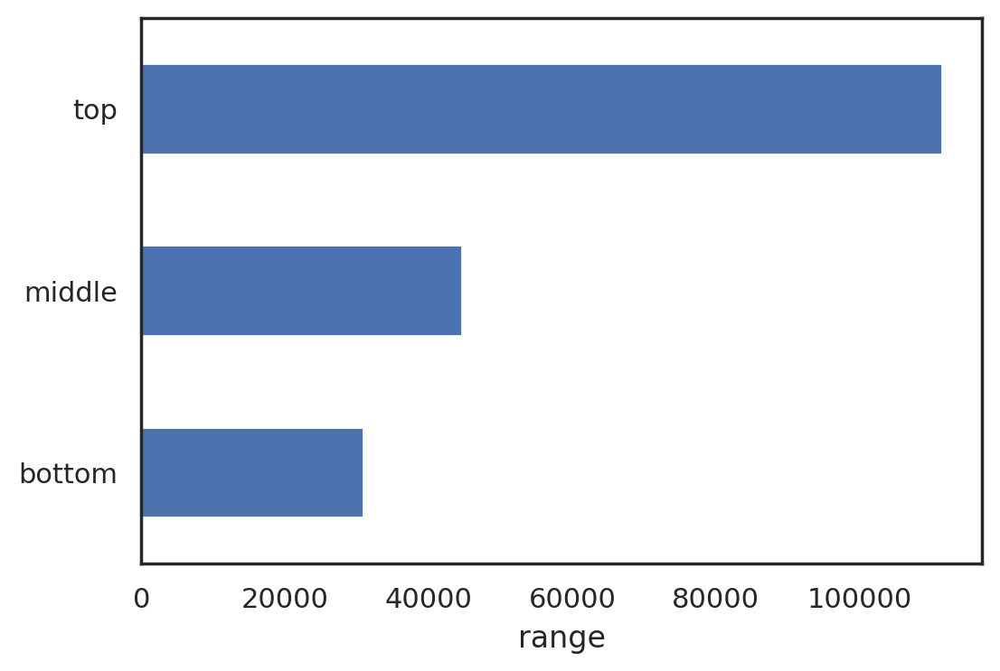

In [ ]:
svg_stats['range'].plot.barh()

plt.xlabel('range')

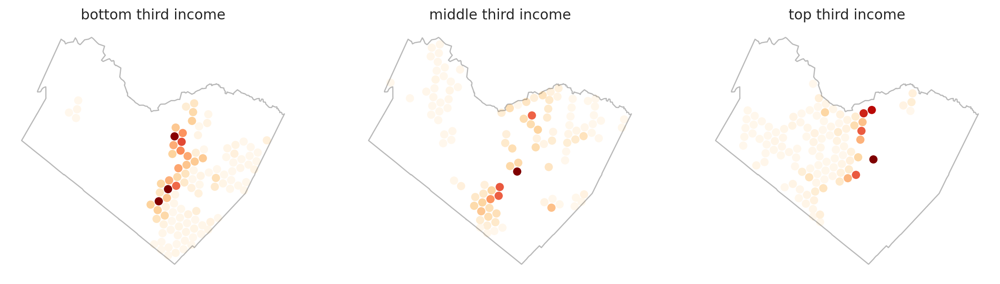

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

bottom_third.plot(column='count', ax=ax[0], cmap='OrRd')
middle_third.plot(column='count', ax=ax[1], cmap='OrRd')
top_third.plot(column='count', ax=ax[2], cmap='OrRd')

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income')


ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')


travis.plot(ax=ax[0], facecolor='none', edgecolor='k', alpha=0.3)
travis.plot(ax=ax[1], facecolor='none', edgecolor='k', alpha=0.3)
travis.plot(ax=ax[2], facecolor='none', edgecolor='k', alpha=0.3);

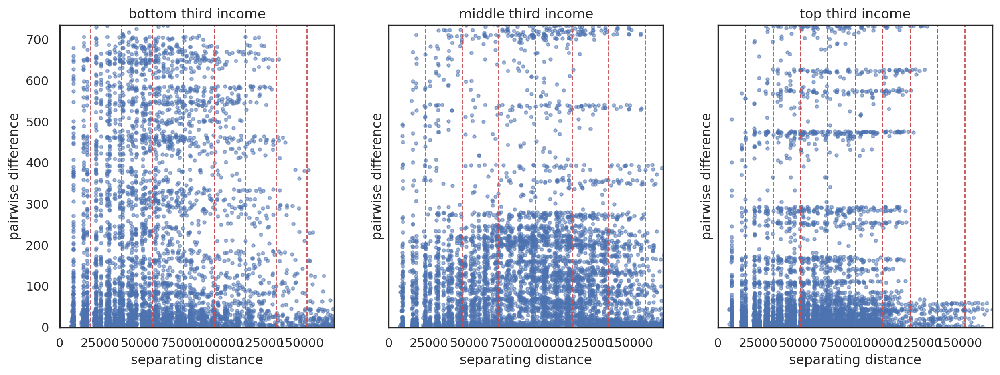

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharex=True, sharey=True)

bottom_svg.distance_difference_plot(ax=ax[0])
middle_svg.distance_difference_plot(ax=ax[1])
top_svg.distance_difference_plot(ax=ax[2])

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income');

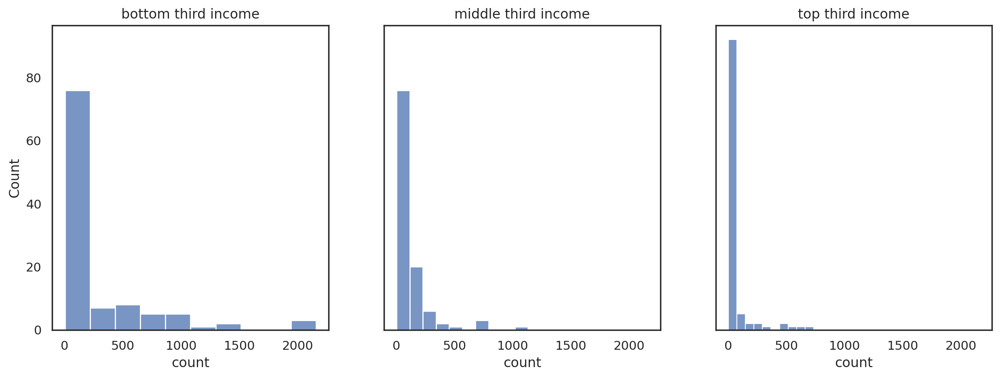

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharey=True, sharex=True)


sns.histplot(data=bottom_third['count'], ax=ax[0], bins=10)
sns.histplot(data=middle_third['count'], ax=ax[1], bins=10)
sns.histplot(data=top_third['count'], ax=ax[2], bins=10)

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income');

## LISA

In [ ]:
warrants_by_hexbin_income['count'] = warrants_by_hexbin_income['count'].fillna(0)

In [ ]:
warrants_by_hexbin_income_nonan = warrants_by_hexbin_income.dropna().reset_index()

In [ ]:
warrants_by_hexbin_income_nonan

,hex_id,geometry,count,median income
0,87489ea8dffffff,"POLYGON ((2406288.922 805893.706, 2404369.113 ...",47.0,29005.0
1,87489ea88ffffff,"POLYGON ((2414152.108 809113.710, 2412232.431 ...",7.0,20526.0
2,87489ea8affffff,"POLYGON ((2420094.566 816922.334, 2423065.453 ...",10.0,20526.0
3,87489ea89ffffff,"POLYGON ((2407341.050 814388.258, 2405421.317 ...",3.0,29005.0
4,87489ea8bffffff,"POLYGON ((2415203.843 817607.478, 2413284.241 ...",25.0,20526.0
...,...,...,...,...
318,87489852bffffff,"POLYGON ((2324607.497 990154.317, 2322687.911 ...",11.0,47456.0
319,874898576ffffff,"POLYGON ((2317793.097 995434.256, 2315873.460 ...",12.0,47456.0
320,87489850dffffff,"POLYGON ((2325662.857 998640.217, 2323743.345 ...",11.0,47456.0
321,874898572ffffff,"POLYGON ((2318848.763 1003920.199, 2316929.201...",13.0,47456.0


In [ ]:
W = weights.Queen.from_dataframe(warrants_by_hexbin_income_nonan, ids='hex_id')

/usr/local/lib/python3.7/dist-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
 There are 4 islands with ids: 874898500ffffff, 874898cc6ffffff, 874898cccffffff, 87489e2a2ffffff.
  warnings.warn(message)


In [ ]:
# remove islands
warrants_by_hexbin_income_nonan = warrants_by_hexbin_income_nonan[~warrants_by_hexbin_income_nonan['hex_id'].isin(['874898500ffffff', '874898cc6ffffff', '874898cccffffff', '87489e2a2ffffff'])]

In [ ]:
W = weights.Queen.from_dataframe(warrants_by_hexbin_income_nonan, ids='hex_id')

/usr/local/lib/python3.7/dist-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


In [ ]:
esda.Moran(warrants_by_hexbin_income_nonan['count'], W).I

0.20563810154765175

In [ ]:
esda.Moran(warrants_by_hexbin_income_nonan['median income'], W).I

0.404864548035406

In [ ]:
esda.Geary(warrants_by_hexbin_income_nonan['count'], W).C

0.7702295211933152

In [ ]:
esda.Geary(warrants_by_hexbin_income_nonan['median income'], W).C

0.5923227924813749

In [ ]:
moran_count = esda.Moran(warrants_by_hexbin_income_nonan['count'], W)

(<Figure size 1400x1400 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fafa76ec610>)

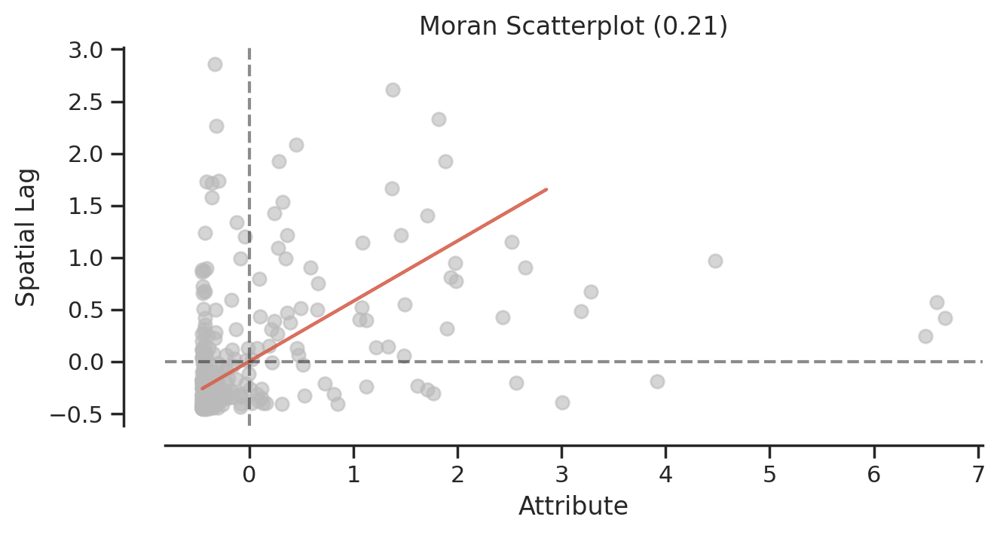

In [ ]:
moran_scatterplot(moran_count)

In [ ]:
from esda.moran import Moran_Local

In [ ]:
moran_local_count = Moran_Local(warrants_by_hexbin_income_nonan['count'], W)

(<Figure size 1400x1400 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fafa7689c10>)

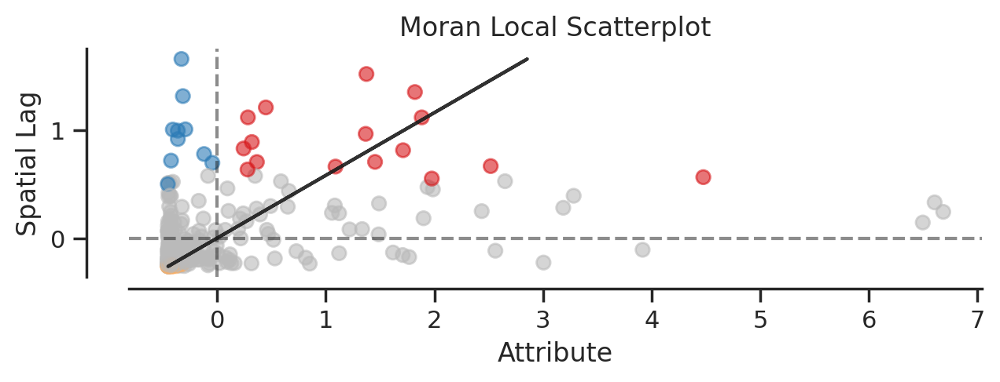

In [ ]:
moran_scatterplot(moran_local_count, p=0.05)

In [ ]:
moran_local_count.p_sim

array([0.075, 0.192, 0.142, 0.156, 0.159, 0.359, 0.168, 0.239, 0.228,
       0.218, 0.209, 0.172, 0.396, 0.303, 0.062, 0.183, 0.395, 0.271,
       0.183, 0.354, 0.084, 0.162, 0.111, 0.281, 0.129, 0.218, 0.43 ,
       0.108, 0.041, 0.387, 0.494, 0.39 , 0.028, 0.012, 0.006, 0.27 ,
       0.282, 0.01 , 0.091, 0.274, 0.001, 0.077, 0.073, 0.002, 0.15 ,
       0.072, 0.414, 0.36 , 0.218, 0.354, 0.329, 0.244, 0.341, 0.475,
       0.456, 0.085, 0.277, 0.123, 0.123, 0.202, 0.164, 0.195, 0.45 ,
       0.349, 0.028, 0.378, 0.147, 0.083, 0.049, 0.124, 0.121, 0.019,
       0.061, 0.003, 0.05 , 0.01 , 0.001, 0.113, 0.07 , 0.091, 0.003,
       0.085, 0.008, 0.082, 0.016, 0.004, 0.038, 0.395, 0.002, 0.152,
       0.004, 0.031, 0.033, 0.003, 0.193, 0.216, 0.219, 0.466, 0.068,
       0.364, 0.434, 0.057, 0.106, 0.368, 0.072, 0.39 , 0.122, 0.351,
       0.375, 0.117, 0.18 , 0.233, 0.11 , 0.441, 0.076, 0.291, 0.245,
       0.446, 0.116, 0.061, 0.121, 0.044, 0.053, 0.065, 0.24 , 0.303,
       0.314, 0.408,

In [ ]:
lisa_label = pd.Series(
    moran_local_count.q,
    index=warrants_by_hexbin_income_nonan.index
    ).map({1:'HH', 2:'LH', 3:'LL', 4:'HL'})

In [ ]:
warrants_by_hexbin_income_nonan['LISA'] = lisa_label

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
warrants_by_hexbin_income_nonan['LISA_p_value'] = moran_local_count.p_sim

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
alpha = 0.05

In [ ]:
significant_clusters = warrants_by_hexbin_income_nonan[moran_local_count.p_sim < alpha]

In [ ]:
lisa_shading = {'HL':'red', 'LH':'blue', 'HH':'pink', 'LL':'lightskyblue'}

In [ ]:
fig,ax = plt.subplots(figsize=(8,8))

for lisa_label, color in lisa_shading.items():
  significant_clusters[significant_clusters['LISA'] == lisa_label].plot(
    ax=ax,
    color=color,
    label=lisa_label)
  ax.legend()
  

travis.plot(
    ax=ax,
    facecolor='none',
    edgecolor='k'
)


plt.axis('off')

In [ ]:
from matplotlib.colors import ListedColormap

In [ ]:
cmap = ListedColormap(list(lisa_shading.values()))

In [ ]:
cmap = ListedColormap(['pink','blue', 'lightskyblue'])

(2248313.4207823486, 2526710.2075302172, 787935.4107495329, 1028619.2165931134)

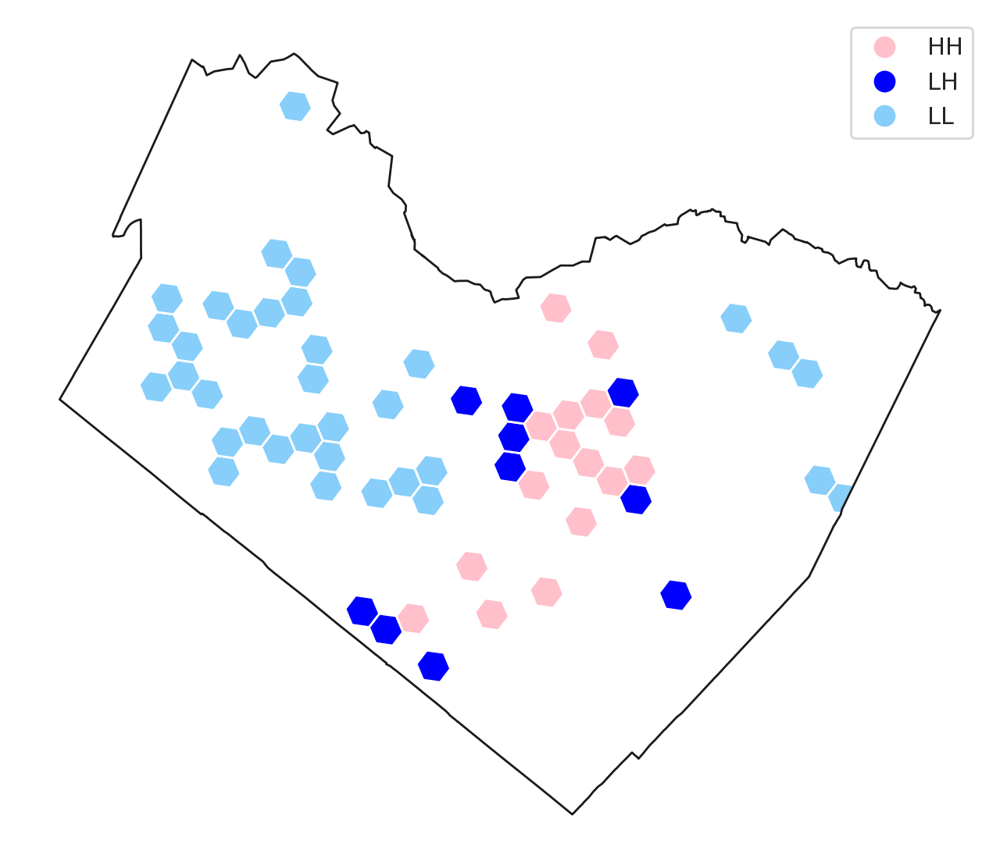

In [ ]:
fig,ax = plt.subplots(figsize=(8,8))


significant_clusters.plot(
    column='LISA',
    legend=True,
    cmap=cmap,
    ax=ax
)

travis.plot(
    ax=ax,
    facecolor='none',
    edgecolor='k'
)

plt.axis('off')


In [ ]:
import contextily as cx

(-98.21314890859551,
 -97.32936709901867,
 29.994311497116584,
 30.658436521794453)

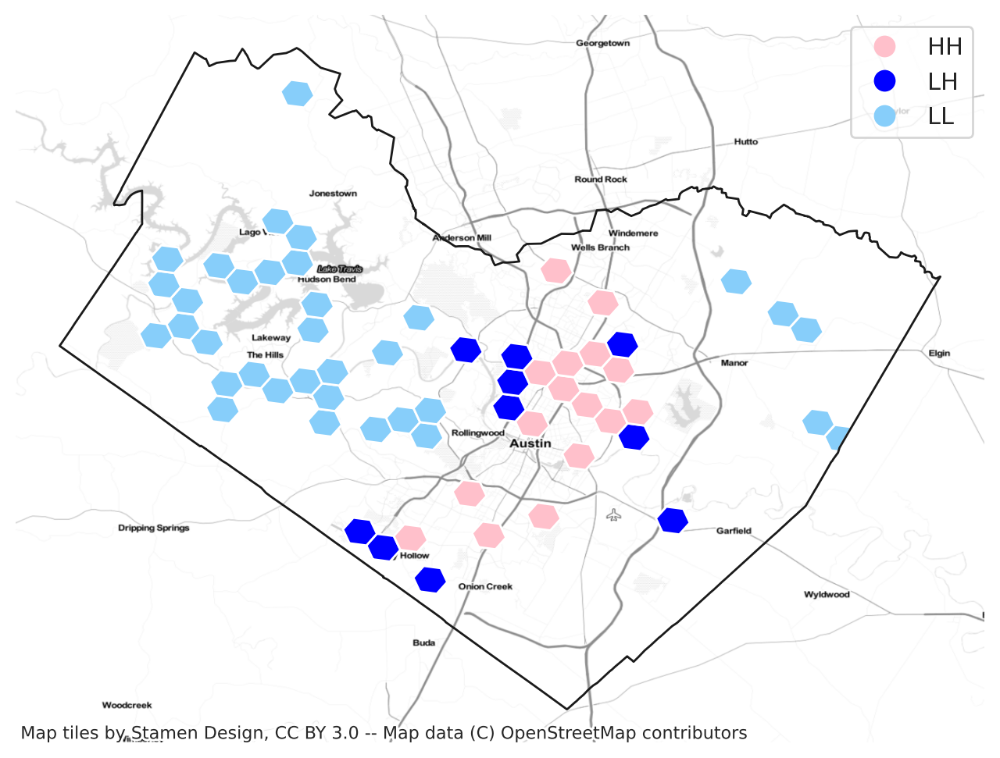

In [ ]:
fig,ax = plt.subplots(figsize=(8,8))


significant_clusters.to_crs('epsg:4326').plot(
    column='LISA',
    legend=True,
    cmap=cmap,
    ax=ax
)

travis.to_crs('epsg:4326').plot(
    ax=ax,
    facecolor='none',
    edgecolor='k'
)

cx.add_basemap(
    ax, 
    crs='epsg:4326',
    source=cx.providers.Stamen.TonerLite)

plt.axis('off')


(2248313.4207823486, 2526710.2075302172, 787935.4107495329, 1028619.2165931134)

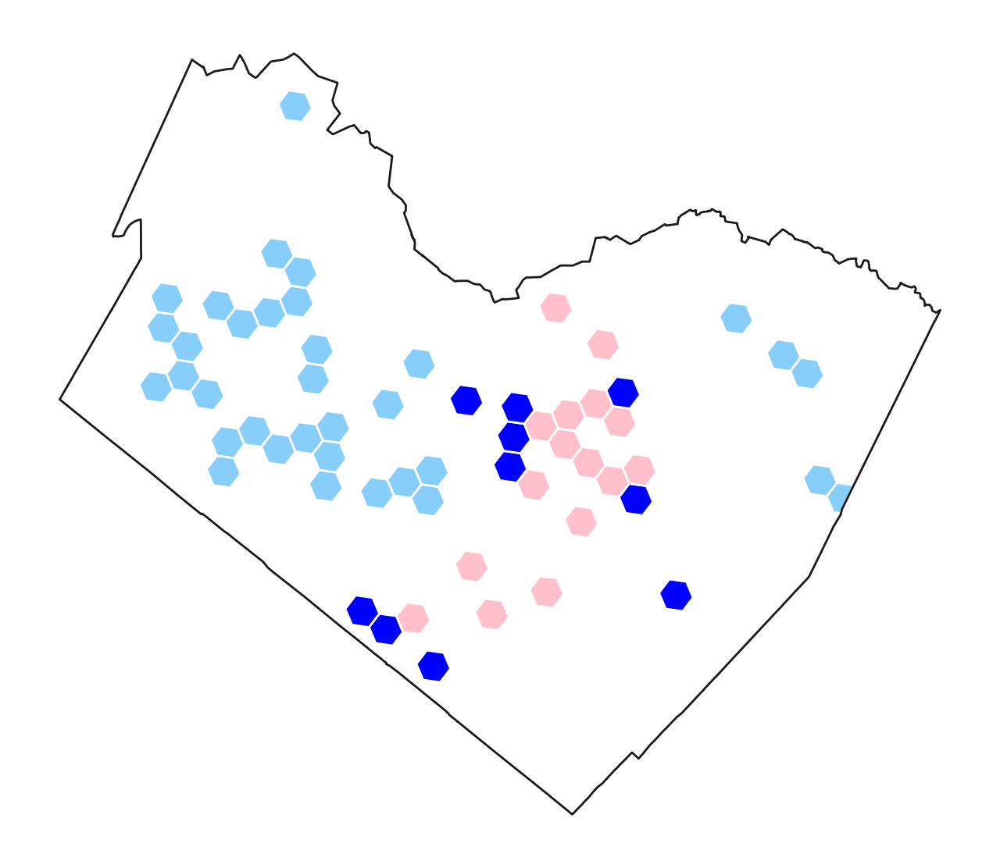

In [ ]:
fig,ax = plt.subplots(figsize=(8,8))


significant_clusters.plot(
    ax=ax,
    color=significant_clusters['LISA'].map(lisa_shading)
)

travis.plot(
    ax=ax,
    facecolor='none',
    edgecolor='k'
)

plt.axis('off')


## LISA with distance weight

In [ ]:
W_dist = libpysal.weights.DistanceBand.from_dataframe(
    warrants_by_hexbin_income_nonan,
    threshold=500000,
    binary=False
)

/usr/local/lib/python3.7/dist-packages/scipy/sparse/data.py:119: RuntimeWarning: divide by zero encountered in reciprocal
  return self._with_data(data ** n)


In [ ]:
W_dist.transform='r'

In [ ]:
esda.Moran(warrants_by_hexbin_income_nonan['count'], W_dist).I

0.09629577935854242

In [ ]:
esda.Geary(warrants_by_hexbin_income_nonan['count'], W_dist).C

0.9591689456980351

In [ ]:
moran_local_count_dist = Moran_Local(warrants_by_hexbin_income_nonan['count'], W_dist)

(<Figure size 1400x1400 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fafa8729c50>)

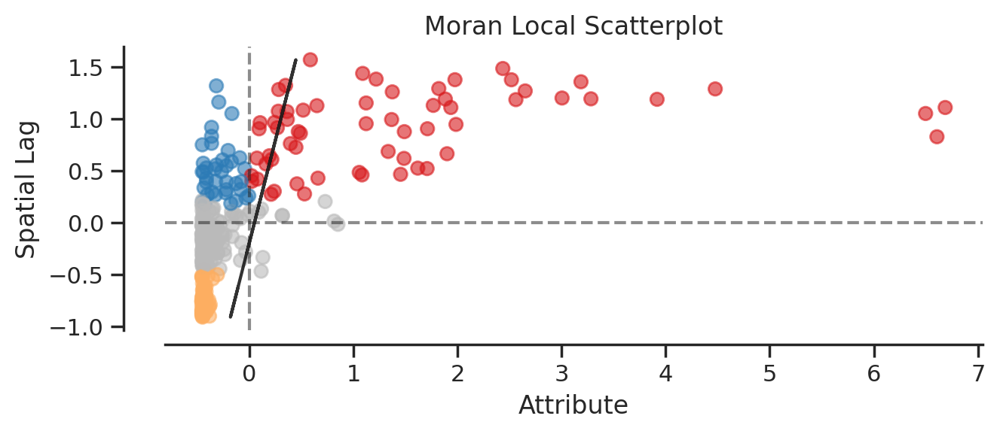

In [ ]:
moran_scatterplot(moran_local_count_dist, p=0.05)

In [ ]:
lisa_label_dist = pd.Series(
    moran_local_count_dist.q,
    index=warrants_by_hexbin_income_nonan.index
    ).map({1:'HH', 2:'LH', 3:'LL', 4:'HL'})

In [ ]:
warrants_by_hexbin_income_nonan['LISA_dist'] = lisa_label_dist

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
warrants_by_hexbin_income_nonan['LISA_dist_p_value'] = moran_local_count_dist.p_sim

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
alpha = 0.05

In [ ]:
significant_clusters = warrants_by_hexbin_income_nonan[moran_local_count_dist.p_sim < alpha]

In [ ]:
lisa_shading = {'HL':'red', 'LH':'blue', 'HH':'pink', 'LL':'lightskyblue'}

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


(2248313.4207823486, 2526710.207530217, 787935.4107495327, 1028619.216593113)

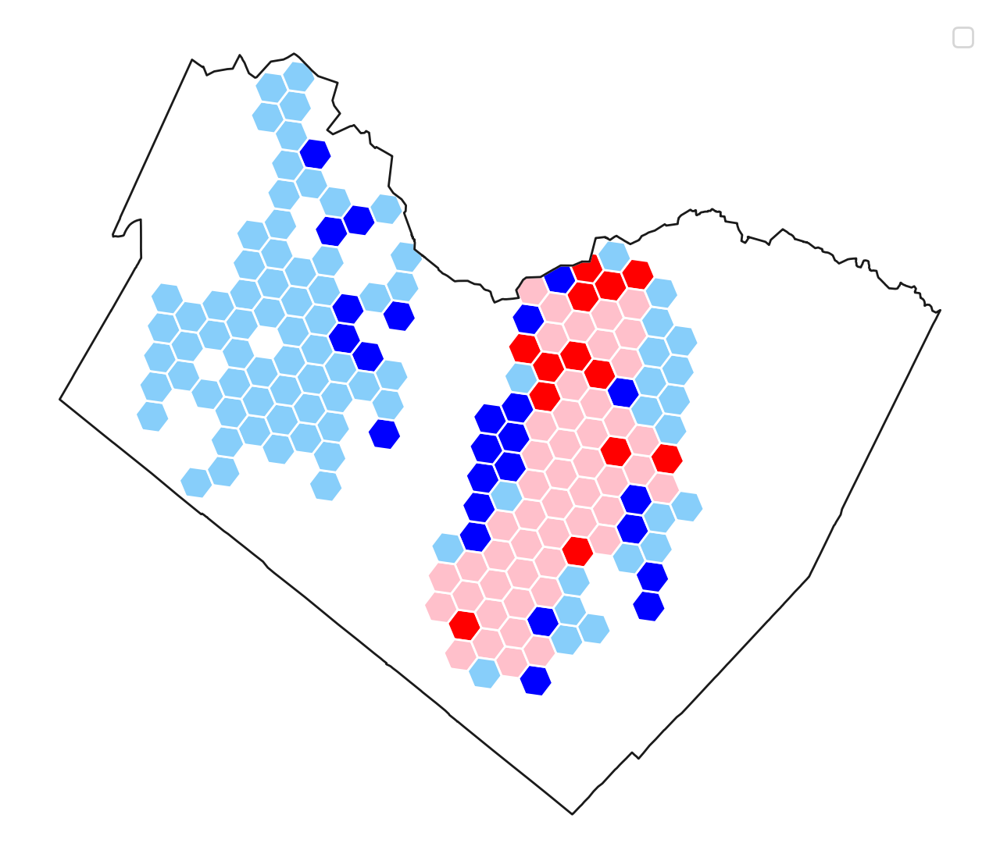

In [ ]:
fig,ax = plt.subplots(figsize=(8,8))

for lisa_label, color in lisa_shading.items():
  significant_clusters[significant_clusters['LISA'] == lisa_label].plot(
    ax=ax,
    color=color,
    label=lisa_label)
  ax.legend()
  

travis.plot(
    ax=ax,
    facecolor='none',
    edgecolor='k'
)


plt.axis('off')

In [ ]:
cmap = ListedColormap(['pink','red','blue','lightskyblue'])

(-98.2131489085955, -97.32936709901865, 29.99431149711658, 30.65843652179445)

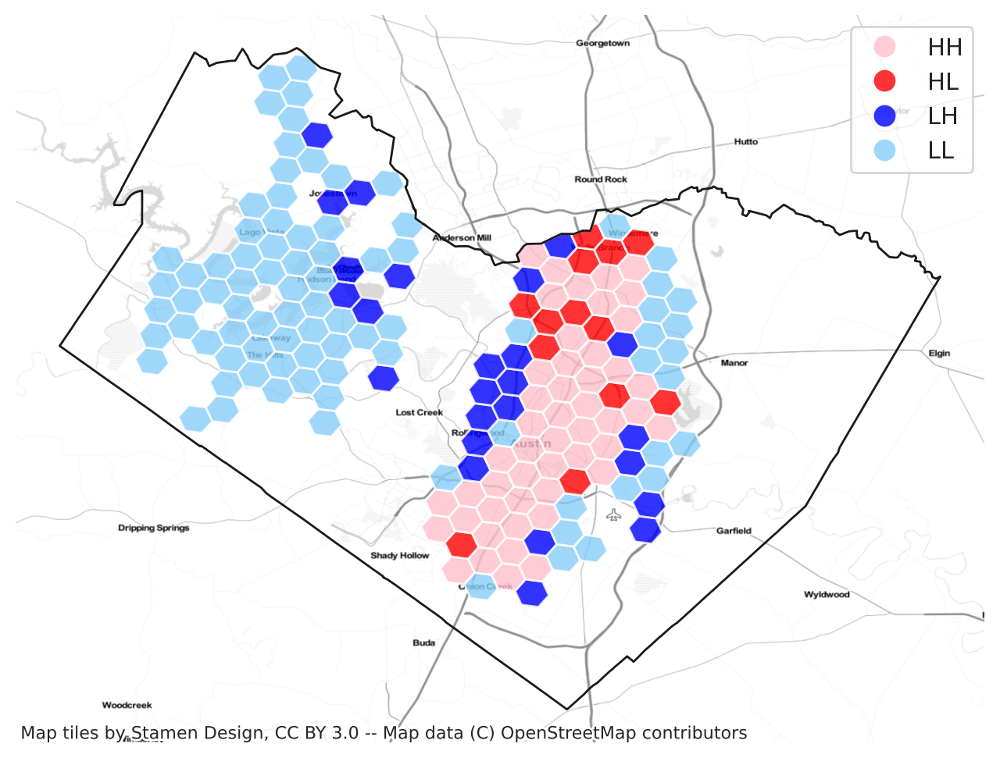

In [ ]:
fig,ax = plt.subplots(figsize=(8,8), dpi=200)


significant_clusters.to_crs('epsg:4326').plot(
    column='LISA',
    legend=True,
    cmap=cmap,
    ax=ax,
    alpha=0.8
)

travis.to_crs('epsg:4326').plot(
    ax=ax,
    facecolor='none',
    edgecolor='k'
)


cx.add_basemap(
    ax, 
    crs='epsg:4326',
    source=cx.providers.Stamen.TonerLite)

plt.axis('off')

## LISA for income quantiles

In [ ]:
bottom_third

,hex_id,count,median income,geometry,x,y
0,87489ea8dffffff,47.0,29005.0,POINT (2409260.629 809798.529),2.409261e+06,809798.528990
1,87489ea88ffffff,7.0,20526.0,POINT (2416896.415 813232.487),2.416896e+06,813232.487399
2,87489ea8affffff,10.0,20526.0,POINT (2424473.665 817502.416),2.424474e+06,817502.415521
3,87489ea89ffffff,3.0,29005.0,POINT (2410312.598 818292.581),2.410313e+06,818292.581392
4,87489ea8bffffff,25.0,20526.0,POINT (2418174.866 821511.367),2.418175e+06,821511.366520
...,...,...,...,...,...,...
280,87489e208ffffff,14.0,28911.0,POINT (2431837.738 931858.210),2.431838e+06,931858.210146
282,87489e20affffff,85.0,28911.0,POINT (2439693.703 935066.186),2.439694e+06,935066.185585
288,87489e2e4ffffff,32.0,28911.0,POINT (2440743.714 943548.511),2.440744e+06,943548.510920
299,87489e250ffffff,187.0,32668.0,POINT (2419275.577 950892.578),2.419276e+06,950892.578288


In [ ]:
W_bottom_third = weights.Queen.from_dataframe(bottom_third)

In [ ]:
moran_local_bottom_third = Moran_Local(bottom_third['count'], W_bottom_third)

(<Figure size 1400x1400 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fafa76bee50>)

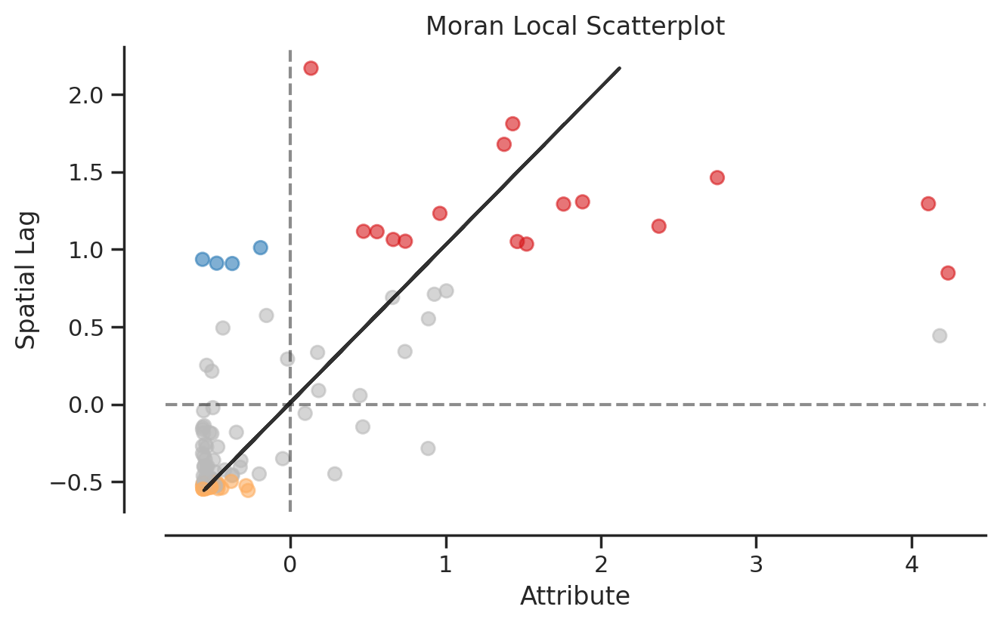

In [ ]:
moran_scatterplot(moran_local_bottom_third, p=0.05)

In [ ]:
lisa_label = pd.Series(
    moran_local_bottom_third.q,
    index=bottom_third.index
    ).map({1:'HH', 2:'LH', 3:'LL', 4:'HL'})

In [ ]:
bottom_third['LISA'] = lisa_label

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


(2248313.4207823486, 2526710.207530217, 787935.4107495327, 1028619.2165931133)

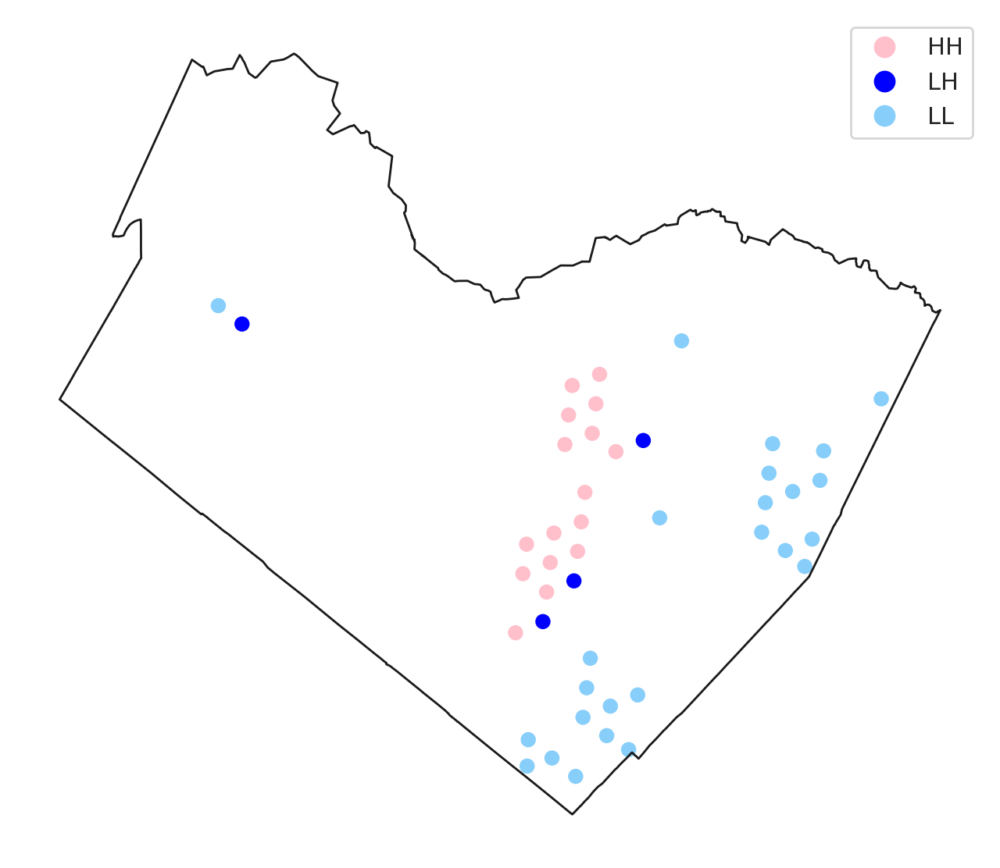

In [ ]:
fig,ax = plt.subplots(figsize=(8,8))


bottom_third[moran_local_bottom_third.p_sim < alpha].plot(
    column='LISA',
    legend=True,
    cmap=cmap,
    ax=ax
)

travis.plot(
    ax=ax,
    facecolor='none',
    edgecolor='k'
)

plt.axis('off')

In [ ]:
W_bottom_third = weights.Queen.from_dataframe(bottom_third)

moran_local_bottom_third = Moran_Local(bottom_third['count'], W_bottom_third)

lisa_label = pd.Series(
    moran_local_bottom_third.q,
    index=bottom_third.index
    ).map({1:'HH', 2:'LH', 3:'LL', 4:'HL'})

bottom_third['LISA'] = lisa_label


/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [ ]:
W_middle_third = weights.Queen.from_dataframe(middle_third)

moran_local_middle_third = Moran_Local(middle_third['count'], W_middle_third)

middle_third['LISA'] = pd.Series(
    moran_local_middle_third.q,
    index=middle_third.index
    ).map({1:'HH', 2:'LH', 3:'LL', 4:'HL'})

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


(2248313.4207823486, 2526710.207530217, 787935.4107495329, 1028619.2165931131)

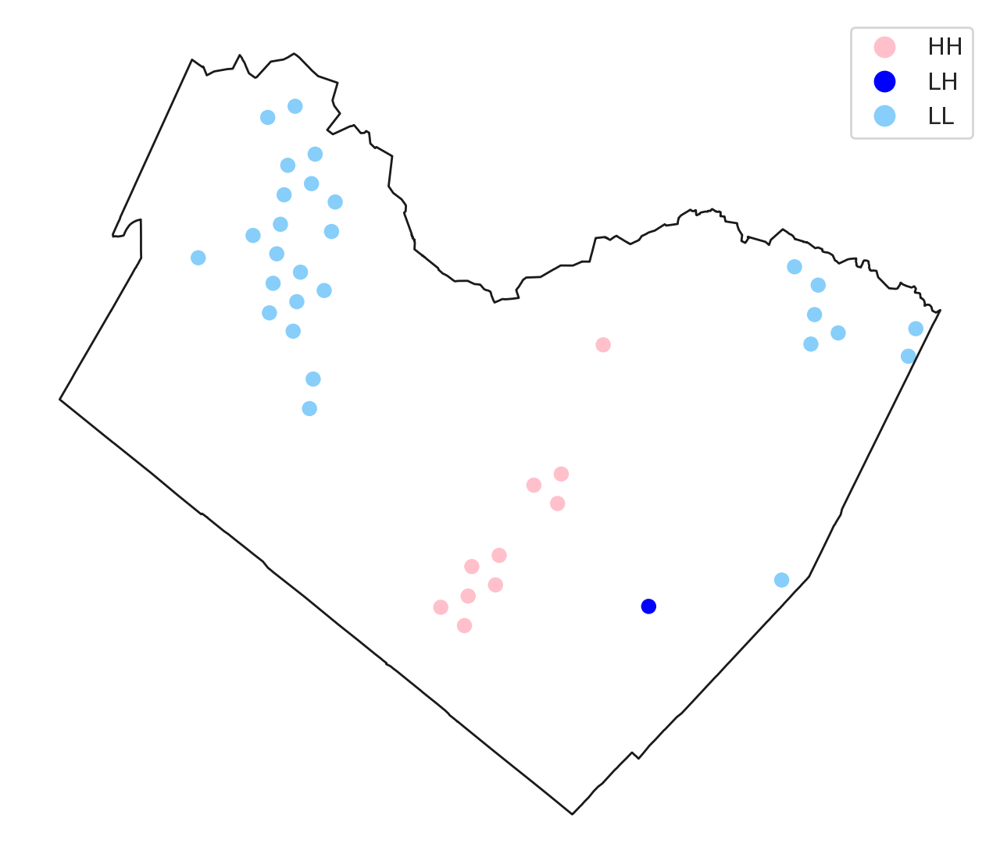

In [ ]:
fig,ax = plt.subplots(figsize=(8,8))

middle_third[moran_local_middle_third.p_sim < alpha].plot(
    column='LISA',
    legend=True,
    cmap=cmap,
    ax=ax
)

travis.plot(
    ax=ax,
    facecolor='none',
    edgecolor='k'
)

plt.axis('off')

In [ ]:
W_top_third = weights.Queen.from_dataframe(top_third)

moran_local_top_third = Moran_Local(top_third['count'], W_top_third)

top_third['LISA'] = pd.Series(
    moran_local_top_third.q,
    index=top_third.index
    ).map({1:'HH', 2:'LH', 3:'LL', 4:'HL'})

/usr/local/lib/python3.7/dist-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


(2248313.4207823486, 2526710.207530217, 787935.4107495327, 1028619.216593113)

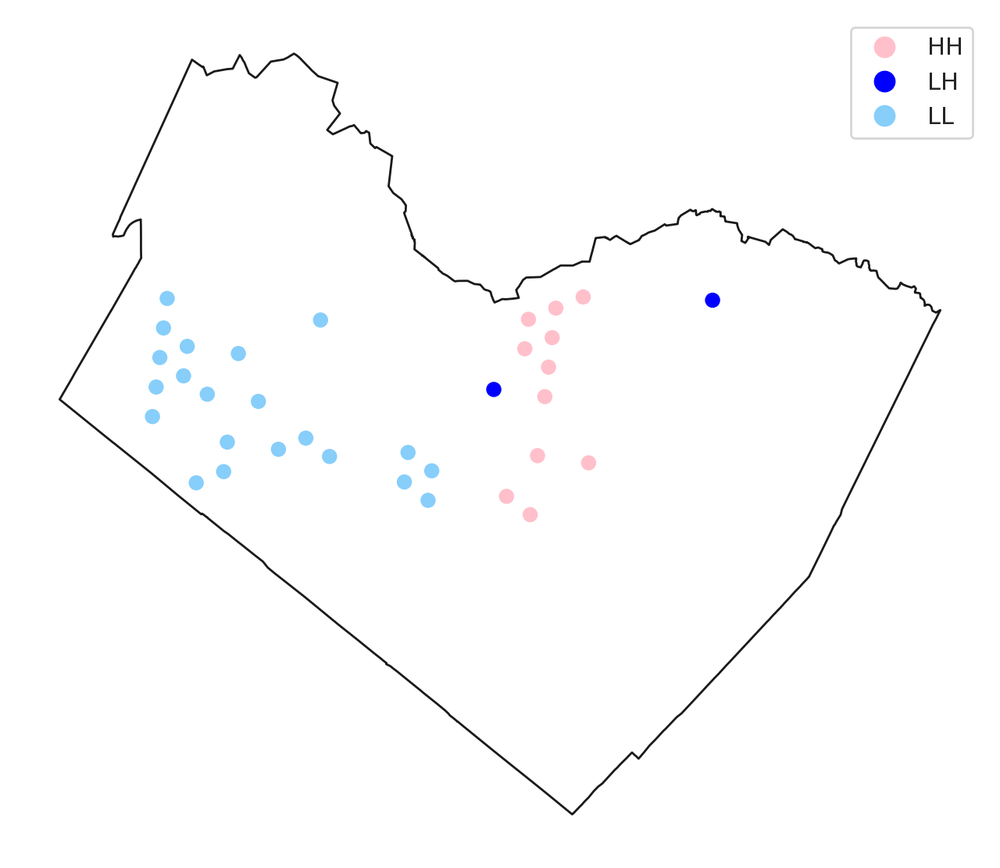

In [ ]:
fig,ax = plt.subplots(figsize=(8,8))

top_third[moran_local_top_third.p_sim < alpha].plot(
    column='LISA',
    legend=True,
    cmap=cmap,
    ax=ax
)

travis.plot(
    ax=ax,
    facecolor='none',
    edgecolor='k'
)

plt.axis('off')

In [ ]:
from splot.esda import lisa_cluster
from splot.esda import plot_local_autocorrelation

(<Figure size 1800x1800 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fafa77c57d0>)

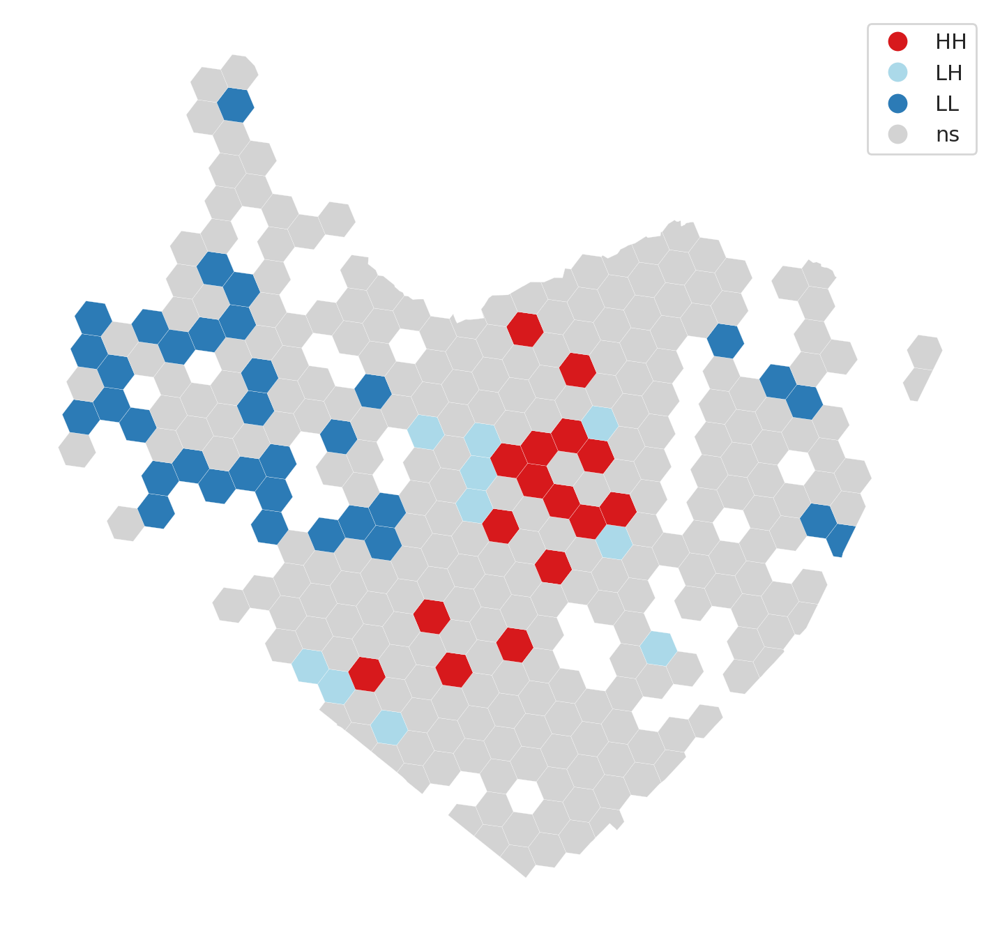

In [ ]:
lisa_cluster(moran_local_count, warrants_by_hexbin_income_nonan, p=0.05, figsize = (9,9))


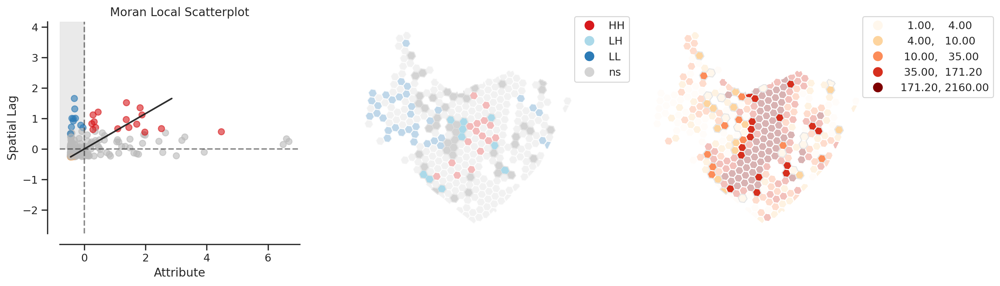

In [ ]:
plot_local_autocorrelation(moran_local_count, warrants_by_hexbin_income_nonan, 'count', quadrant=2, cmap='OrRd');

## semivariogram of prevalence

In [ ]:
travis_tracts = travis_tracts.merge(
    warrants.groupby('GEOID')['ID'].count().rename('warrant count'),
    left_on='GEOID',
    right_index=True)

In [ ]:
travis_tracts = travis_tracts.rename(columns={'warrant count_y':'warrant count'})

In [ ]:
travis_tracts

,GEOID,geometry,total population,median income,[denominator: total population for income on rent],total: paying >50 percent of income on rent,NAME,state,county,tract,warrant count_x,warrant prevalence,warrant count
0,48453001779,"POLYGON ((2303636.979 941892.603, 2303644.237 ...",6546.0,31372.0,500.0,38.0,"Census Tract 17.79, Travis County, Texas",48,453,001779,72,0.010999,62
1,48453001778,"POLYGON ((2321372.904 922804.266, 2321540.062 ...",4339.0,54214.0,437.0,124.0,"Census Tract 17.78, Travis County, Texas",48,453,001778,13,0.002996,9
2,48453001740,"POLYGON ((2357229.835 860673.311, 2357317.136 ...",5017.0,49370.0,1051.0,112.0,"Census Tract 17.40, Travis County, Texas",48,453,001740,52,0.010365,44
3,48453001729,"POLYGON ((2365846.240 860593.929, 2366485.221 ...",5075.0,39299.0,1113.0,362.0,"Census Tract 17.29, Travis County, Texas",48,453,001729,152,0.029951,106
4,48453002423,"POLYGON ((2372970.936 852835.292, 2373386.124 ...",6007.0,39225.0,927.0,369.0,"Census Tract 24.23, Travis County, Texas",48,453,002423,245,0.040786,175
...,...,...,...,...,...,...,...,...,...,...,...,...,...
213,48453000306,"POLYGON ((2406413.036 901225.798, 2406430.842 ...",6029.0,54676.0,1449.0,415.0,"Census Tract 3.06, Travis County, Texas",48,453,000306,296,0.049096,220
214,48453002201,"POLYGON ((2418719.788 908549.212, 2418814.943 ...",2223.0,27679.0,325.0,155.0,"Census Tract 22.01, Travis County, Texas",48,453,002201,368,0.165542,249
215,48453002319,"POLYGON ((2426824.089 862546.723, 2428314.082 ...",2368.0,14063.0,0.0,0.0,"Census Tract 23.19, Travis County, Texas",48,453,002319,24,0.010135,11
216,48453002207,"POLYGON ((2423685.509 872611.690, 2423738.811 ...",9940.0,29262.0,493.0,128.0,"Census Tract 22.07, Travis County, Texas",48,453,002207,1056,0.106237,751


In [ ]:
travis_tracts['warrant count'] = travis_tracts['warrant count'].fillna(0)

In [ ]:
travis_tracts['warrant prevalence'] = travis_tracts['warrant count'] / travis_tracts['total population']

In [ ]:
travis_tracts.plot(column='warrant prevalence')

In [ ]:
warrant_tracts_centroid = gpd.GeoDataFrame(data=travis_tracts,
                                           geometry=travis_tracts.centroid)

In [ ]:
warrant_tracts_centroid.plot()

In [ ]:
warrant_tracts_centroid = warrant_tracts_centroid[[
 'GEOID',
 'total population',
 'median income',
 'warrant count',
 'warrant prevalence',
 'geometry']]

In [ ]:
warrant_tracts_centroid_nonan = warrant_tracts_centroid[
  (warrant_tracts_centroid['warrant prevalence'] != np.inf)&
  (warrant_tracts_centroid['warrant prevalence'].notna())
]

In [ ]:
tract_coords = np.stack(warrant_tracts_centroid_nonan['geometry'].apply(lambda p: np.asarray(p)).values)

/usr/local/lib/python3.7/dist-packages/pandas/core/apply.py:1101: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  convert=self.convert_dtype,


## warrant prevalence semivariogram by tract 

In [ ]:
semivariogram = skg.Variogram(tract_coords, warrant_tracts_centroid_nonan['warrant prevalence'].values)

In [ ]:
semivariogram.plot();

In [ ]:
semivariogram.distance_difference_plot();

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(5,10), sharex=True)

semivariogram.plot(axes=ax[0])
ax[0].set_title('semivariogram')

semivariogram.distance_difference_plot(ax=ax[1]);

(2248313.420782349, 2526710.2075302172, 787935.4107495326, 1028619.216593113)

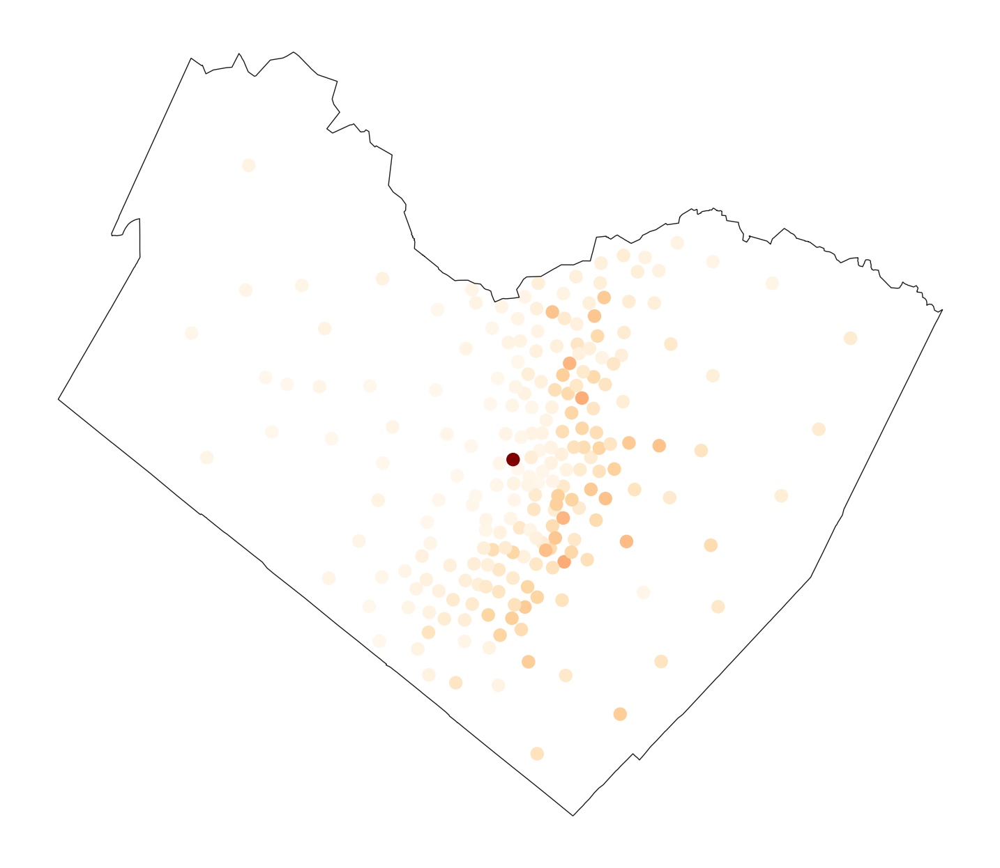

In [ ]:
fig,ax = plt.subplots(figsize=(9,9))

warrant_tracts_centroid_nonan.plot(
    ax=ax,
    column='warrant prevalence',
    cmap='OrRd')

travis.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5)

plt.axis('off')

## check that spot

In [ ]:
warrant_tracts_centroid.sort_values(by='warrant prevalence')

,GEOID,total population,median income,warrant count,warrant prevalence,geometry
22,48453001784,6017.0,64756.0,5,0.000831,POINT (2339219.103 906925.792)
5,48453001918,2530.0,82348.0,3,0.001186,POINT (2375143.520 896353.488)
106,48453001917,5147.0,79858.0,8,0.001554,POINT (2369857.379 889358.930)
88,48453001705,4918.0,81795.0,8,0.001627,POINT (2386749.351 924203.426)
108,48453001719,4159.0,74821.0,7,0.001683,POINT (2384648.828 916871.731)
...,...,...,...,...,...,...
212,48453000902,5581.0,31872.0,816,0.146210,POINT (2405500.472 884203.766)
179,48453001806,7174.0,23469.0,1112,0.155004,POINT (2410856.764 918567.722)
40,48453002314,5392.0,32164.0,855,0.158568,POINT (2405781.586 871659.647)
58,48453001606,16.0,NaN,6,0.375000,POINT (2391158.941 900955.240)


In [ ]:
# drop outlier

## again after removing outlier

In [ ]:
warrant_tracts_centroid

,GEOID,total population,median income,warrant count,warrant prevalence,geometry
0,48453001779,6546.0,31372.0,62,0.009471,POINT (2314692.882 949492.187)
1,48453001778,4339.0,54214.0,9,0.002074,POINT (2326467.320 922472.354)
2,48453001740,5017.0,49370.0,44,0.008770,POINT (2361186.625 858593.505)
3,48453001729,5075.0,39299.0,106,0.020887,POINT (2369902.240 863301.677)
4,48453002423,6007.0,39225.0,175,0.029133,POINT (2377305.366 855004.669)
...,...,...,...,...,...,...
213,48453000306,6029.0,54676.0,220,0.036490,POINT (2410301.434 898061.987)
214,48453002201,2223.0,27679.0,249,0.112011,POINT (2424319.409 905725.737)
215,48453002319,2368.0,14063.0,11,0.004645,POINT (2428462.359 862895.661)
216,48453002207,9940.0,29262.0,751,0.075553,POINT (2447744.080 876410.657)


In [ ]:
warrant_tracts_centroid_nonan = warrant_tracts_centroid[
  (warrant_tracts_centroid['warrant prevalence'] != np.inf)&
  (warrant_tracts_centroid['warrant prevalence'].notna())&
  (warrant_tracts_centroid['GEOID'] != '48453001606')
]

In [ ]:
tract_coords = np.stack(warrant_tracts_centroid_nonan['geometry'].apply(lambda p: np.asarray(p)).values)

/usr/local/lib/python3.7/dist-packages/pandas/core/apply.py:1101: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  convert=self.convert_dtype,


In [ ]:
semivariogram = skg.Variogram(tract_coords, warrant_tracts_centroid_nonan['warrant prevalence'].values)

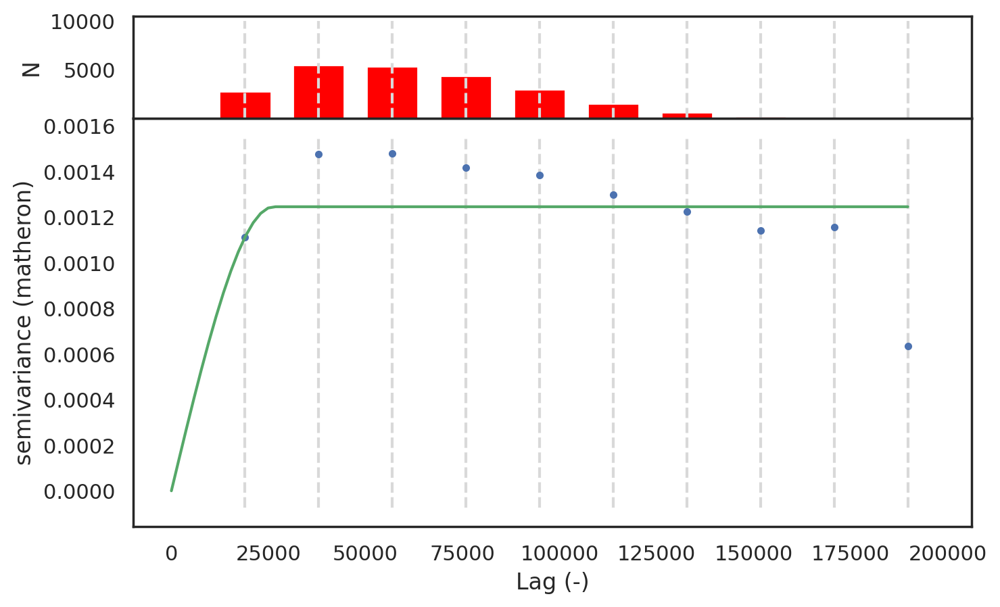

In [ ]:
semivariogram.plot();

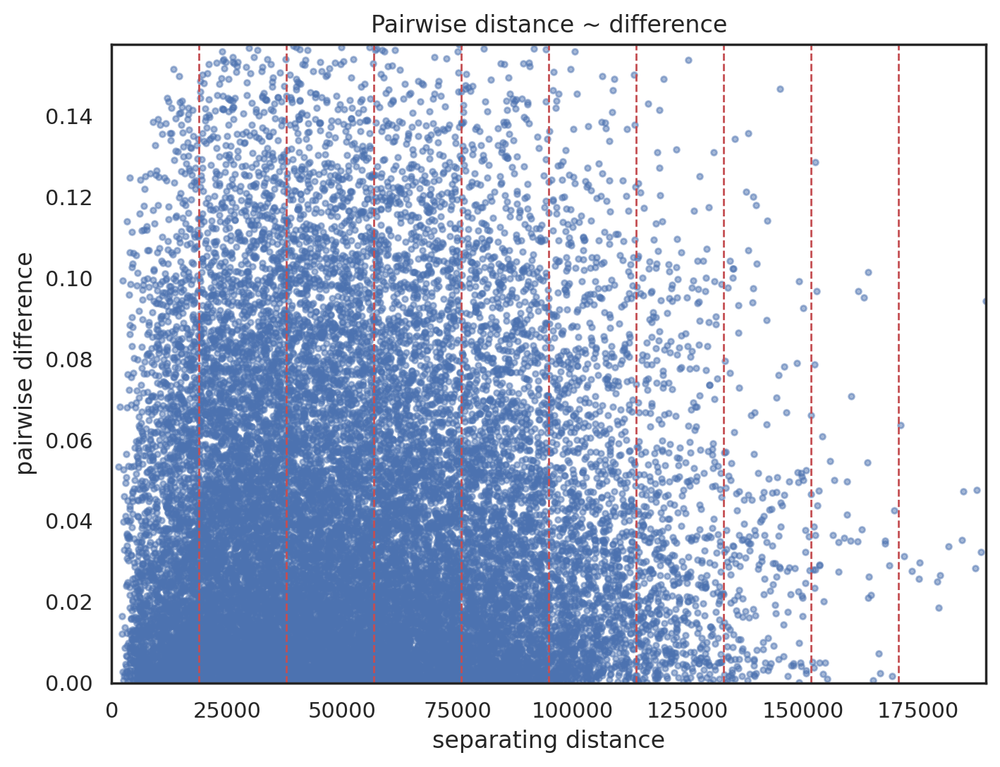

In [ ]:
semivariogram.distance_difference_plot();

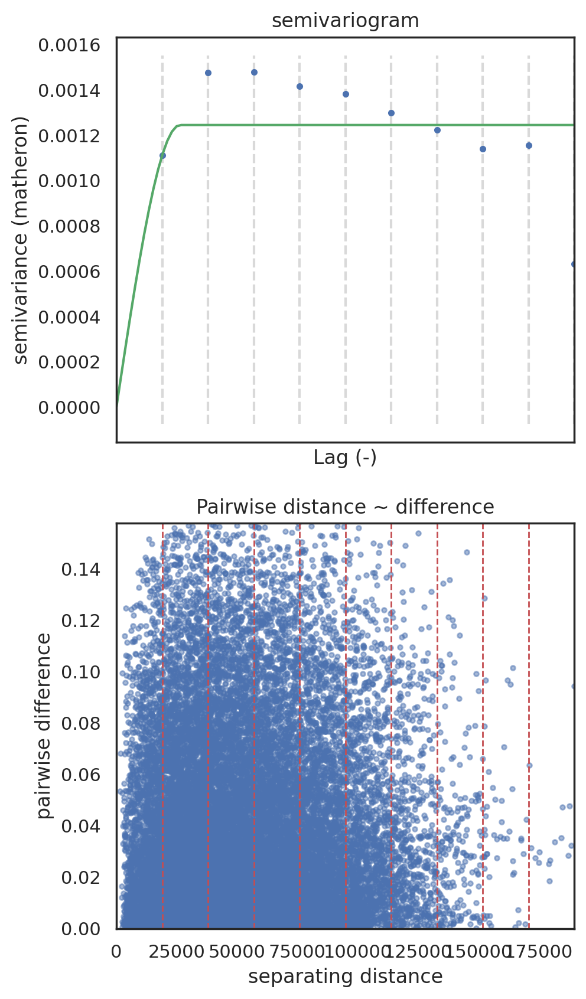

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(5,10), sharex=True)

semivariogram.plot(axes=ax[0])
ax[0].set_title('semivariogram')

semivariogram.distance_difference_plot(ax=ax[1]);

(2248313.420782349, 2526710.2075302172, 787935.4107495326, 1028619.216593113)

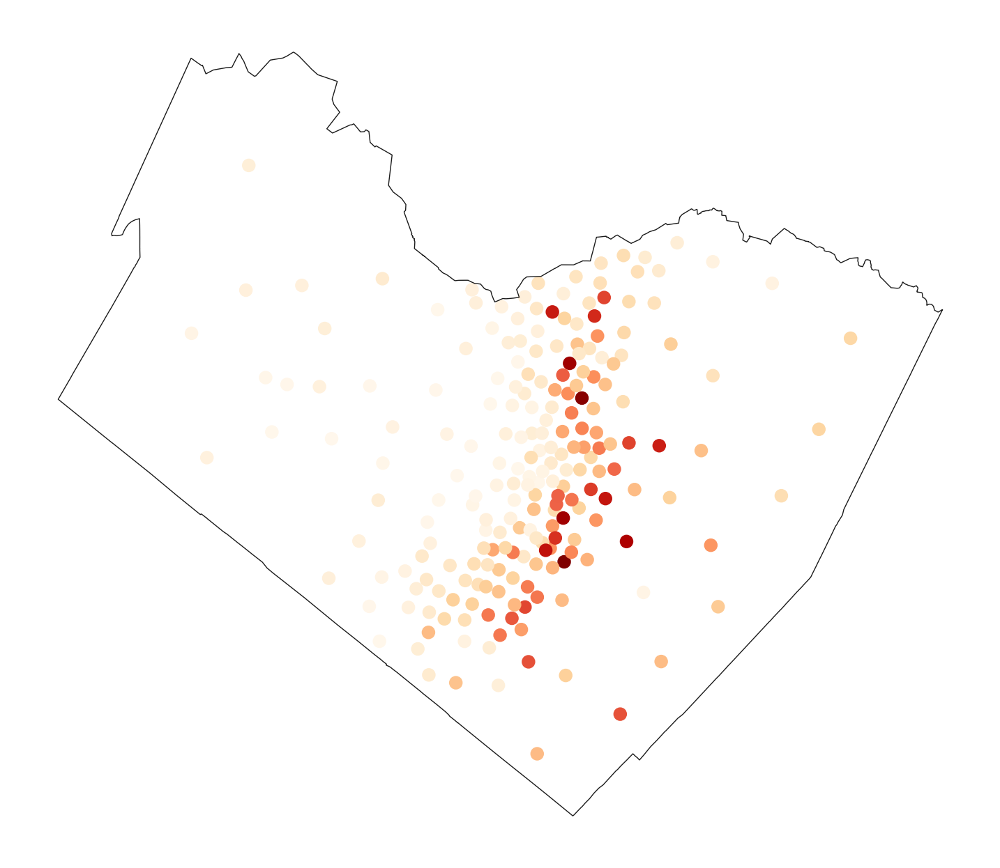

In [ ]:
fig,ax = plt.subplots(figsize=(9,9))

warrant_tracts_centroid_nonan.plot(
    ax=ax,
    column='warrant prevalence',
    cmap='OrRd')

travis.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5)

plt.axis('off')

In [ ]:
warrant_tracts_centroid_nonan = warrant_tracts_centroid_nonan.reset_index().join(pd.DataFrame(hex_coords, columns=['x','y']))

In [ ]:
income_quantiles = warrant_tracts_centroid_nonan['median income'].quantile([.33,.67]).to_list()

In [ ]:
income_quantiles

[34456.05, 48943.5]

In [ ]:
bottom_third = warrant_tracts_centroid_nonan[warrant_tracts_centroid_nonan['median income'] < income_quantiles[0]]

In [ ]:
middle_third = warrant_tracts_centroid_nonan[
                               (warrant_tracts_centroid_nonan['median income'] >= income_quantiles[0])&
                               (warrant_tracts_centroid_nonan['median income'] < income_quantiles[1])
                               ]

In [ ]:
top_third = warrant_tracts_centroid_nonan[warrant_tracts_centroid_nonan['median income'] >= income_quantiles[1]]

In [ ]:
bottom_svg = skg.Variogram(bottom_third[['x','y']].values, bottom_third['warrant prevalence'].values)
middle_svg = skg.Variogram(middle_third[['x','y']].values, middle_third['warrant prevalence'].values)
top_svg = skg.Variogram(top_third[['x','y']].values, top_third['warrant prevalence'].values)

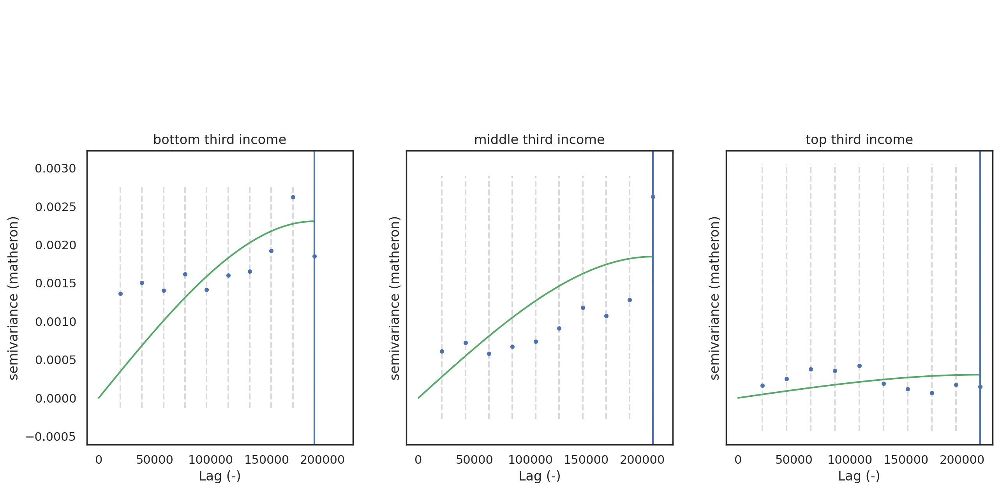

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharex=True, sharey=True)

bottom_svg.plot(axes=ax[0])
middle_svg.plot(axes=ax[1])
top_svg.plot(axes=ax[2])

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income');

bottom_range = bottom_svg.parameters[0]
middle_range = middle_svg.parameters[0]
top_range = top_svg.parameters[0]

ax[0].annotate(f'Range: {bottom_range:.0f}', (bottom_range,.005), ha='right', size='x-small')
ax[1].annotate(f'Range: {middle_range:.0f}', (middle_range,.005), ha='right', size='x-small')
ax[2].annotate(f'Range: {top_range:.0f}', (top_range,.005), ha='right', size='x-small')

ax[0].axvline(bottom_range)
ax[1].axvline(middle_range)
ax[2].axvline(top_range)

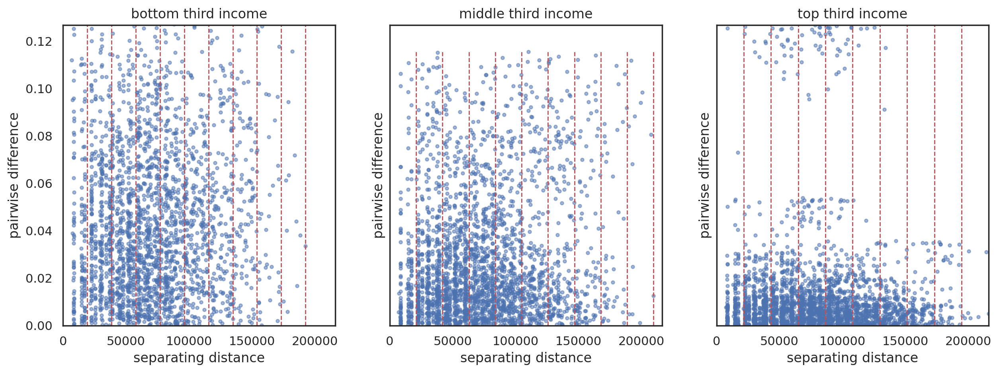

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharex=True, sharey=True)

bottom_svg.distance_difference_plot(ax=ax[0])
middle_svg.distance_difference_plot(ax=ax[1])
top_svg.distance_difference_plot(ax=ax[2])

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income');

In [ ]:
from matplotlib.colors import Normalize

In [ ]:
norm = Normalize(
    vmin = warrant_tracts_centroid_nonan['warrant prevalence'].min(),
    vmax = warrant_tracts_centroid_nonan['warrant prevalence'].max()
)

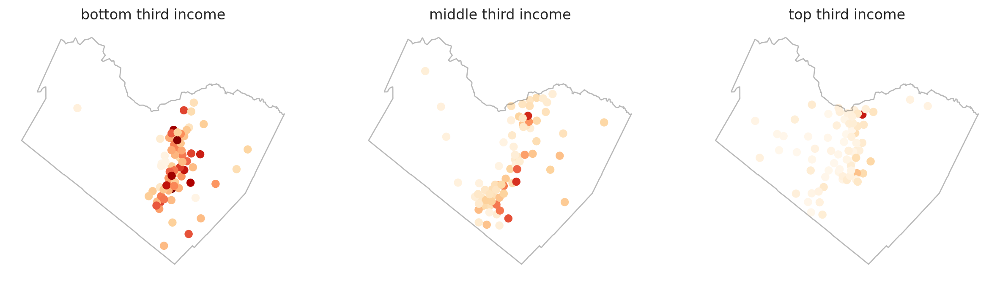

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

bottom_third.plot(column='warrant prevalence', ax=ax[0], cmap='OrRd', norm=norm)
middle_third.plot(column='warrant prevalence', ax=ax[1], cmap='OrRd', norm=norm)
top_third.plot(column='warrant prevalence', ax=ax[2], cmap='OrRd', norm=norm)

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income')


ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')


travis.plot(ax=ax[0], facecolor='none', edgecolor='k', alpha=0.3)
travis.plot(ax=ax[1], facecolor='none', edgecolor='k', alpha=0.3)
travis.plot(ax=ax[2], facecolor='none', edgecolor='k', alpha=0.3);

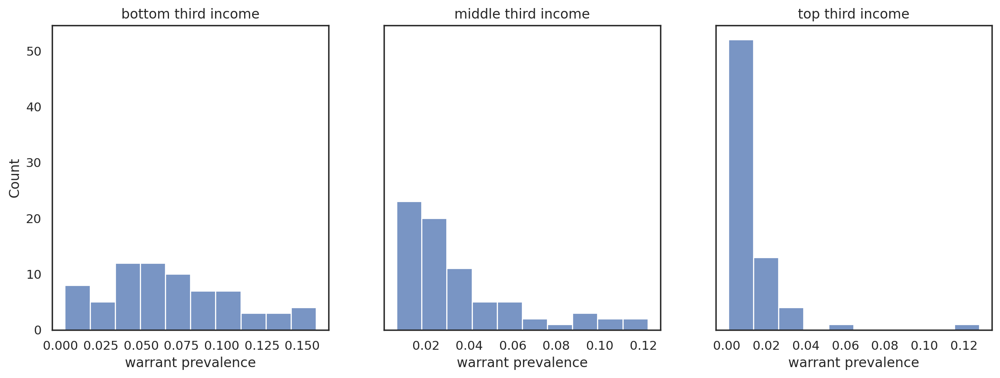

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharey=True)


sns.histplot(data=bottom_third['warrant prevalence'], ax=ax[0], bins=10)
sns.histplot(data=middle_third['warrant prevalence'], ax=ax[1], bins=10)
sns.histplot(data=top_third['warrant prevalence'], ax=ax[2], bins=10)

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income');

to do:

- (rerun semivariograms with log-transform prevalence rates)
- LISA map for each income quantile
- kde heatmap from all id locations, subset by tract income quantile, at distance band
- get stop data and compute warrants per stop




## do it again with log prevalence

In [ ]:
warrant_tracts_centroid_nonan['log warrant prevalence'] = np.log(warrant_tracts_centroid_nonan['warrant prevalence'])

In [ ]:
income_quantiles = warrant_tracts_centroid_nonan['median income'].quantile([.33,.67]).to_list()

In [ ]:
income_quantiles

[34456.05, 48943.5]

In [ ]:
bottom_third = warrant_tracts_centroid_nonan[warrant_tracts_centroid_nonan['median income'] < income_quantiles[0]]

In [ ]:
middle_third = warrant_tracts_centroid_nonan[
                               (warrant_tracts_centroid_nonan['median income'] >= income_quantiles[0])&
                               (warrant_tracts_centroid_nonan['median income'] < income_quantiles[1])
                               ]

In [ ]:
top_third = warrant_tracts_centroid_nonan[warrant_tracts_centroid_nonan['median income'] >= income_quantiles[1]]

In [ ]:
bottom_svg = skg.Variogram(bottom_third[['x','y']].values, bottom_third['log warrant prevalence'].values)
middle_svg = skg.Variogram(middle_third[['x','y']].values, middle_third['log warrant prevalence'].values)
top_svg = skg.Variogram(top_third[['x','y']].values, top_third['log warrant prevalence'].values)

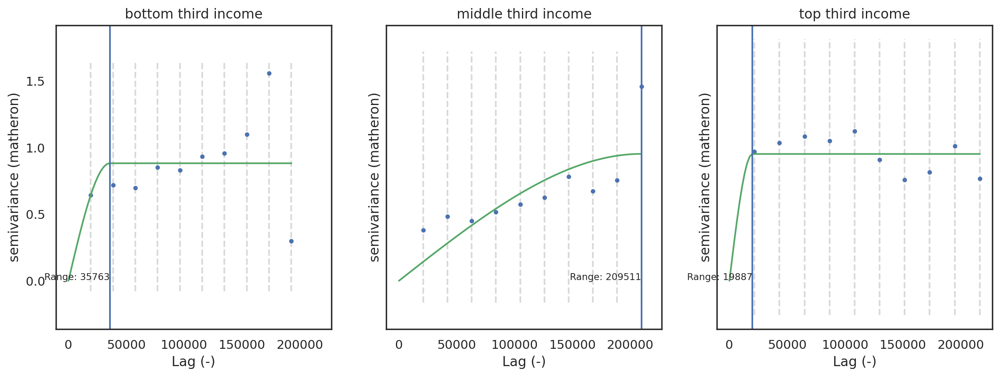

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharex=True, sharey=True)

bottom_svg.plot(axes=ax[0])
middle_svg.plot(axes=ax[1])
top_svg.plot(axes=ax[2])

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income');

bottom_range = bottom_svg.parameters[0]
middle_range = middle_svg.parameters[0]
top_range = top_svg.parameters[0]

ax[0].annotate(f'Range: {bottom_range:.0f}', (bottom_range,.005), ha='right', size='x-small')
ax[1].annotate(f'Range: {middle_range:.0f}', (middle_range,.005), ha='right', size='x-small')
ax[2].annotate(f'Range: {top_range:.0f}', (top_range,.005), ha='right', size='x-small')

ax[0].axvline(bottom_range)
ax[1].axvline(middle_range)
ax[2].axvline(top_range)

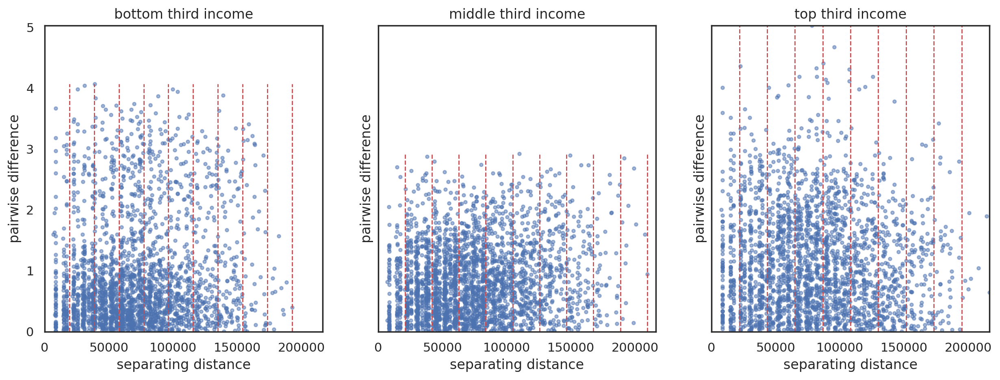

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharex=True, sharey=True)

bottom_svg.distance_difference_plot(ax=ax[0])
middle_svg.distance_difference_plot(ax=ax[1])
top_svg.distance_difference_plot(ax=ax[2])

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income');

In [ ]:
from matplotlib.colors import Normalize

In [ ]:
norm = Normalize(
    vmin = warrant_tracts_centroid_nonan['log warrant prevalence'].min(),
    vmax = warrant_tracts_centroid_nonan['log warrant prevalence'].max()
)

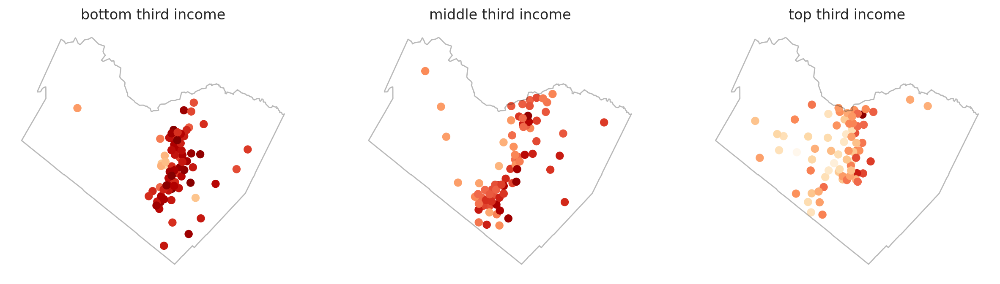

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5))

bottom_third.plot(column='log warrant prevalence', ax=ax[0], cmap='OrRd', norm=norm)
middle_third.plot(column='log warrant prevalence', ax=ax[1], cmap='OrRd', norm=norm)
top_third.plot(column='log warrant prevalence', ax=ax[2], cmap='OrRd', norm=norm)

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income')


ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')


travis.plot(ax=ax[0], facecolor='none', edgecolor='k', alpha=0.3)
travis.plot(ax=ax[1], facecolor='none', edgecolor='k', alpha=0.3)
travis.plot(ax=ax[2], facecolor='none', edgecolor='k', alpha=0.3);

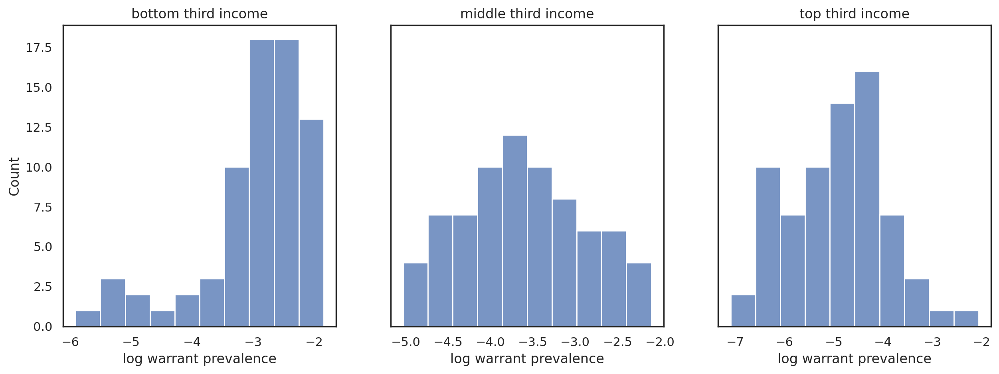

In [ ]:
fig, ax = plt.subplots(1,3,figsize=(15,5), sharey=True)


sns.histplot(data=bottom_third['log warrant prevalence'], ax=ax[0], bins=10)
sns.histplot(data=middle_third['log warrant prevalence'], ax=ax[1], bins=10)
sns.histplot(data=top_third['log warrant prevalence'], ax=ax[2], bins=10)

ax[0].set_title('bottom third income')
ax[1].set_title('middle third income')
ax[2].set_title('top third income');

## kde from all warrant points with bandwidth from svg

- read in ids points
- subset by tract income quantile
- run three kdes with bw = range

In [ ]:
ids = warrants.drop_duplicates('ID')

In [ ]:
quantiles = pd.concat([
   pd.DataFrame(index=bottom_third['GEOID'], data={'quantile':'bottom third'}),
   pd.DataFrame(index=middle_third['GEOID'], data={'quantile':'middle third'}),
   pd.DataFrame(index=top_third['GEOID'], data={'quantile':'top third'}),
])

In [ ]:
ids = ids.merge(quantiles, left_on='GEOID', right_index=True, how='left')

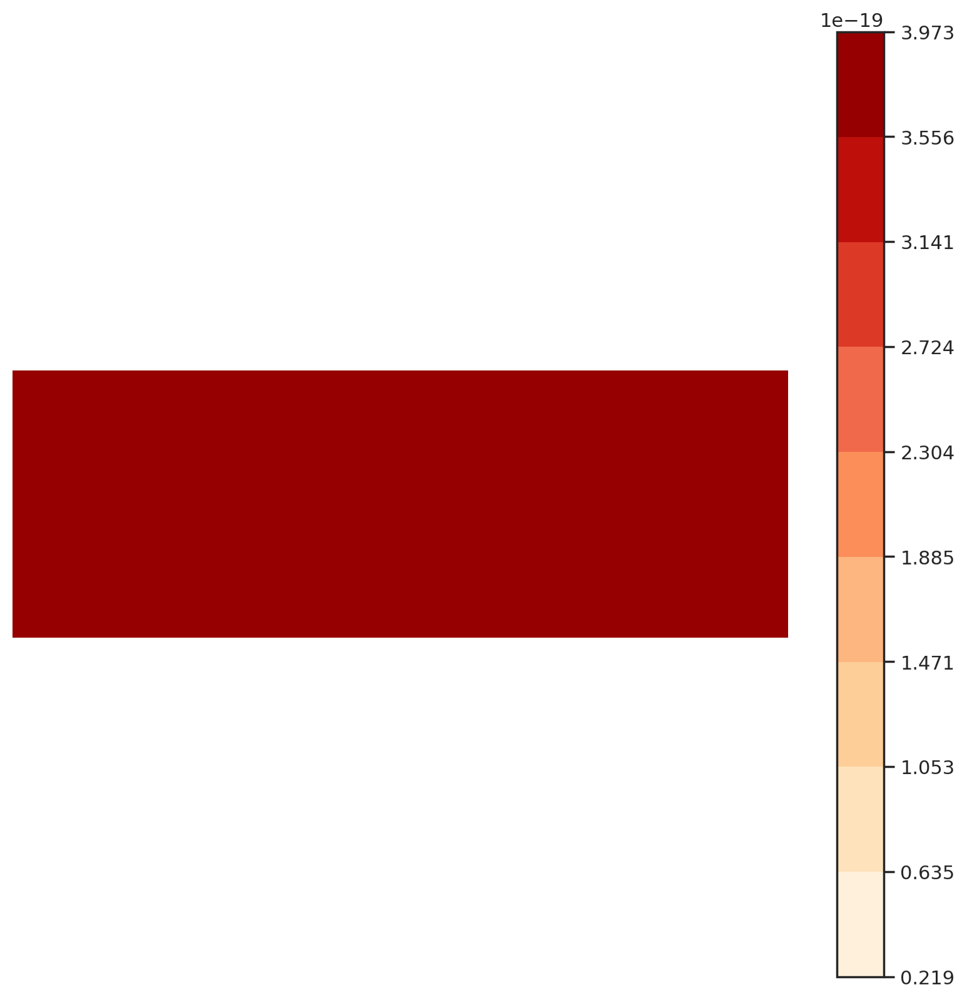

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))

geoplot.kdeplot(
   ids[ids['quantile'] == 'bottom third'],
   shade=True,
   cmap='OrRd',
   thresh=0.05,
   cbar=True,
   bw_method=bottom_range_bin,
   ax=ax 
  
)

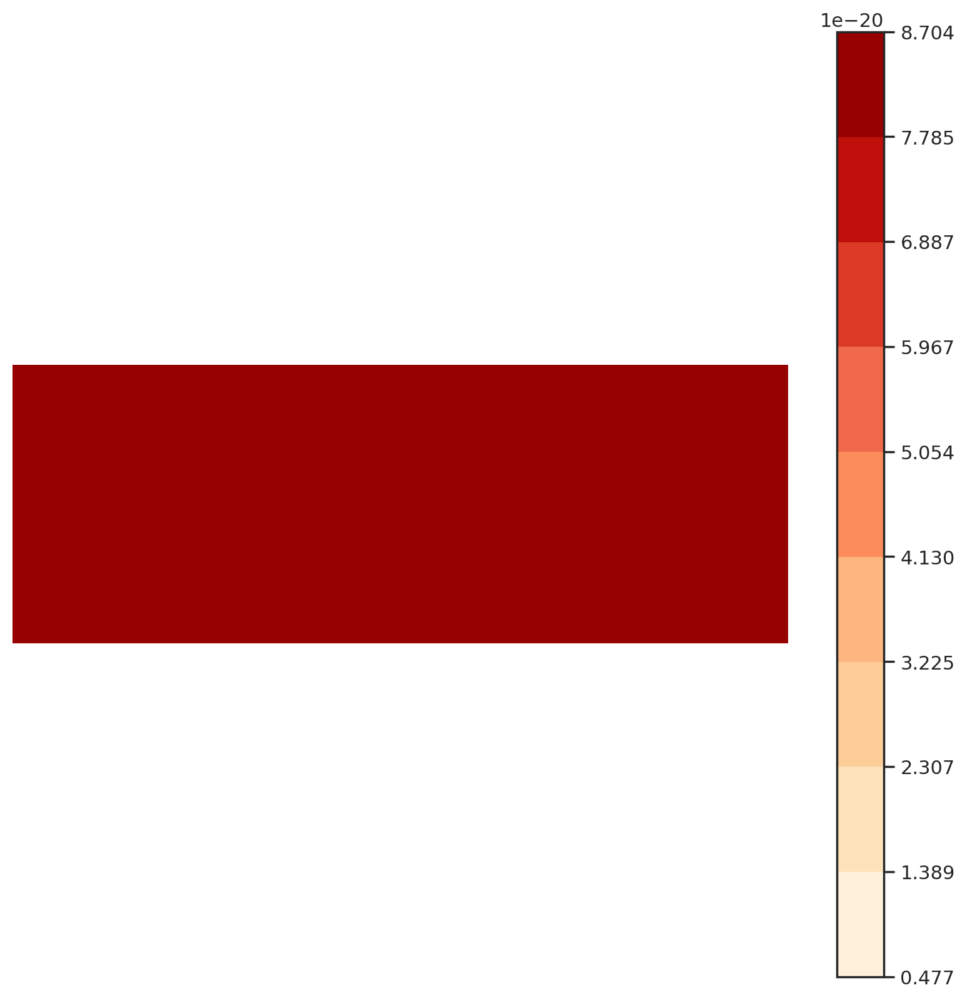

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))

geoplot.kdeplot(
   ids[ids['quantile'] == 'middle third'],
   shade=True,
   cmap='OrRd',
   thresh=0.05,
   cbar=True,
   bw_method=middle_range_bin,
   ax=ax 
  
)

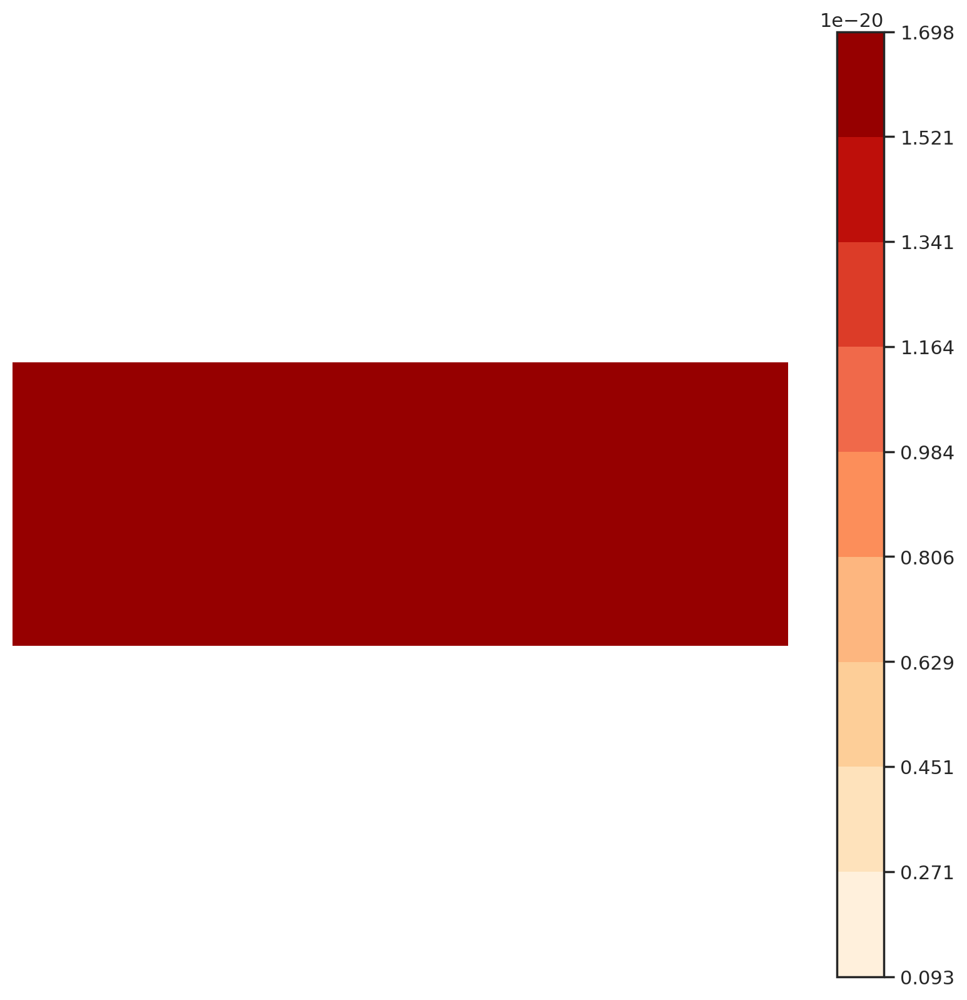

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))

geoplot.kdeplot(
   ids[ids['quantile'] == 'top third'],
   shade=True,
   cmap='OrRd',
   thresh=0.05,
   cbar=True,
   bw_method=top_range_bin,
   ax=ax 
  
)

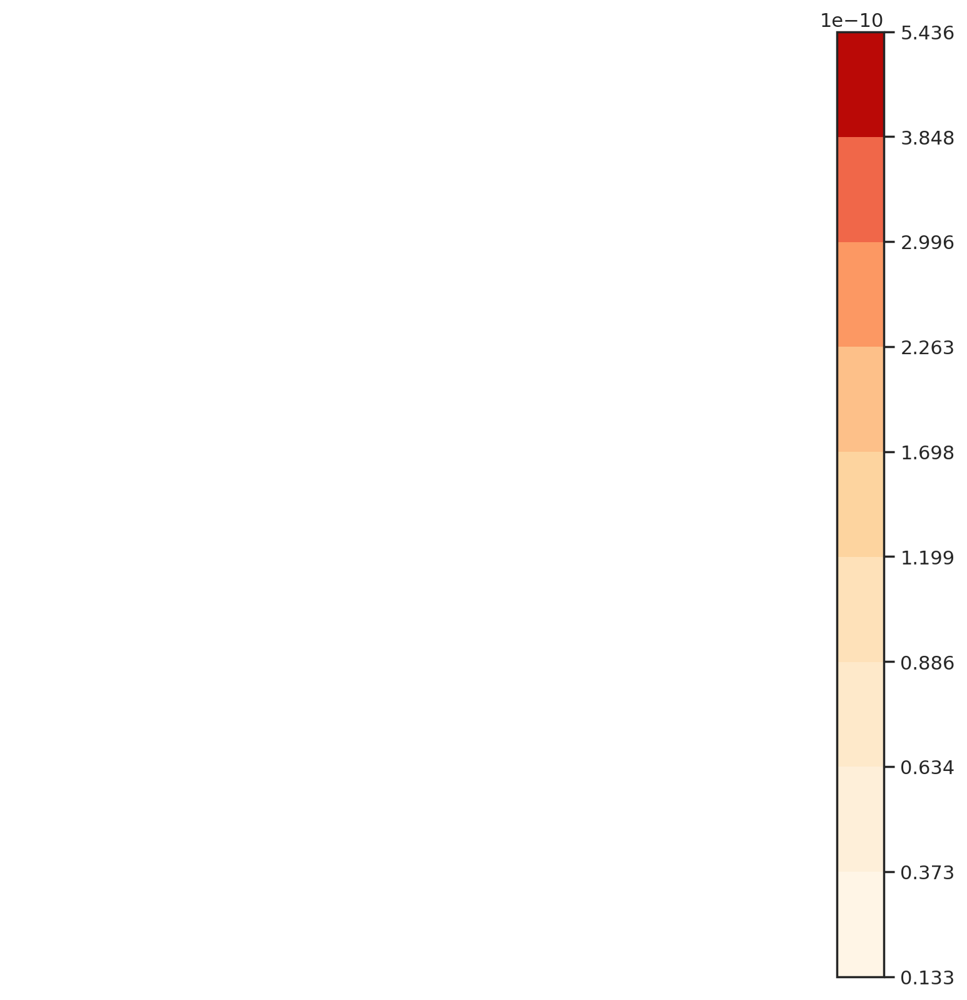

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))

geoplot.kdeplot(
   ids[ids['quantile'] == 'top third'],
   shade=True,
   cmap='OrRd',
   thresh=0.05,
   cbar=True,
   ax=ax 
  
)

## GWR

In [ ]:
stops_by_tract = pd.read_csv('/content/drive/MyDrive/DDMPE - Group Project/processed data/stops_by_tract.csv', usecols=['GEOID','stops','stop prevalence'])

In [ ]:
stops_by_tract['GEOID'] = stops_by_tract['GEOID'].astype(str)

In [ ]:
tract_features = gpd.read_file('/content/drive/MyDrive/DDMPE - Group Project/processed data/tract_features__.geojson', index_col=0)

In [ ]:
tract_features = tract_features.merge(stops_by_tract, on='GEOID', how='left')

In [ ]:
tract_features

,GEOID,total population,[denominator: total population for Race],total: White,total: Black,total: Asian,[denominator: total population for Hispanic or Latino],total: Hispanic or Latino (any race),[denominator: total population for poverty],total: income below poverty level,...,most frequent citation,most costly citation,total: households,total: hhs received SNAP,balance per household,balance per household per median rent,log_prevalence,geometry,stops,stop prevalence
0,48453001779,6546.0,6546.0,6192.0,199.0,53.0,6546.0,1193.0,6462.0,283.0,...,SPEEDING - STATE HIGHWAY,SPEEDING - STATE HIGHWAY,2538.0,144.0,6.399803,0.004685,-5.528513,"POLYGON ((-98.03709 30.42049, -98.03706 30.421...",NaN,NaN
1,48453001778,4339.0,4339.0,4020.0,181.0,59.0,4339.0,378.0,4263.0,77.0,...,FAILED TO MAINTAIN ASSURED CLEAR DISTANCE - CO...,FAILED TO MAINTAIN ASSURED CLEAR DISTANCE - CO...,1779.0,41.0,1.891619,0.001197,-6.429489,"POLYGON ((-97.98135 30.36760, -97.98082 30.367...",NaN,NaN
2,48453001740,5017.0,5017.0,4067.0,214.0,501.0,5017.0,985.0,5017.0,219.0,...,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,2021.0,11.0,6.789560,0.004037,-5.576148,"POLYGON ((-97.86957 30.19587, -97.86929 30.196...",6.0,0.001196
3,48453001729,5075.0,5075.0,4272.0,19.0,480.0,5075.0,1631.0,5075.0,332.0,...,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,2246.0,27.0,14.216064,0.010438,-4.489031,"POLYGON ((-97.84230 30.19542, -97.84024 30.198...",11.0,0.002167
4,48453002423,6007.0,6007.0,5252.0,373.0,133.0,6007.0,2271.0,6007.0,478.0,...,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,2609.0,80.0,19.007896,0.011116,-4.212044,"POLYGON ((-97.82000 30.17389, -97.81865 30.176...",15.0,0.002497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
213,48453000306,6029.0,6029.0,4602.0,396.0,623.0,6029.0,1162.0,6000.0,630.0,...,NO DRIVERS LICENSE,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,2805.0,122.0,20.757868,0.013072,-3.959404,"POLYGON ((-97.71249 30.30596, -97.71242 30.306...",48.0,0.007962
214,48453002201,2223.0,2223.0,779.0,851.0,8.0,2223.0,1117.0,2223.0,314.0,...,NO DRIVERS LICENSE,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,664.0,100.0,111.769623,0.080817,-2.894429,"POLYGON ((-97.67323 30.32572, -97.67293 30.325...",55.0,0.024741
215,48453002319,2368.0,2368.0,1176.0,636.0,40.0,2368.0,827.0,37.0,36.0,...,DRIVING WHILE LICENSE INVALID - SUSPENDED,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,0.0,0.0,NaN,NaN,-5.690359,"POLYGON ((-97.64923 30.19899, -97.64446 30.202...",2.0,0.000845
216,48453002207,9940.0,9940.0,3627.0,2287.0,66.0,9940.0,6561.0,9940.0,982.0,...,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,FAILED TO MAINTAIN FINANCIAL RESPONSIBILITY,2981.0,408.0,67.916270,0.044623,-3.477475,"POLYGON ((-97.65880 30.22676, -97.65862 30.227...",3.0,0.000302


In [ ]:
tract_features.plot(
    column='stop prevalence',
    cmap='Blues'
)

In [ ]:
austin_tracts, austin_bounds = acs.from_place(
    'Austin, TX',
    return_bounds=True
)

/usr/local/lib/python3.7/dist-packages/cenpy/geoparser.py:214: UserWarning: Shape is invalid: 
Ring Self-intersection[-10884881.1468 3554135.7868]
  tell_user('Shape is invalid: \n{}'.format(vexplain))
/usr/local/lib/python3.7/dist-packages/cenpy/geoparser.py:229: ShapelyDeprecationWarning: The 'cascaded_union()' function is deprecated. Use 'unary_union()' instead.
  polygons[i] = exterior.difference(cascaded_union(owned_interiors))
/usr/local/lib/python3.7/dist-packages/pandas/core/dtypes/cast.py:1990: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  result[:] = values
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyp

Matched: Austin, TX to Austin city within layer Incorporated Places


/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
austin_bounds.to_crs('EPSG:32040', inplace=True)
tract_features.to_crs('EPSG:32040', inplace=True)

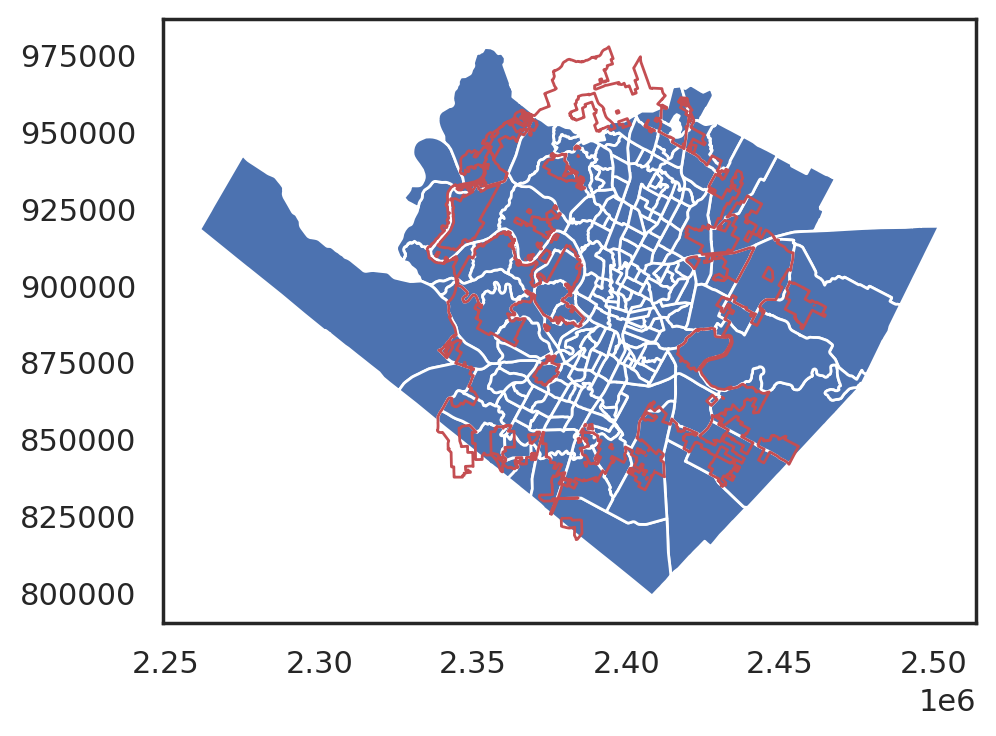

In [ ]:
ax = tract_features.sjoin(austin_bounds).plot()

austin_bounds.plot(ax=ax, facecolor='none', edgecolor='r')

In [ ]:
austin_features = tract_features.sjoin(austin_bounds)

In [ ]:
import statsmodels.formula.api as smf
import statsmodels
from statsmodels.tools.tools import add_constant

In [ ]:
pip install mgwr

In [ ]:
from mgwr.gwr import GWR, MGWR

In [ ]:
austin_features.columns

Index(['GEOID_left', 'total population',
       '[denominator: total population for Race]', 'total: White',
       'total: Black', 'total: Asian',
       '[denominator: total population for Hispanic or Latino]',
       'total: Hispanic or Latino (any race)',
       '[denominator: total population for poverty]',
       'total: income below poverty level', 'median gross rent',
       '[denominator: total population for income on rent]',
       'total: paying >50 percent of income on rent', 'NAME_left', 'state',
       'county', 'tract', 'count of individuals with warrant record',
       'warrant prevalence', 'total tract balance', 'percent poverty',
       'mean balance', 'median income', 'most frequent citation',
       'most costly citation', 'total: households', 'total: hhs received SNAP',
       'balance per household', 'balance per household per median rent',
       'log_prevalence', 'geometry', 'stops', 'stop prevalence', 'index_right',
       'MTFCC', 'OID', 'GEOID_right', 'STATE'

In [ ]:
X_cols = [
  'total: White',
  'total: Black', 
  'total: Asian',
  'total: Hispanic or Latino (any race)',
  'median income',
  'total: paying >50 percent of income on rent',
  'stops'
]

In [ ]:
austin_features_nonan = austin_features.dropna(subset=X_cols)

In [ ]:
lm = statsmodels.regression.linear_model.OLS(
    endog = austin_features_nonan['count of individuals with warrant record'],
    exog = add_constant(austin_features_nonan[X_cols])
).fit()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [ ]:
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       OLS Regression Results                                       
====================================================================================================
Dep. Variable:     count of individuals with warrant record   R-squared:                       0.686
Model:                                                  OLS   Adj. R-squared:                  0.674
Method:                                       Least Squares   F-statistic:                     58.02
Date:                                      Mon, 09 May 2022   Prob (F-statistic):           1.76e-43
Time:                                              15:24:05   Log-Likelihood:                -1058.9
No. Observations:                                       194   AIC:                             2134.
Df Residuals:                                           186   BIC:                             2160.
Df Model:                                                 7                                         
Covariance Type:                                  nonrobust                                         
===============================================================================================================
                                                  coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
const                                          36.2792     19.589      1.852      0.066      -2.367      74.925
total: White                                   -0.0050      0.003     -1.753      0.081      -0.011       0.001
total: Black                                    0.0268      0.011      2.491      0.014       0.006       0.048
total: Asian                                   -0.0117      0.011     -1.107      0.270      -0.033       0.009
total: Hispanic or Latino (any race)            0.0349      0.004      9.433      0.000       0.028       0.042
median income                                  -0.0004      0.000     -0.925      0.356      -0.001       0.000
total: paying >50 percent of income on rent    -0.0064      0.027     -0.237      0.813      -0.060       0.047
stops                                           0.6601      0.097      6.830      0.000       0.469       0.851
==============================================================================
Omnibus:                       99.236   Durbin-Watson:                   1.956
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              467.965
Skew:                           1.993   Prob(JB):                    2.41e-102
Kurtosis:                       9.481   Cond. No.                     2.17e+05
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.17e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
pm = statsmodels.discrete.discrete_model.Poisson(
    endog = austin_features_nonan['count of individuals with warrant record'],
    exog = add_constant(austin_features_nonan[X_cols])
).fit(maxiter=200)

Optimization terminated successfully.
         Current function value: 17.398095
         Iterations 102


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [ ]:
pm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     Poisson Regression Results                                     
====================================================================================================
Dep. Variable:     count of individuals with warrant record   No. Observations:                  194
Model:                                              Poisson   Df Residuals:                      186
Method:                                                 MLE   Df Model:                            7
Date:                                      Mon, 09 May 2022   Pseudo R-squ.:                  0.6357
Time:                                              15:24:05   Log-Likelihood:                -3375.2
converged:                                             True   LL-Null:                       -9265.0
Covariance Type:                                  nonrobust   LLR p-value:                     0.000
===============================================================================================================
                                                  coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------------
const                                           4.5536      0.033    138.448      0.000       4.489       4.618
total: White                                 5.871e-06   5.87e-06      1.001      0.317   -5.63e-06    1.74e-05
total: Black                                    0.0003   1.52e-05     18.230      0.000       0.000       0.000
total: Asian                                   -0.0002   2.29e-05     -7.719      0.000      -0.000      -0.000
total: Hispanic or Latino (any race)            0.0002   5.21e-06     34.939      0.000       0.000       0.000
median income                               -1.945e-05   7.28e-07    -26.722      0.000   -2.09e-05    -1.8e-05
total: paying >50 percent of income on rent    -0.0002   4.19e-05     -5.810      0.000      -0.000      -0.000
stops                                           0.0056      0.000     46.245      0.000       0.005       0.006
===============================================================================================================
"""

In [ ]:
y = austin_features_nonan['count of individuals with warrant record'].values.reshape((-1,1))

In [ ]:
X = austin_features_nonan[X_cols].values

In [ ]:
tract_centroid_coords = np.stack(austin_features_nonan.centroid.apply(lambda p: np.asarray(p)).values)

/usr/local/lib/python3.7/dist-packages/pandas/core/apply.py:1101: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  convert=self.convert_dtype,


In [ ]:
gwr = GWR(
    y=y,
    X=X,
    coords=tract_centroid_coords,
    bw=bottom_range_bin,
    fixed=True,
    kernel='gaussian',
    spherical=False
  
).fit()

In [ ]:
gwr.R2

0.7125773220398306

In [ ]:
gwr.summary()

Model type                                                         Gaussian
Number of observations:                                                 194
Number of covariates:                                                     8

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                         625758.186
Log-likelihood:                                                   -1058.924
AIC:                                                               2133.847
AICc:                                                              2136.825
BIC:                                                             624778.365
R2:                                                                   0.686
Adj. R2:                                                              0.674

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [ ]:
result = gpd.GeoDataFrame(
    data=gwr.params, 
    columns=['c0']+ X_cols, 
    geometry=austin_features_nonan['geometry'].reset_index(drop=True))
result['local R2'] = gwr.localR2

In [ ]:
result

,c0,total: White,total: Black,total: Asian,total: Hispanic or Latino (any race),median income,total: paying >50 percent of income on rent,stops,geometry,local R2
0,30.828951,-0.005188,0.022764,-0.011297,0.036698,-0.000379,-0.002940,0.657432,"POLYGON ((2357229.835 860673.311, 2357317.136 ...",0.697346
1,27.800055,-0.006052,0.025544,-0.012366,0.037713,-0.000274,-0.000545,0.645928,"POLYGON ((2365846.240 860593.929, 2366485.221 ...",0.712056
2,28.020433,-0.006152,0.026930,-0.012691,0.037385,-0.000283,0.000972,0.659604,"POLYGON ((2372970.936 852835.292, 2373386.124 ...",0.702893
3,25.112050,-0.006930,0.026228,-0.011151,0.040769,-0.000136,-0.007068,0.604529,"POLYGON ((2369860.347 895658.438, 2369882.457 ...",0.742381
4,23.519951,-0.007585,0.029837,-0.015637,0.039019,-0.000098,0.007179,0.624825,"POLYGON ((2382733.841 873256.970, 2382762.679 ...",0.733788
...,...,...,...,...,...,...,...,...,...,...
189,21.202651,-0.008962,0.033811,-0.021531,0.038848,0.000032,0.020758,0.618759,"POLYGON ((2399005.233 884905.854, 2399081.392 ...",0.740430
190,24.393474,-0.009082,0.032673,-0.020005,0.039264,0.000016,0.014649,0.614296,"POLYGON ((2406413.036 901225.798, 2406430.842 ...",0.736717
191,26.511271,-0.009708,0.033089,-0.022322,0.038360,0.000028,0.020311,0.627465,"POLYGON ((2418719.788 908549.212, 2418814.943 ...",0.727867
192,18.430037,-0.007838,0.038360,-0.034916,0.034617,-0.000012,0.046911,0.658899,"POLYGON ((2426824.089 862546.723, 2428314.082 ...",0.731267


In [ ]:
result.plot(
    column='total: Hispanic or Latino (any race)',
    legend=True,
    cmap='OrRd'
)

In [ ]:
result.plot(
    column='stops',
    legend=True,
    cmap='PuBu'
)

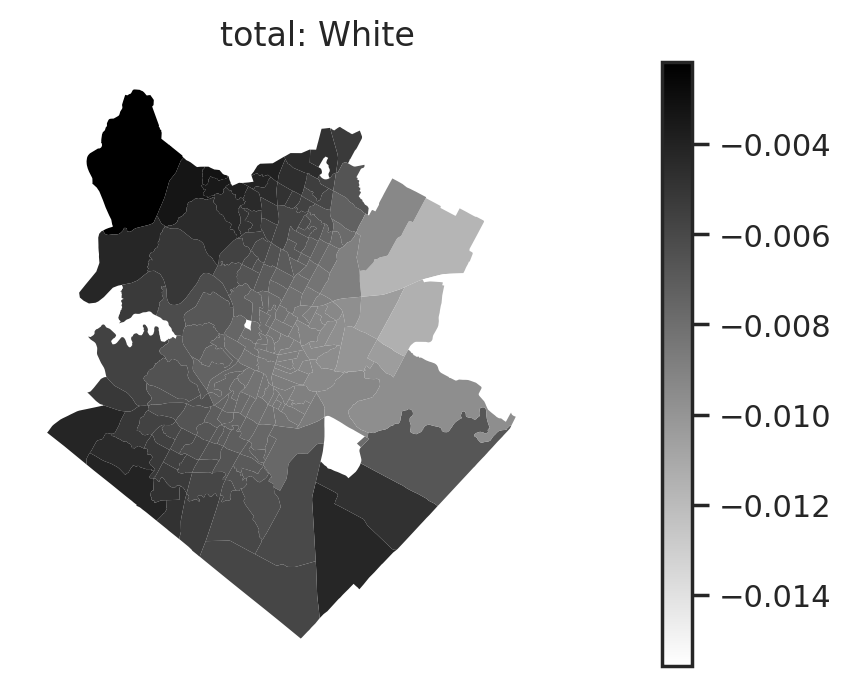

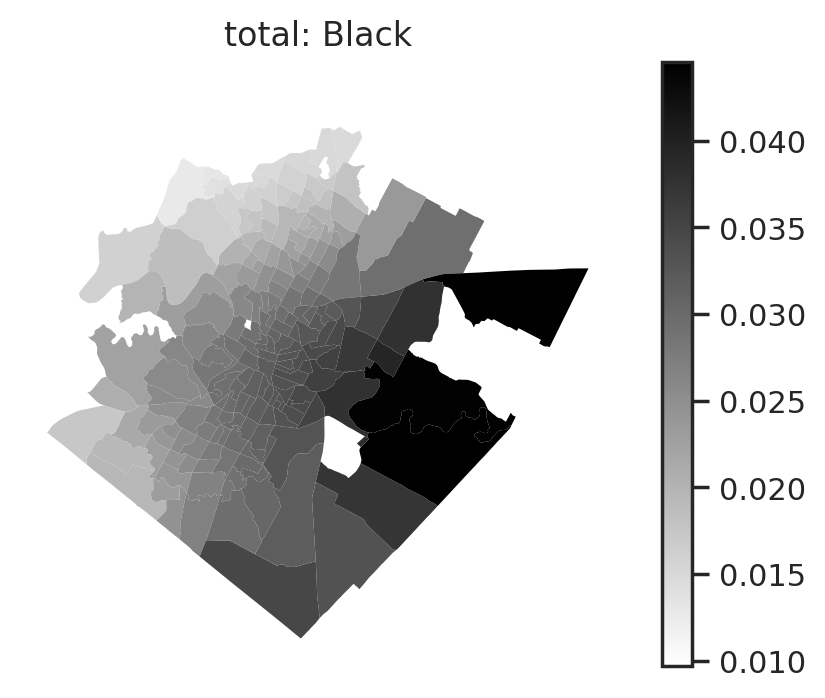

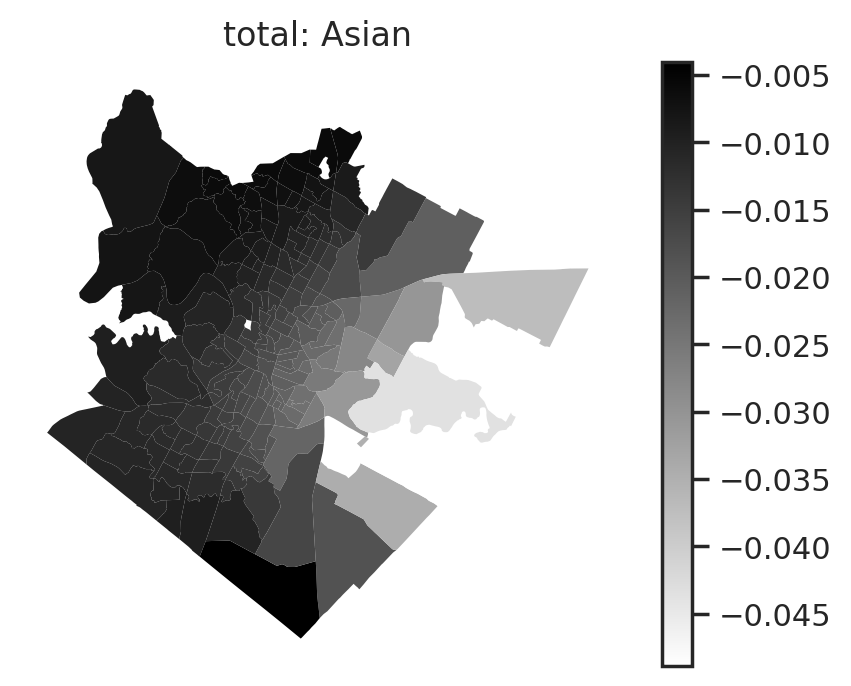

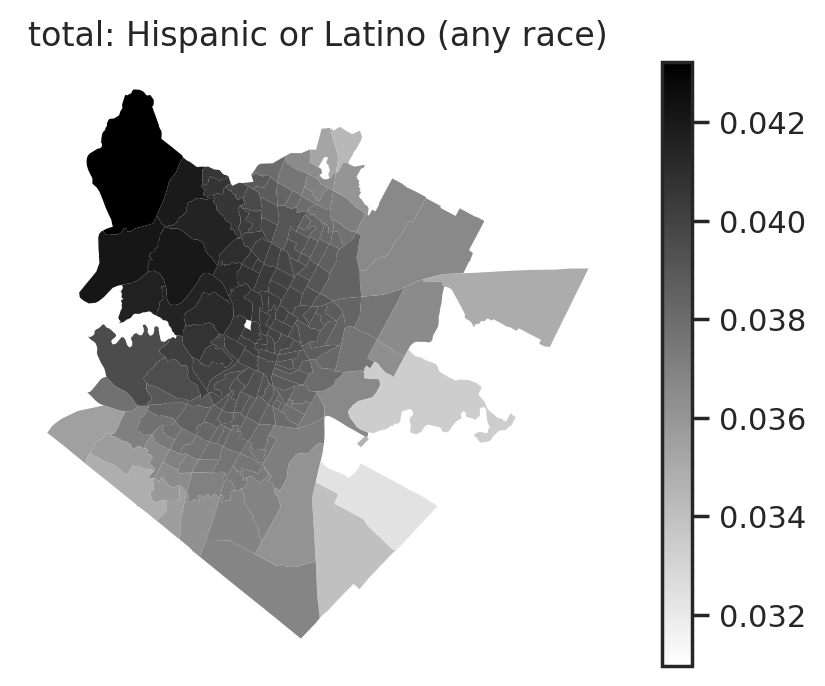

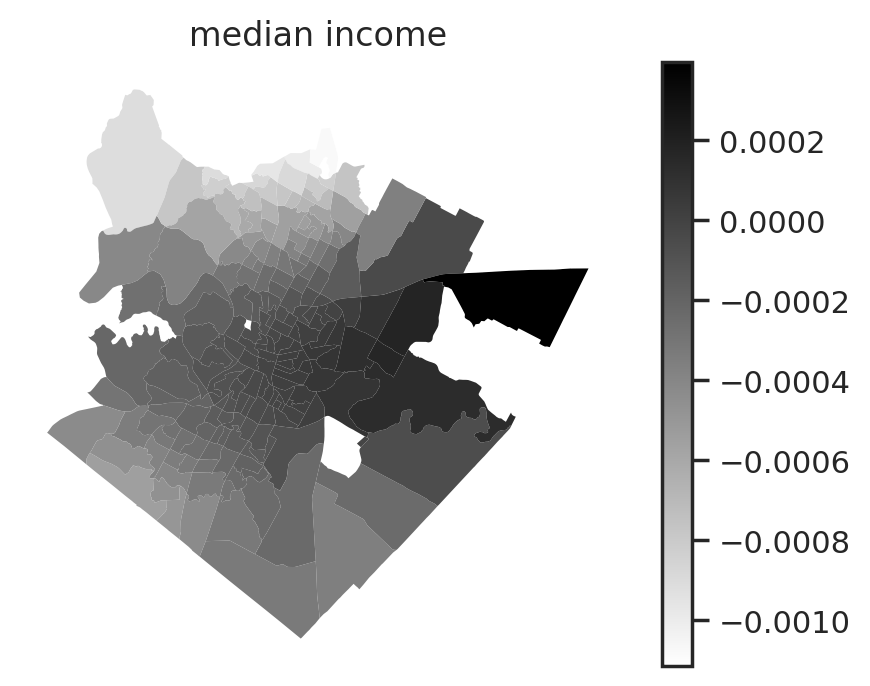

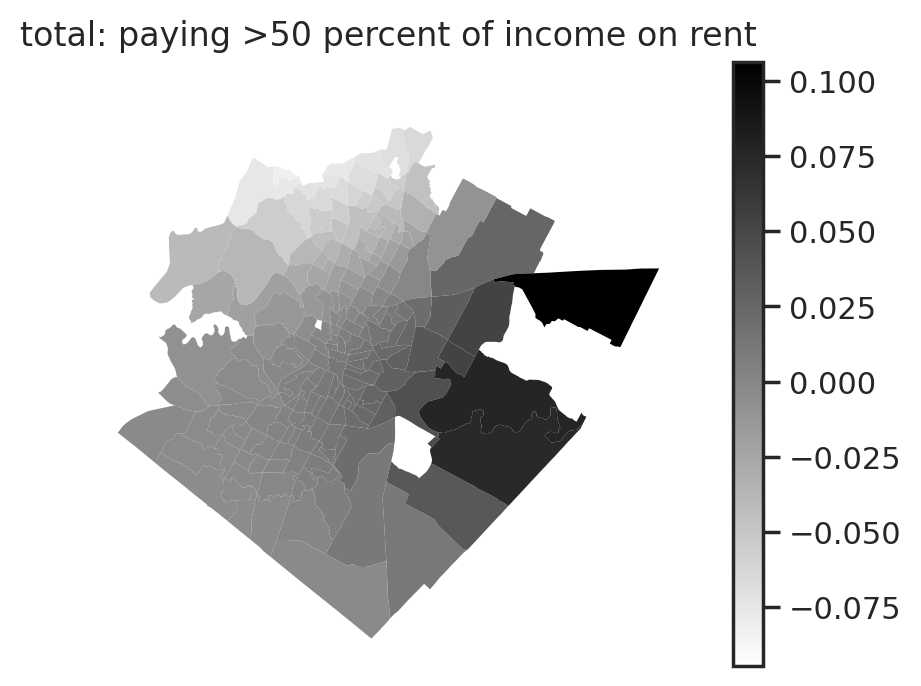

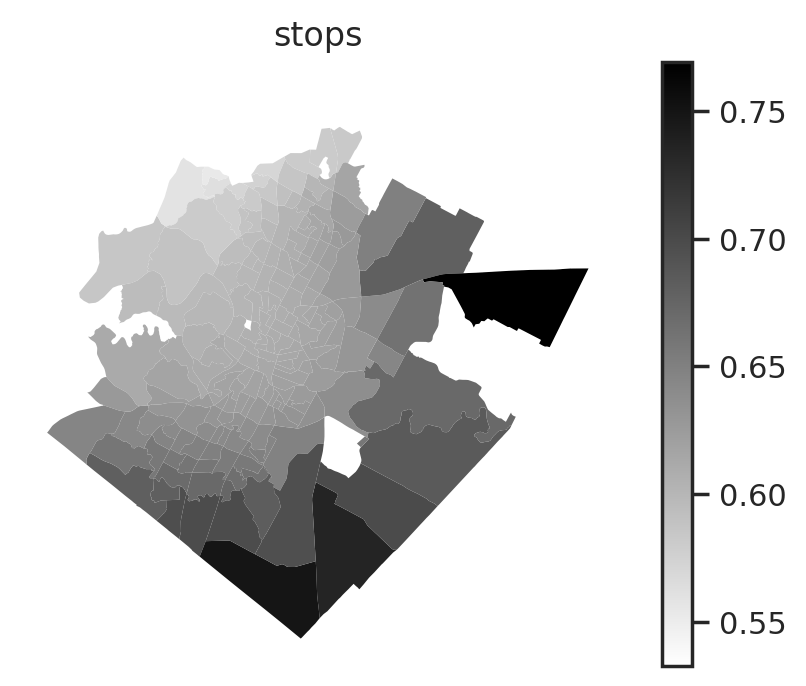

In [ ]:
norm = Normalize(0,1)

for col in X_cols:
  result.plot(
    column=col,
    legend=True,
    cmap='binary',
    edgecolor='none')
  
  plt.title(col)
  plt.axis('off')
  plt.show()

In [ ]:
gwr_top_bw = GWR(
    y=y,
    X=X,
    coords=tract_centroid_coords,
    bw=top_range_bin,
    fixed=True,
    kernel='gaussian',
    spherical=False
  
).fit()

In [ ]:
gwr_top_bw.summary()

Model type                                                         Gaussian
Number of observations:                                                 194
Number of covariates:                                                     8

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                         625758.186
Log-likelihood:                                                   -1058.924
AIC:                                                               2133.847
AICc:                                                              2136.825
BIC:                                                             624778.365
R2:                                                                   0.686
Adj. R2:                                                              0.674

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [ ]:
result = gpd.GeoDataFrame(
    data=gwr.params, 
    columns=['c0']+ X_cols, 
    geometry=austin_features_nonan['geometry'].reset_index(drop=True))
result['local R2'] = gwr.localR2

In [ ]:
result.columns[2]

'total: Black'

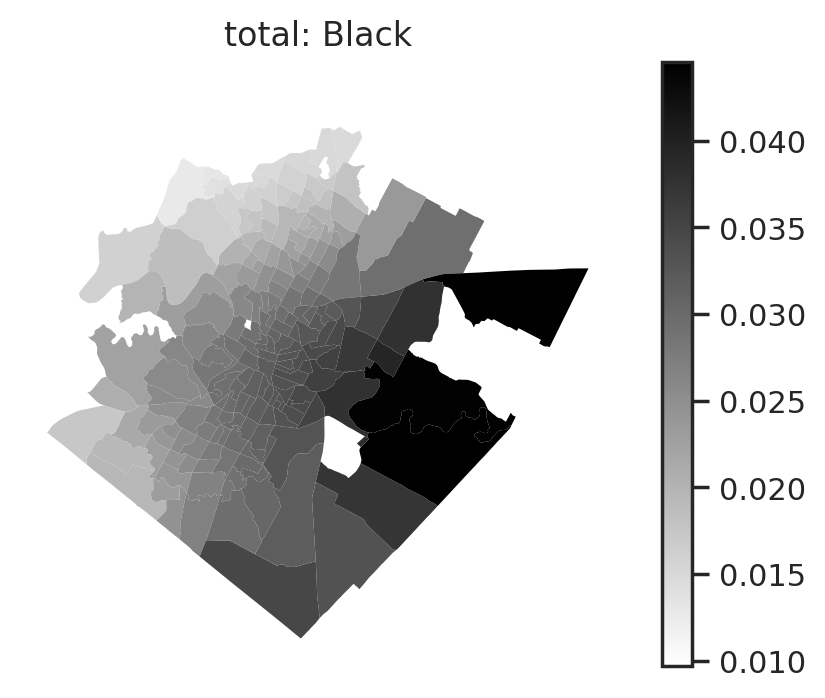

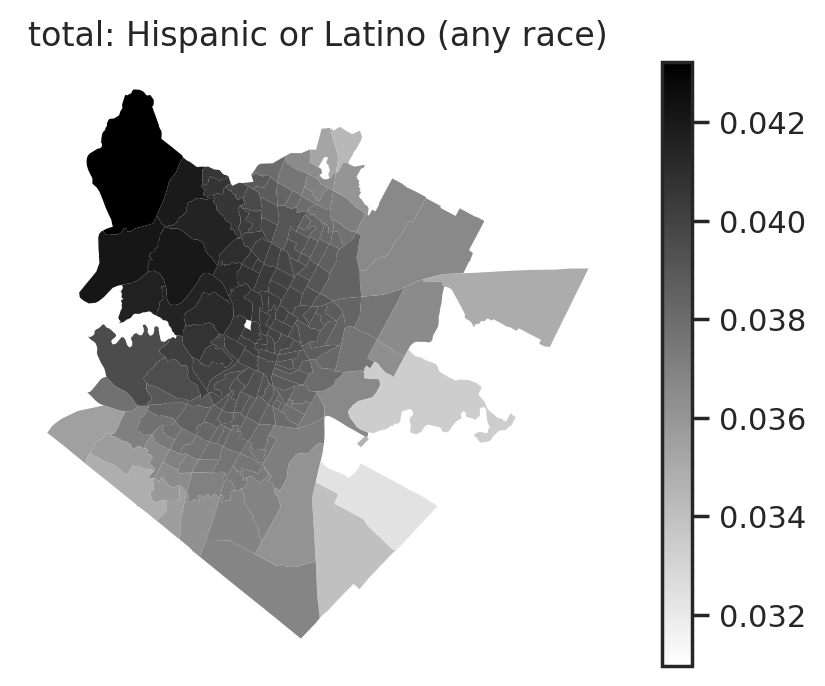

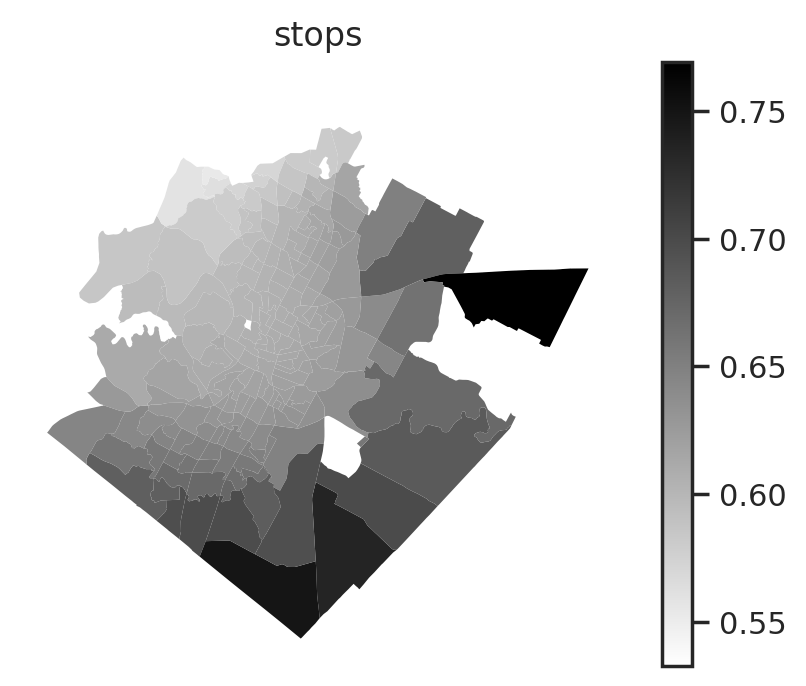

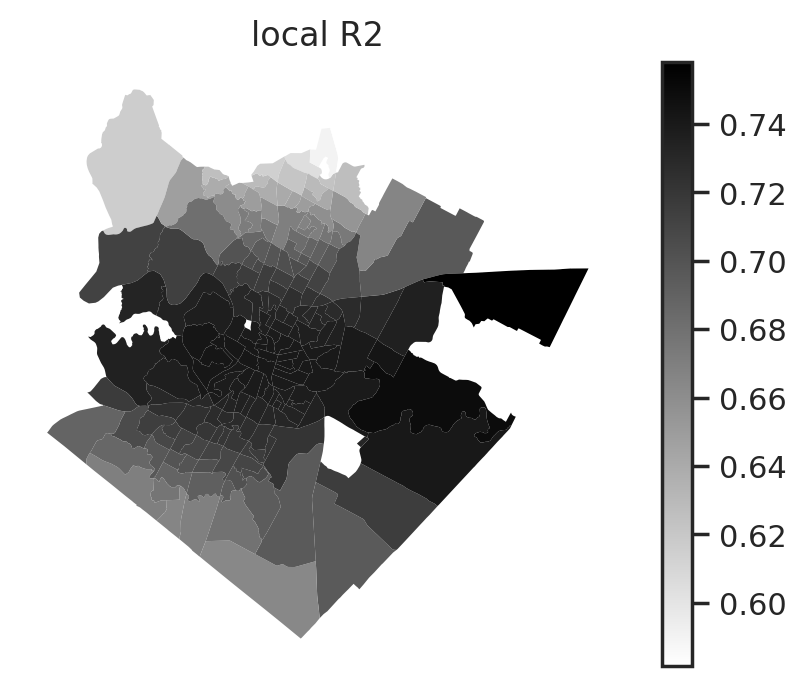

In [ ]:
for col in ['total: Black','total: Hispanic or Latino (any race)','stops', 'local R2']:
  result.plot(
    column=col,
    legend=True,
    cmap='binary',
    edgecolor='none')
  
  plt.title(col)
  plt.axis('off')
  plt.show()

## GWR with stops by hexbin

In [ ]:
stops = pd.read_csv('/content/drive/MyDrive/DDMPE - Group Project/Austin Warrant Data/2019_Racial_Profiling__RP__Arrests.csv')

In [ ]:
stops = stops.dropna(subset=['X_COORDINATE','Y_COORDINATE'])

In [ ]:
stops = gpd.GeoDataFrame(
    data=stops,
    geometry=gpd.points_from_xy(
        x=stops['X_COORDINATE'],
        y=stops['Y_COORDINATE'],
        crs='ESRI:102739'
    )
)

In [ ]:
stops.to_crs('EPSG:32040', inplace=True)

In [ ]:
travis_hex_with_income

,geometry,median income
hex_id,,
87489eaabffffff,"POLYGON ((2406288.922 805893.706, 2411180.537 ...",29005.0
87489ea8dffffff,"POLYGON ((2406288.922 805893.706, 2404369.113 ...",29005.0
87489ea88ffffff,"POLYGON ((2414152.108 809113.710, 2412232.431 ...",20526.0
87489ea8affffff,"POLYGON ((2420094.566 816922.334, 2423065.453 ...",20526.0
87489ea89ffffff,"POLYGON ((2407341.050 814388.258, 2405421.317 ...",29005.0
...,...,...
87489850dffffff,"POLYGON ((2325662.857 998640.217, 2323743.345 ...",47456.0
874898570ffffff,"POLYGON ((2310978.237 1000714.485, 2309058.549...",47456.0
874898508ffffff,"POLYGON ((2338424.987 1001154.177, 2333531.458...",47456.0


In [ ]:
warrants_by_hexbin

,geometry,count,GEOID
hex_id,,,
87489eaabffffff,"POLYGON ((2406288.922 805893.706, 2411180.537 ...",NaN,NaN
87489ea8dffffff,"POLYGON ((2406288.922 805893.706, 2404369.113 ...",47.0,48453002434
87489ea88ffffff,"POLYGON ((2414152.108 809113.710, 2412232.431 ...",7.0,48453002436
87489ea8affffff,"POLYGON ((2420094.566 816922.334, 2423065.453 ...",10.0,48453002436
87489ea89ffffff,"POLYGON ((2407341.050 814388.258, 2405421.317 ...",3.0,48453002434
...,...,...,...
87489850dffffff,"POLYGON ((2325662.857 998640.217, 2323743.345 ...",11.0,48453001766
874898570ffffff,"POLYGON ((2310978.237 1000714.485, 2309058.549...",NaN,NaN
874898508ffffff,"POLYGON ((2338424.987 1001154.177, 2333531.458...",NaN,NaN


In [ ]:
stops_by_hex = gpd.sjoin(stops, travis_hex).groupby('index_right')[['PRIMARY_KEY']].count().rename(columns={'PRIMARY_KEY':'stops'})

In [ ]:
stops_and_warrants_by_hex = warrants_by_hexbin.join(stops_by_hex, how='right')

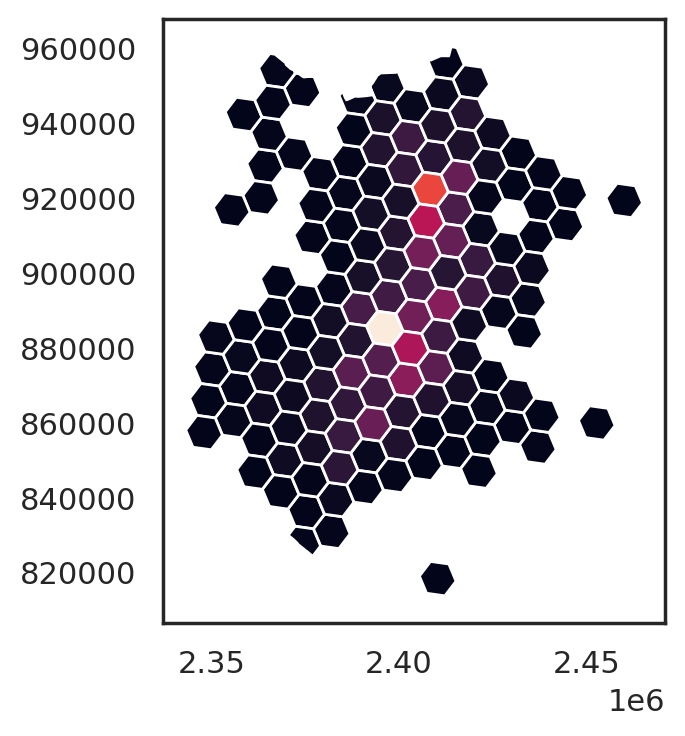

In [ ]:
stops_and_warrants_by_hex.plot(
    column = 'stops'
)

In [ ]:
stops_and_warrants_by_hex

,geometry,count,GEOID,stops
index_right,,,,
874898c90ffffff,"POLYGON ((2361269.281 924531.098, 2359349.711 ...",3.0,48453001760,3
874898c92ffffff,"POLYGON ((2369135.198 927741.955, 2367215.756 ...",10.0,48453001716,7
874898c93ffffff,"POLYGON ((2362323.129 933019.645, 2360403.633 ...",5.0,48453001714,9
874898c94ffffff,"POLYGON ((2360215.351 916041.821, 2358295.705 ...",4.0,48453001761,2
874898c9effffff,"POLYGON ((2355510.591 938297.643, 2353591.042 ...",1.0,48453001765,1
...,...,...,...,...
87489eadaffffff,"POLYGON ((2396875.242 850418.126, 2394955.623 ...",88.0,48453002426,63
87489eadbffffff,"POLYGON ((2390063.682 855693.871, 2388144.008 ...",2136.0,48453002402,198
87489eadcffffff,"POLYGON ((2387957.987 838707.946, 2386038.162 ...",338.0,48453002426,8


In [ ]:
lm = smf.ols('stops ~ count', data=stops_and_warrants_by_hex).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  stops   R-squared:                       0.429
Model:                            OLS   Adj. R-squared:                  0.424
Method:                 Least Squares   F-statistic:                     99.81
Date:                Mon, 09 May 2022   Prob (F-statistic):           7.07e-18
Time:                        15:24:19   Log-Likelihood:                -767.68
No. Observations:                 135   AIC:                             1539.
Df Residuals:                     133   BIC:                             1545.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     11.5300      7.609      1.515      0.132      -3.521      26.581
count          0.1500      0.015      9.990      0.000       0.120       0.180
==============================================================================
Omnibus:                      193.659   Durbin-Watson:                   1.917
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            12720.811
Skew:                           5.591   Prob(JB):                         0.00
Kurtosis:                      49.222   Cond. No.                         623.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

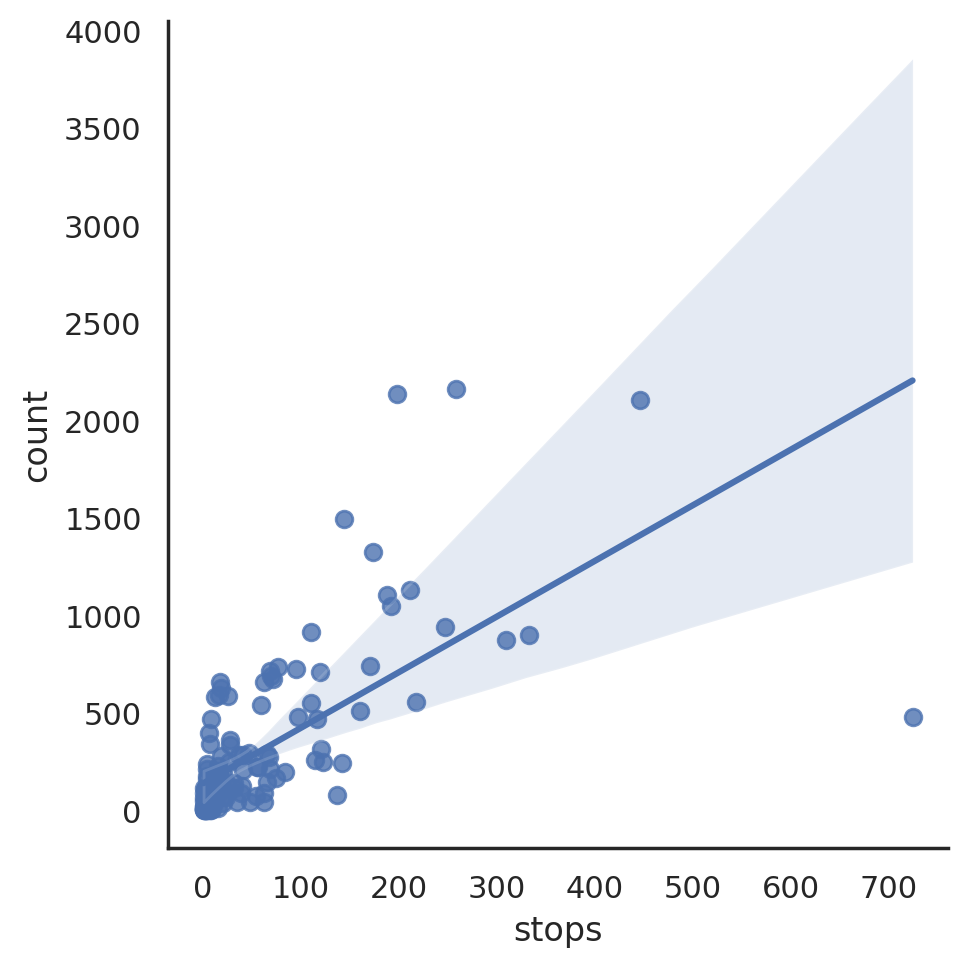

In [ ]:
sns.lmplot(
    data=stops_and_warrants_by_hex,
    x='stops',
    y='count'
)

In [ ]:
stops_and_warrants_by_hex_drop_outliers = stops_and_warrants_by_hex[
     (stops_and_warrants_by_hex['count']<2500)&
     (stops_and_warrants_by_hex['stops']<400)]

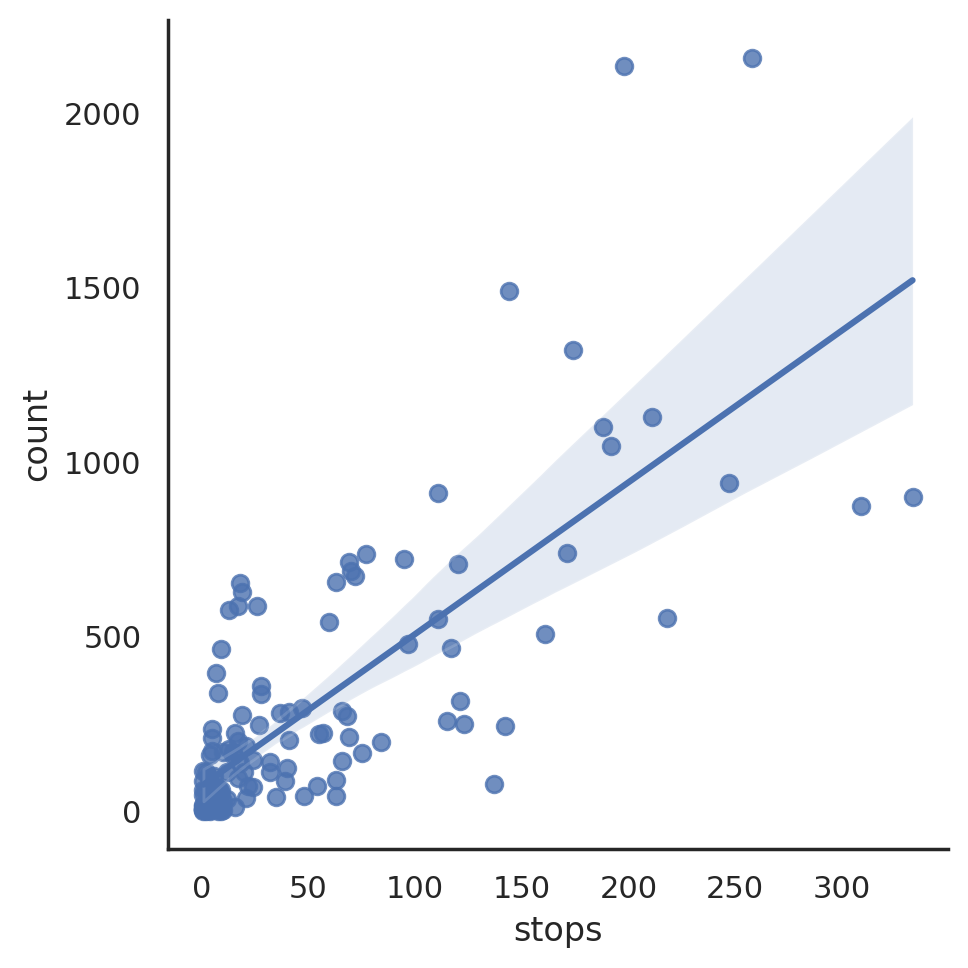

In [ ]:
sns.lmplot(
    data=stops_and_warrants_by_hex_drop_outliers,
    x='stops',
    y='count'
)

In [ ]:
lm_ = smf.ols('count ~ stops', data=stops_and_warrants_by_hex_drop_outliers).fit()
lm_.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  count   R-squared:                       0.577
Model:                            OLS   Adj. R-squared:                  0.574
Method:                 Least Squares   F-statistic:                     178.6
Date:                Mon, 09 May 2022   Prob (F-statistic):           3.15e-26
Time:                        15:44:27   Log-Likelihood:                -922.89
No. Observations:                 133   AIC:                             1850.
Df Residuals:                     131   BIC:                             1856.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     71.7775     26.809      2.677      0.008      18.744     124.812
stops          4.3548      0.326     13.362      0.000       3.710       4.999
==============================================================================
Omnibus:                       53.913   Durbin-Watson:                   2.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              197.880
Skew:                           1.446   Prob(JB):                     1.07e-43
Kurtosis:                       8.229   Cond. No.                         101.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
stops_and_warrants_by_hex_nonan = stops_and_warrants_by_hex.dropna()

In [ ]:
pm = statsmodels.discrete.discrete_model.Poisson(
    endog = stops_and_warrants_by_hex_nonan['count'],
    exog = add_constant(stops_and_warrants_by_hex_nonan['stops'])
).fit(maxiter=200)

Optimization terminated successfully.
         Current function value: 153.902361
         Iterations 7


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [ ]:
pm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                          Poisson Regression Results                          
==============================================================================
Dep. Variable:                  count   No. Observations:                  135
Model:                        Poisson   Df Residuals:                      133
Method:                           MLE   Df Model:                            1
Date:                Mon, 09 May 2022   Pseudo R-squ.:                  0.2920
Time:                        15:45:29   Log-Likelihood:                -20777.
converged:                       True   LL-Null:                       -29345.
Covariance Type:            nonrobust   LLR p-value:                     0.000
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          5.3416      0.006    884.912      0.000       5.330       5.353
stops          0.0039   2.37e-05    166.554      0.000       0.004       0.004
==============================================================================
"""

In [ ]:
y = stops_and_warrants_by_hex_nonan['count'].values.reshape((-1,1))
x = stops_and_warrants_by_hex_nonan['stops'].values.reshape((-1,1))

hexbin_centroid_coords = np.stack(stops_and_warrants_by_hex_nonan.centroid.apply(lambda p: np.asarray(p)).values)

/usr/local/lib/python3.7/dist-packages/pandas/core/apply.py:1101: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  convert=self.convert_dtype,


In [ ]:
gwr = GWR(
    y=y,
    X=x,
    coords=hexbin_centroid_coords,
    bw=range_all_bins,
    fixed=True,
    kernel='gaussian',
    spherical=False
).fit()

In [ ]:
gwr.summary()

Model type                                                         Gaussian
Number of observations:                                                 135
Number of covariates:                                                     2

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                       13093614.149
Log-likelihood:                                                    -966.616
AIC:                                                               1937.232
AICc:                                                              1939.415
BIC:                                                           13092961.748
R2:                                                                   0.429
Adj. R2:                                                              0.424

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [ ]:
result = gpd.GeoDataFrame(
    data=gwr.params, 
    columns=['c0', 'coef_stops'], 
    geometry=stops_and_warrants_by_hex_nonan['geometry'].reset_index(drop=True))
result['local R2'] = gwr.localR2

In [ ]:
result

,c0,coef_stops,geometry,local R2
0,3.472045,0.200661,"POLYGON ((2361269.281 924531.098, 2359349.711 ...",0.663012
1,4.632161,0.191802,"POLYGON ((2369135.198 927741.955, 2367215.756 ...",0.710000
2,2.792990,0.181417,"POLYGON ((2362323.129 933019.645, 2360403.633 ...",0.687540
3,4.833050,0.219987,"POLYGON ((2360215.351 916041.821, 2358295.705 ...",0.590275
4,2.195758,0.157971,"POLYGON ((2355510.591 938297.643, 2353591.042 ...",0.594979
...,...,...,...,...
130,24.791319,0.108090,"POLYGON ((2396875.242 850418.126, 2394955.623 ...",0.470712
131,31.705370,0.108442,"POLYGON ((2390063.682 855693.871, 2388144.008 ...",0.422522
132,13.059180,0.101113,"POLYGON ((2387957.987 838707.946, 2386038.162 ...",0.523795
133,15.250338,0.103774,"POLYGON ((2381145.335 843983.888, 2379225.455 ...",0.508881


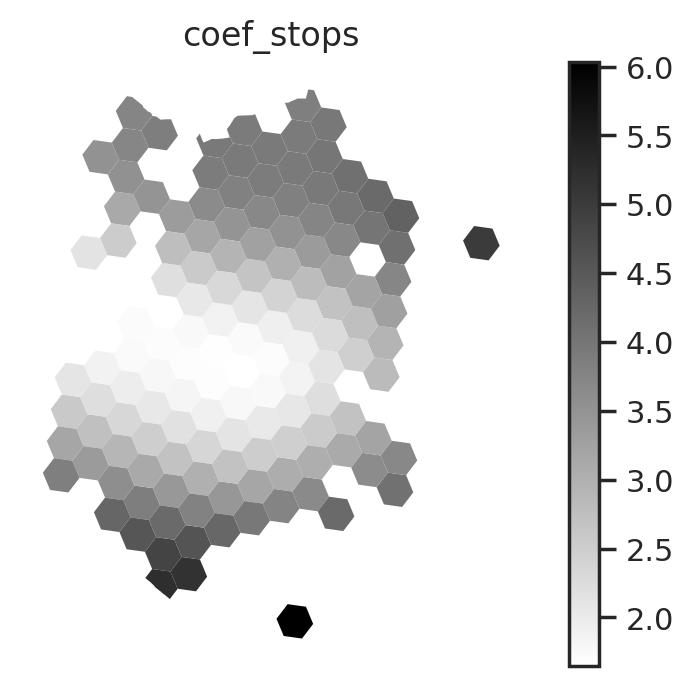

In [ ]:
result.plot(
    column='coef_stops',
    legend=True,
    cmap='binary',
    edgecolor='none')
  
plt.title('coef_stops')
plt.axis('off')
plt.show()

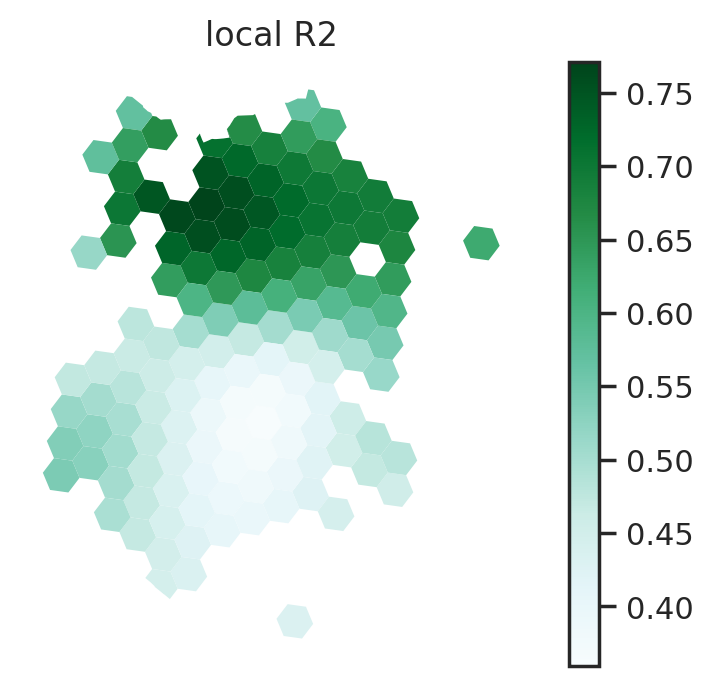

In [ ]:
result.plot(
    column='local R2',
    legend=True,
    cmap='BuGn',
    edgecolor='none')
  
plt.title('local R2')
plt.axis('off')
plt.show()

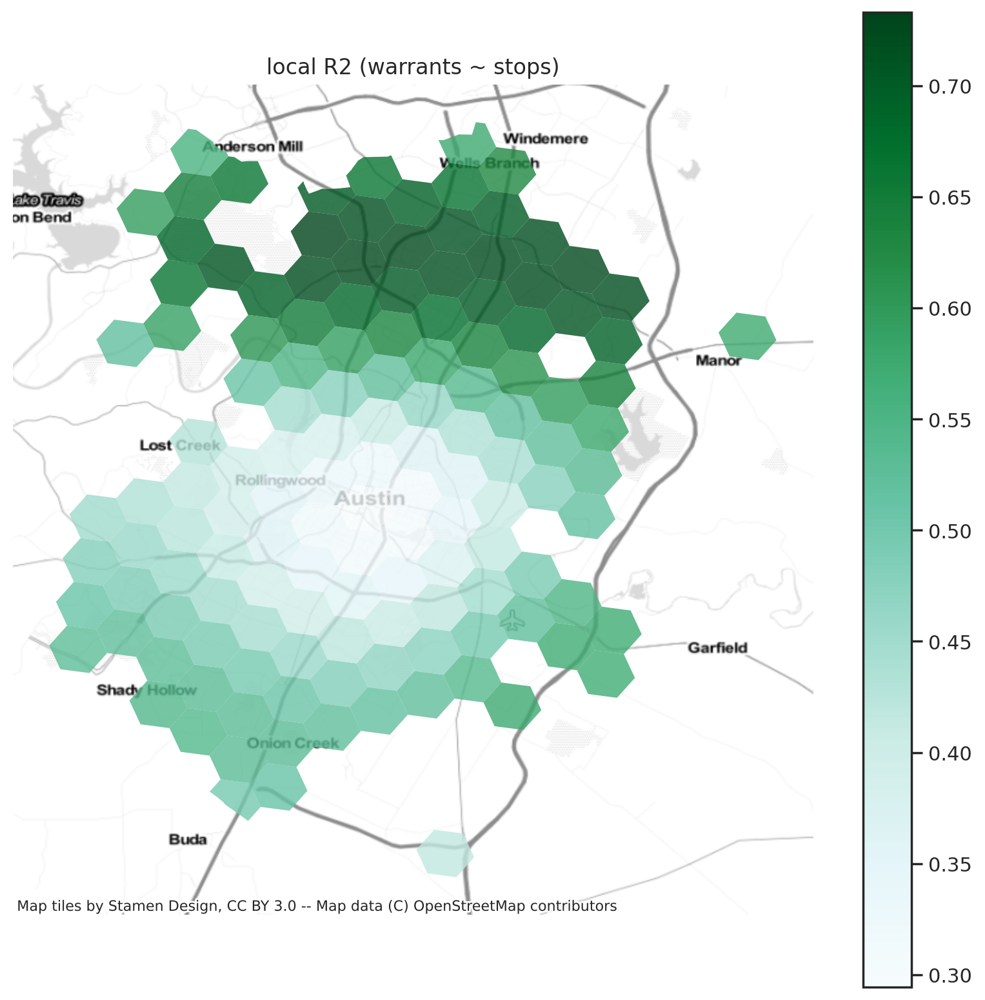

In [ ]:
fig, ax = plt.subplots(figsize=(10,10), dpi=200)

result.to_crs('epsg:4326').plot(
    column='local R2',
    legend=True,
    cmap='BuGn',
    edgecolor='none',
    alpha=0.8,
    ax=ax)
  
cx.add_basemap(
    ax, 
    crs='epsg:4326',
    source=cx.providers.Stamen.TonerLite)


plt.title('local R2 (warrants ~ stops)')
plt.axis('off')
plt.show()



In [ ]:
gwr.summary()

Model type                                                         Gaussian
Number of observations:                                                 135
Number of covariates:                                                     2

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                         687245.597
Log-likelihood:                                                    -767.681
AIC:                                                               1539.362
AICc:                                                              1541.545
BIC:                                                             686593.196
R2:                                                                   0.429
Adj. R2:                                                              0.424

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

## tract level regression

In [ ]:
#tract_features.to_file('/content/drive/MyDrive/Advanced Spatial/tract_features.geojson',driver='GeoJSON')

In [ ]:
tract_features['log_income'] = np.log(tract_features['median income'])

(0.0, 520.0)

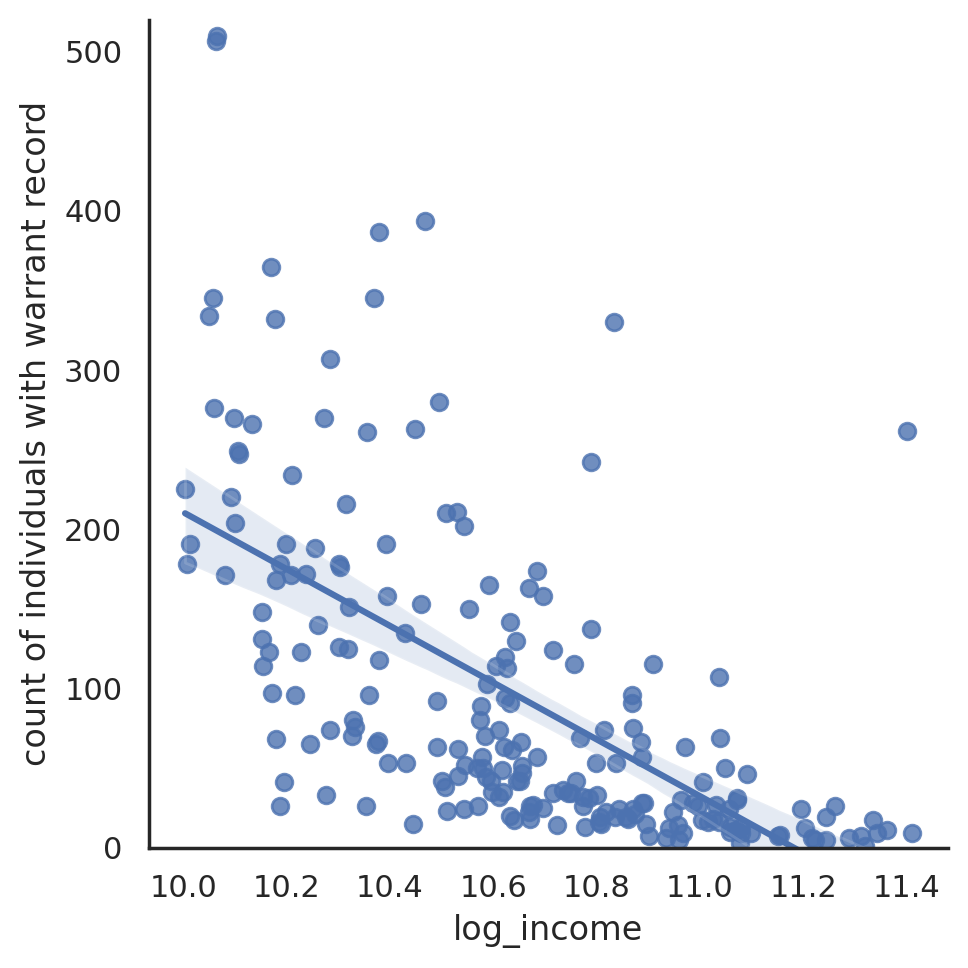

In [ ]:
sns.lmplot(
    data=tract_features[tract_features['log_income'] > 10],
    x='log_income',
    y='count of individuals with warrant record'
)

plt.ylim(0,520)

In [ ]:

# tract_features[tract_features['total population']>200].to_file('/content/drive/MyDrive/Advanced Spatial/tract_features_filtered.geojson',driver='GeoJSON')

(2328543.770174281, 2471364.417360555, 809160.6020540185, 985757.3119918888)

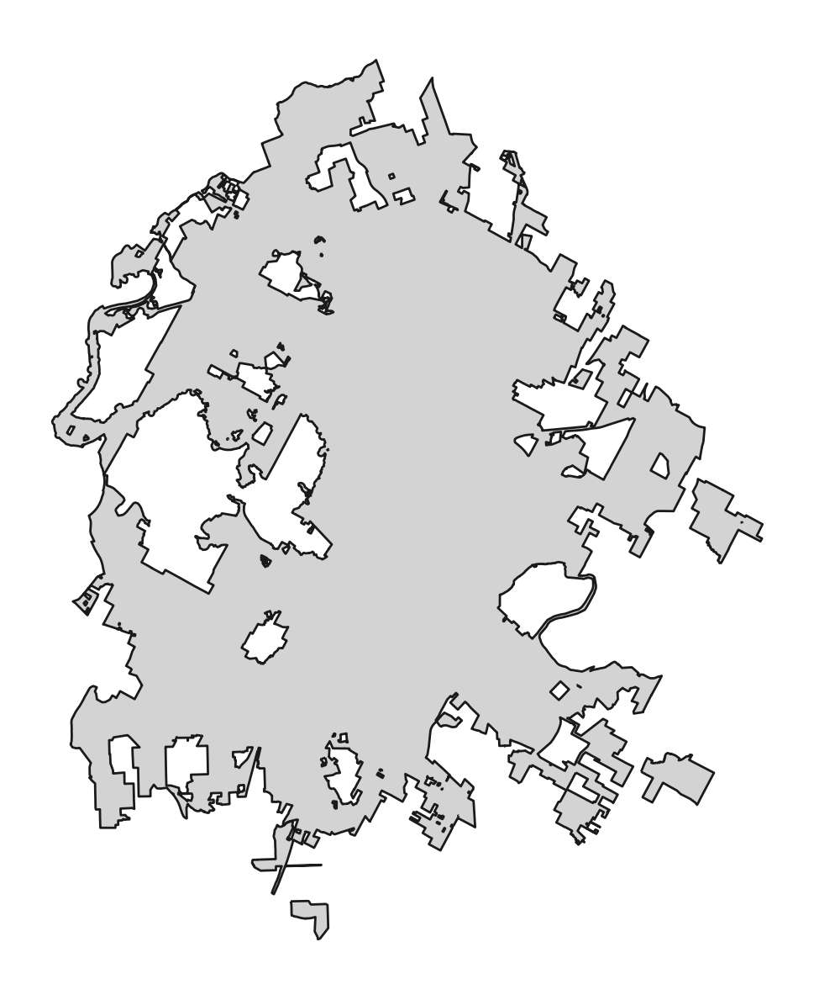

In [ ]:
fig,ax=plt.subplots(figsize=(6,8), dpi=200)

austin_bounds.plot(
   facecolor='lightgray',
   edgecolor='k',
   ax=ax
  
)
plt.axis('off')

(-97.95889240173932, -97.50704760161533, 30.05352220112607, 30.538705801001274)

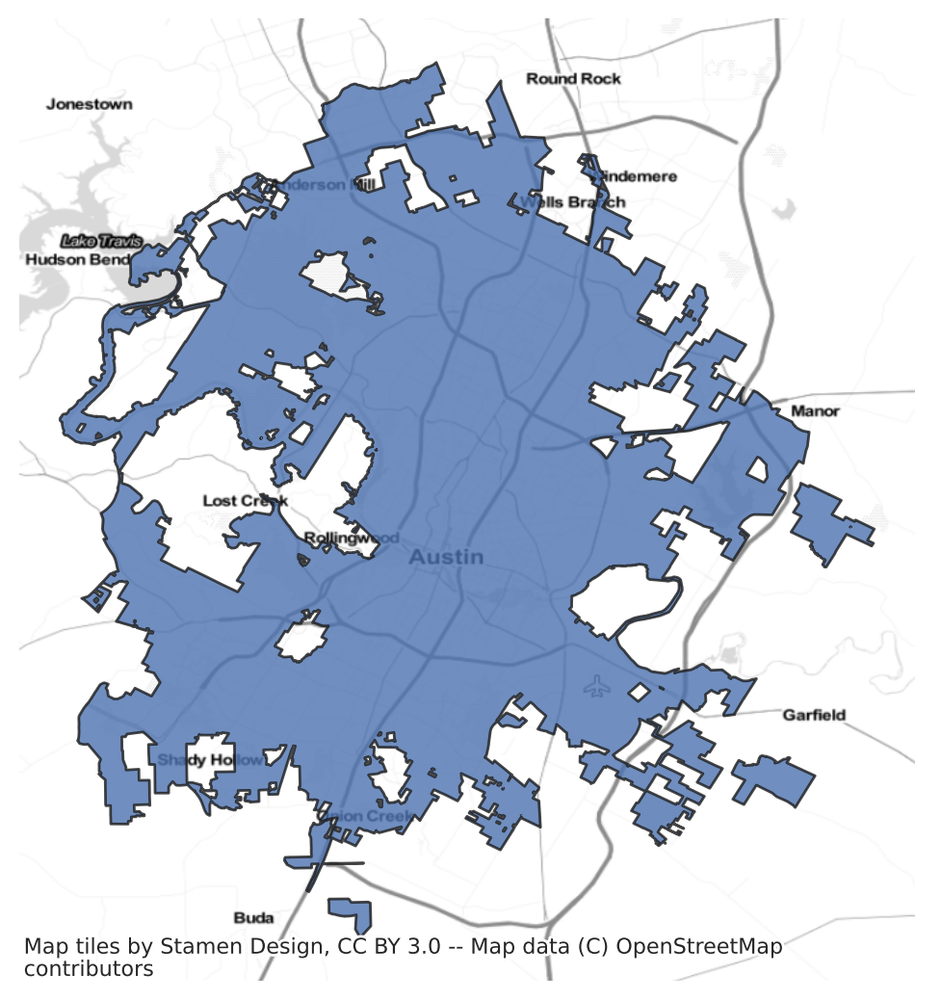

In [ ]:
fig,ax=plt.subplots(figsize=(6,8), dpi=200)

austin_bounds.to_crs('epsg:4326').plot(
   facecolor='C0',
   alpha=0.8,
   edgecolor='k',
   ax=ax
)

cx.add_basemap(
    ax, 
    crs='epsg:4326',
    source=cx.providers.Stamen.TonerLite)

plt.axis('off')

In [ ]:
tract_features.columns

Index(['GEOID', 'total population', '[denominator: total population for Race]',
       'total: White', 'total: Black', 'total: Asian',
       '[denominator: total population for Hispanic or Latino]',
       'total: Hispanic or Latino (any race)',
       '[denominator: total population for poverty]',
       'total: income below poverty level', 'median gross rent',
       '[denominator: total population for income on rent]',
       'total: paying >50 percent of income on rent', 'NAME', 'state',
       'county', 'tract', 'count of individuals with warrant record',
       'warrant prevalence', 'total tract balance', 'percent poverty',
       'mean balance', 'median income', 'most frequent citation',
       'most costly citation', 'total: households', 'total: hhs received SNAP',
       'balance per household', 'balance per household per median rent',
       'log_prevalence', 'geometry', 'stops', 'stop prevalence', 'log_income'],
      dtype='object')